# Final Project - Medium Articles Analysis

## Ying Sun

In [151]:
# load packages
import lucem_illud_2020
import sklearn
import sklearn.naive_bayes
import sklearn.tree
import sklearn.ensemble
import sklearn.neural_network
import sklearn.decomposition

import nltk #For tokenizing and normalizing
import numpy as np #arrays
import matplotlib.pyplot as plt #Plots
import matplotlib.colors # For nice colours
import seaborn as sns #Makes plots look nice, also heatmaps
import scipy as sp #for interp

#These are from the standard library
import collections
import os
import os.path
import random
import re
import glob
import pandas as pd
import requests
import json
import math

%matplotlib inline

import warnings
warnings.filterwarnings("ignore")

Medium is one of the most famous tools for spreading knowledge about almost any field. It is widely used to published articles on ML, AI, and data science. I am very interested in the following questions: How to write a good article? How to inform the reader in an interesting way? What sort of title attracts more crowd? How long an article should be?

In [144]:
# load data
medium_df = pd.read_csv('medium.csv')
medium_df.head()

,author,claps,reading_time,link,title,text
0,Justin Lee,8.3K,11,https://medium.com/swlh/chatbots-were-the-next...,Chatbots were the next big thing: what happene...,"Oh, how the headlines blared:\nChatbots were T..."
1,Conor Dewey,1.4K,7,https://towardsdatascience.com/python-for-data...,Python for Data Science: 8 Concepts You May Ha...,If you’ve ever found yourself looking up the s...
2,William Koehrsen,2.8K,11,https://towardsdatascience.com/automated-featu...,Automated Feature Engineering in Python – Towa...,Machine learning is increasingly moving from h...
3,Gant Laborde,1.3K,7,https://medium.freecodecamp.org/machine-learni...,Machine Learning: how to go from Zero to Hero ...,If your understanding of A.I. and Machine Lear...
4,Emmanuel Ameisen,935,11,https://blog.insightdatascience.com/reinforcem...,Reinforcement Learning from scratch – Insight ...,Want to learn about applied Artificial Intelli...


This dataset is the collection of 337 articles in the three fields. We can have a brief impression of this dataset, there are columns including author, claps the article received, recommended reading time, the link of this article, the title of this article and the full text of this article.

## 1. Exploratory Data Analysis

### 1.1 Unique titles & authors

In [145]:
len(medium_df)

337

In [146]:
len(medium_df['title'].unique())

230

In [147]:
len(medium_df['author'].unique())

182

Among these 337 articles, there are 230 unique titles and 182 unique authors in the field of ML, AI and data science. So there are some authors have more than one articles in these three fields and we can see who are these authors and visualize using plot.

In [148]:
name = medium_df.groupby('author').size()
name = name[(name.values>2)]
name

author
Abhishek Parbhakar          4
Adam Geitgey               16
Aman Dalmia                 3
Andrej Karpathy             5
Arjan Haring 🔮🔨             3
Arthur Juliani             10
Arvind N                    3
Blaise Aguera y Arcas       4
Conor Dewey                 3
Datafiniti                  3
David Venturi               4
Dhruv Parthasarathy         6
Dr. GP Pulipaka             3
Emmanuel Ameisen            4
Eugenio Culurciello         4
Gant Laborde                3
Gil Fewster                 4
Greg Fish                   4
Irhum Shafkat               3
Justin Lee                  4
Max Pechyonkin              4
Michael Jordan              3
Milo Spencer-Harper         8
Netflix Technology Blog     5
Per Harald Borgen           3
Sarthak Jain                5
Sebastian Heinz             3
Slav Ivanov                10
Stefan Kojouharov           5
Tal Perry                   3
Tim Anglade                 3
Vishal Maini                4
dtype: int64

In [149]:
import warnings
warnings.filterwarnings("ignore")

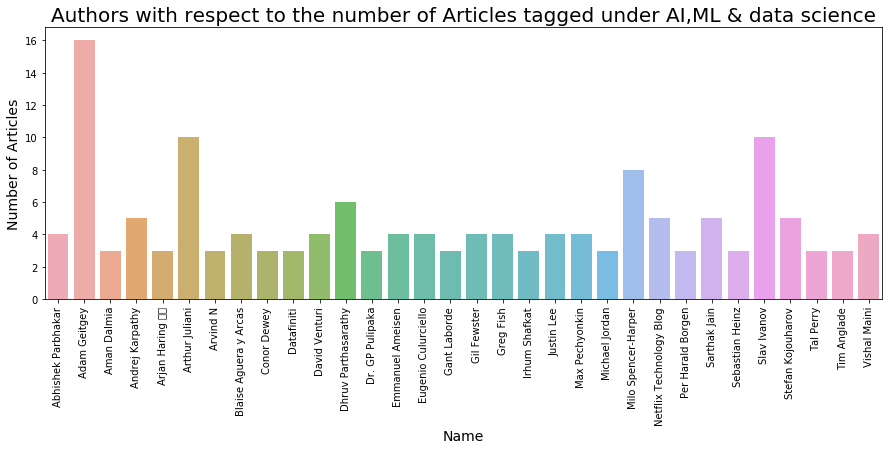

In [152]:
plt.figure(figsize=(15,5))
plt.xticks(rotation='vertical')
sns.barplot(name.index, name.values, alpha=0.8)
plt.xlabel('Name', fontsize=14)
plt.ylabel('Number of Articles', fontsize=14)
plt.title("Authors with respect to the number of Articles tagged under AI,ML & data science", fontsize=20)
plt.show()

From above plot, we can see that Adam Geitgey, Arthur Juliani and Slav Ivanov are top 3 authors with most production in these three fields.

### 1.2  WordCloud of titles

In [153]:
from wordcloud import WordCloud
from wordcloud import STOPWORDS

In [154]:
text = ""
for ind, row in medium_df.iterrows():
    text += row["title"] + " "
text = text.strip()

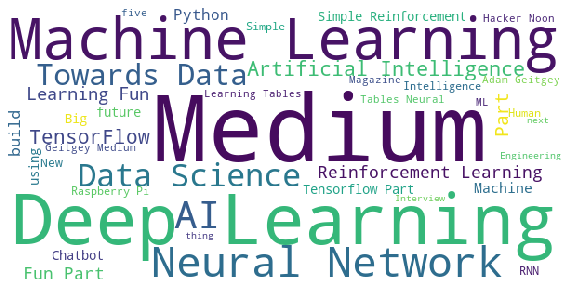

In [155]:
plt.figure(figsize=(10,10))
wordcloud = WordCloud(background_color='white', width=600, height=300, max_font_size=100, max_words=40).generate(text)
plt.imshow(wordcloud)
plt.axis("off")
plt.show()

From the above word cloud, we can see that 'Medium', 'Machine Learning', 'Deep Learning', 'Neural Network', 'AI' and 'Data Science' are the most frequent words.

### 1.3 WordCloud of articles texts

In [156]:
for i in range(0,len(medium_df)):
    medium_df['text'][i] = str(medium_df['text'][i])
text = ""
for ind, row in medium_df.iterrows():
    text += row['text'] + " "
text = text.strip()

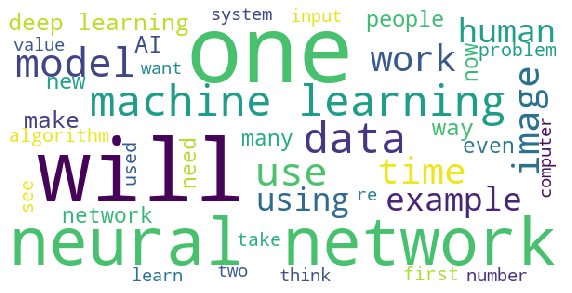

In [157]:
plt.figure(figsize=(10,10))
wordcloud = WordCloud(background_color='white', width=600, height=300, max_font_size=100, max_words=40).generate(text)
plt.imshow(wordcloud)
plt.axis("off")
plt.show()

### 1.4 Claps

In [158]:
# convert the claps into integer
for i in range(0,len(medium_df)):
    if 'K' in medium_df['claps'][i]:
        medium_df['claps'][i]= int(float(medium_df['claps'][i].replace("K",""))*1000)
    else:
        medium_df['claps'][i] = int(medium_df['claps'][i])

In [159]:
medium_df.head()

,author,claps,reading_time,link,title,text
0,Justin Lee,8300,11,https://medium.com/swlh/chatbots-were-the-next...,Chatbots were the next big thing: what happene...,"Oh, how the headlines blared:\nChatbots were T..."
1,Conor Dewey,1400,7,https://towardsdatascience.com/python-for-data...,Python for Data Science: 8 Concepts You May Ha...,If you’ve ever found yourself looking up the s...
2,William Koehrsen,2800,11,https://towardsdatascience.com/automated-featu...,Automated Feature Engineering in Python – Towa...,Machine learning is increasingly moving from h...
3,Gant Laborde,1300,7,https://medium.freecodecamp.org/machine-learni...,Machine Learning: how to go from Zero to Hero ...,If your understanding of A.I. and Machine Lear...
4,Emmanuel Ameisen,935,11,https://blog.insightdatascience.com/reinforcem...,Reinforcement Learning from scratch – Insight ...,Want to learn about applied Artificial Intelli...


In [160]:
medium_df['claps'].mean()

5406.311572700297

There are 5406 claps per article on average. So we can conclude that the articles in ML, AI and data science are quite popular.

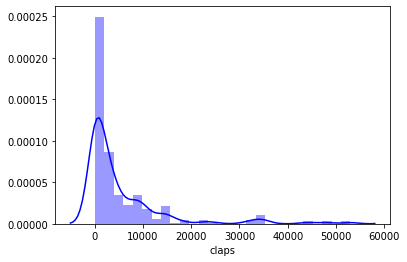

In [180]:
sns.distplot(medium_df['claps'], color="b")
plt.show()

We can find that the distribution of claps entails a fact that it is highly skewed in the right side which clearly shows that a small class of authors get high amount of claps.

In [161]:
medium_df.head()

,author,claps,reading_time,link,title,text
0,Justin Lee,8300,11,https://medium.com/swlh/chatbots-were-the-next...,Chatbots were the next big thing: what happene...,"Oh, how the headlines blared:\nChatbots were T..."
1,Conor Dewey,1400,7,https://towardsdatascience.com/python-for-data...,Python for Data Science: 8 Concepts You May Ha...,If you’ve ever found yourself looking up the s...
2,William Koehrsen,2800,11,https://towardsdatascience.com/automated-featu...,Automated Feature Engineering in Python – Towa...,Machine learning is increasingly moving from h...
3,Gant Laborde,1300,7,https://medium.freecodecamp.org/machine-learni...,Machine Learning: how to go from Zero to Hero ...,If your understanding of A.I. and Machine Lear...
4,Emmanuel Ameisen,935,11,https://blog.insightdatascience.com/reinforcem...,Reinforcement Learning from scratch – Insight ...,Want to learn about applied Artificial Intelli...


In [162]:
claps = medium_df.groupby(['author'])[['claps']].sum()

In [163]:
len(claps.index)

182

In [164]:
# select the authors that received more 7000 claps
claps = (claps[(claps['claps'] > 7000)])

In [165]:
claps

,claps
author,
Adam Geitgey,225000
Aman Agarwal,14000
Andrej Karpathy,71800
Arthur Juliani,66200
Arvind N,28500
Avinash Sharma V,13800
Bargava,11800
Blaise Aguera y Arcas,34800
David Foster,25600


In [166]:
len(claps.index)

42

In [167]:
colors =           ['#78C850',  
                    '#F08030',  
                    '#6890F0',  
                    '#A8B820',  
                    '#A8A878',  
                    '#A040A0',  
                    '#F8D030',  
                    '#E0C068',  
                    '#EE99AC',  
                    '#C03028',  
                    '#F85888',  
                    '#B8A038',  
                    '#705898',  
                    '#98D8D8',  
                    '#7038F8',  
                   ]

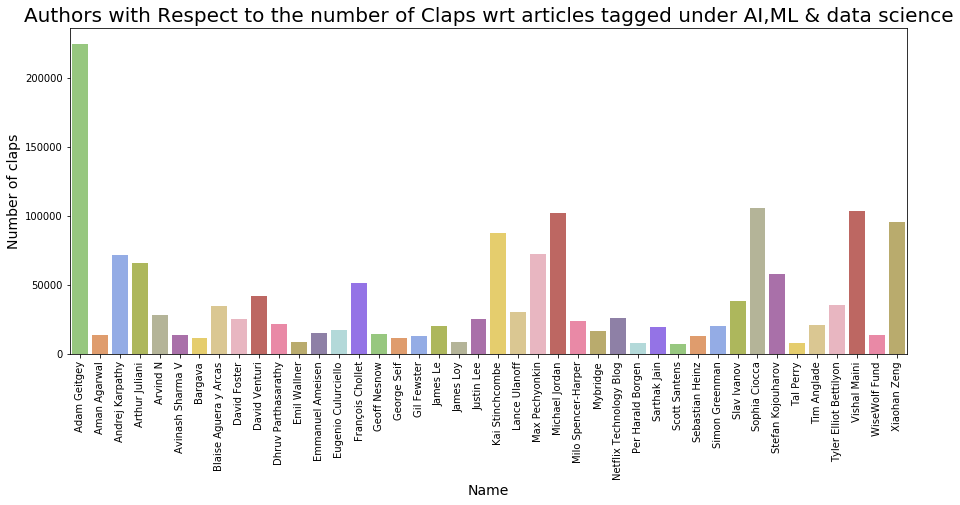

In [168]:
plt.figure(figsize=(15,6))
plt.xticks(rotation='vertical')
sns.barplot(claps.index, claps["claps"], alpha=0.8,palette=colors)
plt.xlabel('Name', fontsize=14)
plt.ylabel('Number of claps', fontsize=14)
plt.title("Authors with Respect to the number of Claps wrt articles tagged under AI,ML & data science", fontsize=20)
plt.show()

From the result above, we can find that Adam Geitgey, Michael Jordan, Sophia Ciocca, Vishal Maini are the authors that received most claps.

### 1.5 Length of article text

In [169]:
medium_df['len_text'] = medium_df['text'].str.len()

In [170]:
medium_df['len_title'] = medium_df['title'].str.len()

In [171]:
medium_df.head()

,author,claps,reading_time,link,title,text,len_text,len_title
0,Justin Lee,8300,11,https://medium.com/swlh/chatbots-were-the-next...,Chatbots were the next big thing: what happene...,"Oh, how the headlines blared:\nChatbots were T...",12129,71
1,Conor Dewey,1400,7,https://towardsdatascience.com/python-for-data...,Python for Data Science: 8 Concepts You May Ha...,If you’ve ever found yourself looking up the s...,7730,58
2,William Koehrsen,2800,11,https://towardsdatascience.com/automated-featu...,Automated Feature Engineering in Python – Towa...,Machine learning is increasingly moving from h...,14070,62
3,Gant Laborde,1300,7,https://medium.freecodecamp.org/machine-learni...,Machine Learning: how to go from Zero to Hero ...,If your understanding of A.I. and Machine Lear...,8076,60
4,Emmanuel Ameisen,935,11,https://blog.insightdatascience.com/reinforcem...,Reinforcement Learning from scratch – Insight ...,Want to learn about applied Artificial Intelli...,13784,50


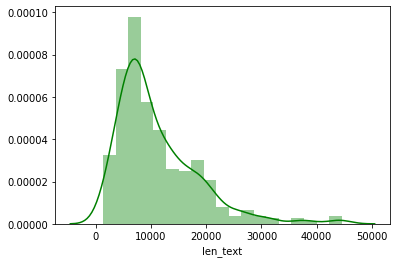

In [176]:
sns.distplot(medium_df['len_text'], color="g")
plt.show()

We can find that most of the articles are in range 5000 to 15000 characters.

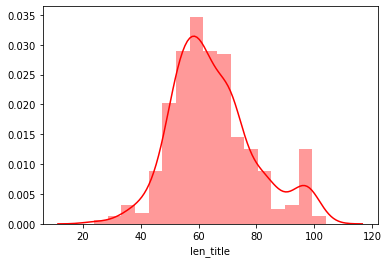

In [178]:
sns.distplot(medium_df['len_title'], color="r")
plt.show()

We can find that the curve above contains two local maxima one at about 60 characters and other at 100 characters which is quite fascinating. It implies that a specific group of writers prefer to write longer title.

### 1.6 The relationship between claps and reading time

In [186]:
medium_df['claps'] = pd.to_numeric(medium_df['claps'])

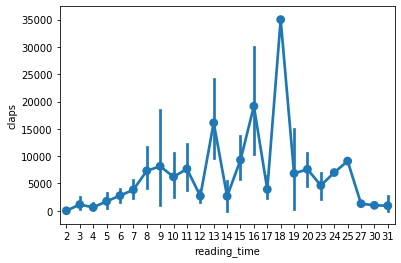

In [187]:
sns.pointplot('reading_time', 'claps', data=medium_df)
plt.show()

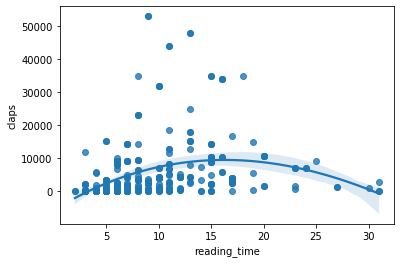

In [190]:
sns.regplot('reading_time', 'claps', data=medium_df, order=3)
plt.show()

As we can see it is beneficial to have reading time between 12 minutes and 18 minutes.It shows that readers usually inclined to read article which is not too short so that it does not contain any useful informations and not too long that it deaden their intreast.

### 1.7 The relationship between claps and text length

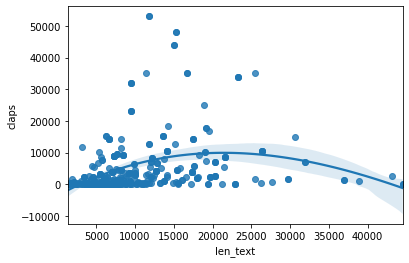

In [191]:
sns.regplot('len_text', 'claps', data=medium_df, order=3)
plt.show()

We can conclude that it is smart to write articles 15000 chars and 25000 characters.

### 1.9  Claps and title length

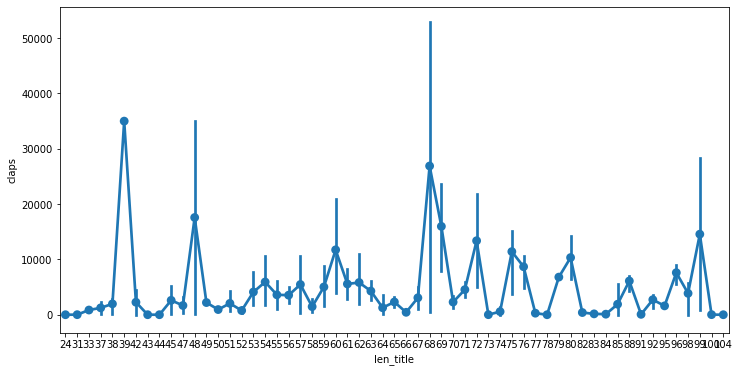

In [192]:
a4_dims = (12, 6)
fig, ax = plt.subplots(figsize=a4_dims)
sns.pointplot('len_title', 'claps', data=medium_df)
plt.show()

### 1.10 Title length and article length

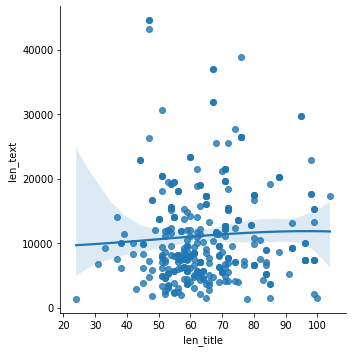

In [193]:
sns.lmplot('len_title', 'len_text', data=medium_df,order=3)
plt.show()

More clearly, we can use heatmap to see the correlation between these features.

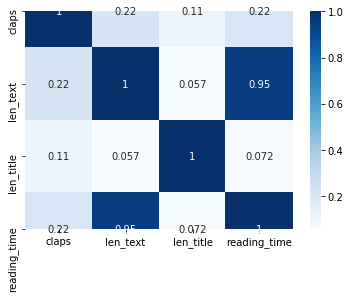

In [196]:
sns.heatmap(medium_df[['claps', 'len_text', 'len_title', 'reading_time']].corr(),annot=True, cmap="Blues")
plt.show()

Heatmap is quite obvious. Their has to be relation between reading time and text length. But their is also good correlationship between text lenght and claps which shows that readers also care about length of text along with its quality.

## 2. Top article

In [200]:
# select the article with the most claps
medium_df.sort_values(by='claps', ascending=False)

,author,claps,reading_time,link,title,text,len_text,len_title
146,Sophia Ciocca,53000,9,https://medium.com/s/story/spotifys-discover-w...,How Does Spotify Know You So Well? – Member Fe...,Member Feature Story\nA software engineer expl...,11751,68
70,Sophia Ciocca,53000,9,https://medium.com/s/story/spotifys-discover-w...,How Does Spotify Know You So Well? – Member Fe...,Member Feature Story\nA software engineer expl...,11751,68
65,Xiaohan Zeng,48000,13,https://medium.com/@XiaohanZeng/i-interviewed-...,I interviewed at five top companies in Silicon...,"In the five days from July 24th to 28th 2017, ...",15325,99
16,Xiaohan Zeng,48000,13,https://medium.com/@XiaohanZeng/i-interviewed-...,I interviewed at five top companies in Silicon...,"In the five days from July 24th to 28th 2017, ...",15325,99
218,Kai Stinchcombe,44000,11,https://medium.com/@kaistinchcombe/decentraliz...,Blockchain is not only crappy technology but a...,Blockchain is not only crappy technology but a...,15079,72
...,...,...,...,...,...,...,...,...
35,Hrishikesh Huilgolkar,1,4,https://medium.com/@hrishikeshio/traveling-san...,Traveling santa Problem — An incompetent algor...,Kaggle announced the Traveling santa problem i...,4467,59
232,Sirui Li,1,5,https://medium.com/leethree/the-evolution-a-si...,The evolution: a simple illustration – LeeThre...,In the last paragraphs of Tools vs. Assistants...,4933,62
234,Diana Filippova,1,11,https://medium.com/@dnafilippova/de-la-coop%C3...,De la coopération entre les hommes et les mac...,Originally published at www.cuberevue.com on N...,17237,104
247,paulson,1,17,https://electricliterature.com/what-could-happ...,What Could Happen If We Did Things Right: An I...,Is Kim Stanley Robinson our greatest political...,22863,98


In [201]:
top_art = medium_df.sort_values(by='claps', ascending=False).iloc[0]

In [202]:
top_art['text']

'Member Feature Story\nA software engineer explains the science behind personalized music recommendations\nPhoto by studioEAST/Getty Images\nPhoto by studioEAST/Getty Images\nThis Monday — just like every Monday before it — over 100 million Spotify users found a fresh new playlist waiting for them called Discover Weekly. It’s a custom mixtape of 30 songs they’ve never listened to before but will probably love, and it’s pretty much magic.\nI’m a huge fan of Spotify, and particularly Discover Weekly. Why? It makes me feel seen. It knows my musical tastes better than any person in my entire life ever has, and I’m consistently delighted by how satisfyingly just right it is every week, with tracks I probably would never have found myself or known I would like.\nFor those of you who live under a soundproof rock, let me introduce you to my virtual best friend:\nAs it turns out, I’m not alone in my obsession with Discover Weekly. The user base goes crazy for it, which has driven Spotify to ret

In [203]:
nlp = spacy.load('en')

In [204]:
doc = nlp(top_art['text'])

In [205]:
df_token = pd.DataFrame()

for i, token in enumerate(doc):
    df_token.loc[i, 'text'] = token.text
    df_token.loc[i, 'lemma'] = token.lemma_,
    df_token.loc[i, 'pos'] = token.pos_
    df_token.loc[i, 'tag'] = token.tag_
    df_token.loc[i, 'dep'] = token.dep_
    df_token.loc[i, 'shape'] = token.shape_
    df_token.loc[i, 'is_alpha'] = token.is_alpha
    df_token.loc[i, 'is_stop'] = token.is_stop

In [206]:
df_token

,text,lemma,pos,tag,dep,shape,is_alpha,is_stop
0,Member,Member,PROPN,NNP,compound,Xxxxx,True,False
1,Feature,"(Feature,)",PROPN,NNP,compound,Xxxxx,True,False
2,Story,"(Story,)",PROPN,NNP,ROOT,Xxxxx,True,False
3,\n,"(\n,)",SPACE,_SP,,\n,False,False
4,A,"(a,)",DET,DT,det,X,True,True
...,...,...,...,...,...,...,...,...
2322,/,"(/,)",SYM,SYM,punct,/,False,False
2323,month,"(month,)",NOUN,NN,ROOT,xxxx,True,False
2324,.,"(.,)",PUNCT,.,punct,.,False,False
2325,Upgrade,"(Upgrade,)",PROPN,NNP,ROOT,Xxxxx,True,False


Then we can visualize the structure of sentence.

In [207]:
from spacy import displacy

In [208]:
sentence_spans = list(doc.sents)
displacy.render(sentence_spans, style='dep', jupyter=True)

In [108]:
# find the entities using SpaCy and visualize
spacy.displacy.render(doc, style='ent',jupyter=True)

## 3. Top authors

In [116]:
medium_df['author'].value_counts()

Adam Geitgey           16
Slav Ivanov            10
Arthur Juliani         10
Milo Spencer-Harper     8
Dhruv Parthasarathy     6
                       ..
Wildcat2030             1
Francesco Gadaleta      1
Shi Yan                 1
Nathan Benaich          1
Gabriel Jiménez        1
Name: author, Length: 182, dtype: int64

Then we can focus on the top 5 authors in these three fields: Adam Geitgey, Slav Ivanov, Arthur Juliani, Milo Spencer-Harper and Dhruv Parthasarathy.

In [117]:
from nltk.corpus import stopwords
import string
stopwords = stopwords.words('english')
punctuations = string.punctuation

In [118]:
# Define function to s
def cleanup_text(docs):
    texts = []
    counter = 1
    for doc in docs:
        if counter % 100 == 0:
            print('Processed {} out of {}'.format(counter, len(docs)))
        counter += 1
        doc = nlp(doc, disable=['parser', 'ner'])
        tokens = [tok.lemma_.lower().strip() for tok in doc if tok.lemma_ != '-PRON-']
        tokens = [tok for tok in tokens if tok not in stopwords and tok not in punctuations]
        tokens = ' '.join(tokens)
        texts.append(tokens)
    return pd.Series(texts)

### 3.1 Adam Geitgey

In [119]:
def make_barplot_for_author(Author):
    author_text = [text for text in medium_df.loc[medium_df['author'] == Author]['text']]

    author_clean = cleanup_text(author_text)
    author_clean = ' '.join(author_clean).split()
    author_clean = [word for word in author_clean if word not in '\'s']
    author_counts = Counter(author_clean)

    NUM_WORDS = 25
    author_common_words = [word[0] for word in author_counts.most_common(NUM_WORDS)]
    author_common_counts = [word[1] for word in author_counts.most_common(NUM_WORDS)]

    plt.figure(figsize=(15, 12))
    sns.barplot(x=author_common_counts, y=author_common_words)
    plt.title('Words that {} use frequently'.format(Author), fontsize=20)
    plt.show()

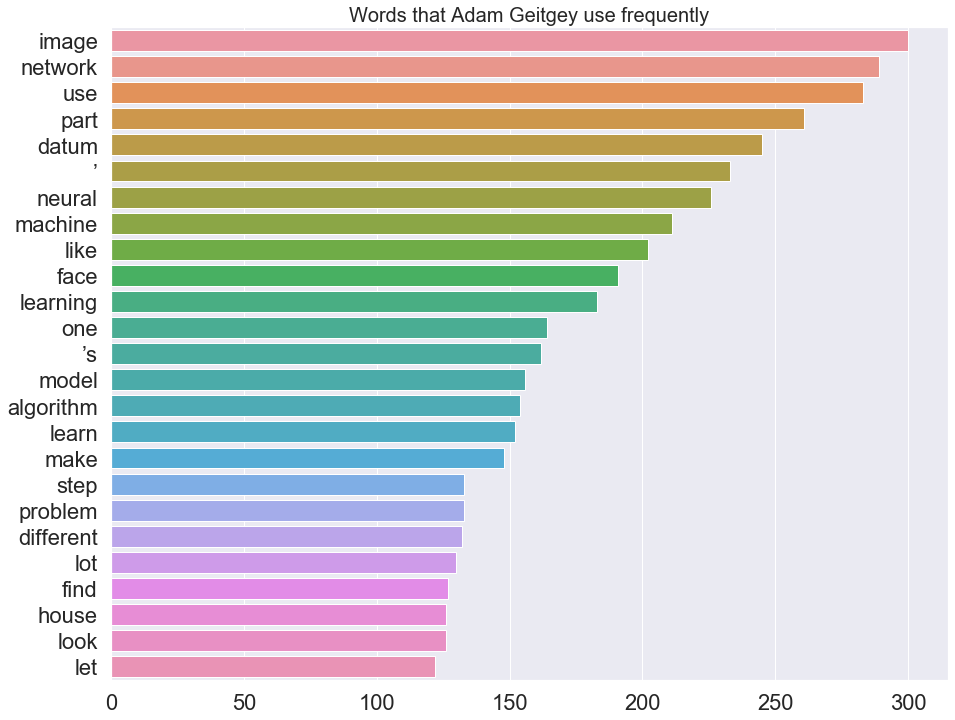

In [120]:
Author = 'Adam Geitgey'
make_barplot_for_author(Author)

Adam Geitgey's most frequent used words are image and network. The result above implies that this author may focus on the image recoginition using neural network. We can take a look at the titles of his articles.

In [121]:
# the article titles of Adam Geitgey
for title in medium_df.loc[medium_df['author'] == 'Adam Geitgey']['title']:
    print(title)

Machine Learning is Fun! – Adam Geitgey – Medium
Machine Learning is Fun! Part 3: Deep Learning and Convolutional Neural Networks
Machine Learning is Fun! Part 4: Modern Face Recognition with Deep Learning
Machine Learning is Fun! Part 2 – Adam Geitgey – Medium
Machine Learning is Fun! – Adam Geitgey – Medium
Machine Learning is Fun! Part 3: Deep Learning and Convolutional Neural Networks
Machine Learning is Fun! Part 4: Modern Face Recognition with Deep Learning
Machine Learning is Fun! Part 2 – Adam Geitgey – Medium
Machine Learning is Fun Part 6: How to do Speech Recognition with Deep Learning
Machine Learning is Fun Part 5: Language Translation with Deep Learning and the Magic of Sequences
Machine Learning is Fun! Part 2 – Adam Geitgey – Medium
Machine Learning is Fun! Part 2 – Adam Geitgey – Medium
Machine Learning is Fun Part 6: How to do Speech Recognition with Deep Learning
Machine Learning is Fun Part 5: Language Translation with Deep Learning and the Magic of Sequences
Machin

We can find that Adam Geitgey published many articles related to face recognition, speech recognition and language translation.

### 3.2 Slav Ivanov

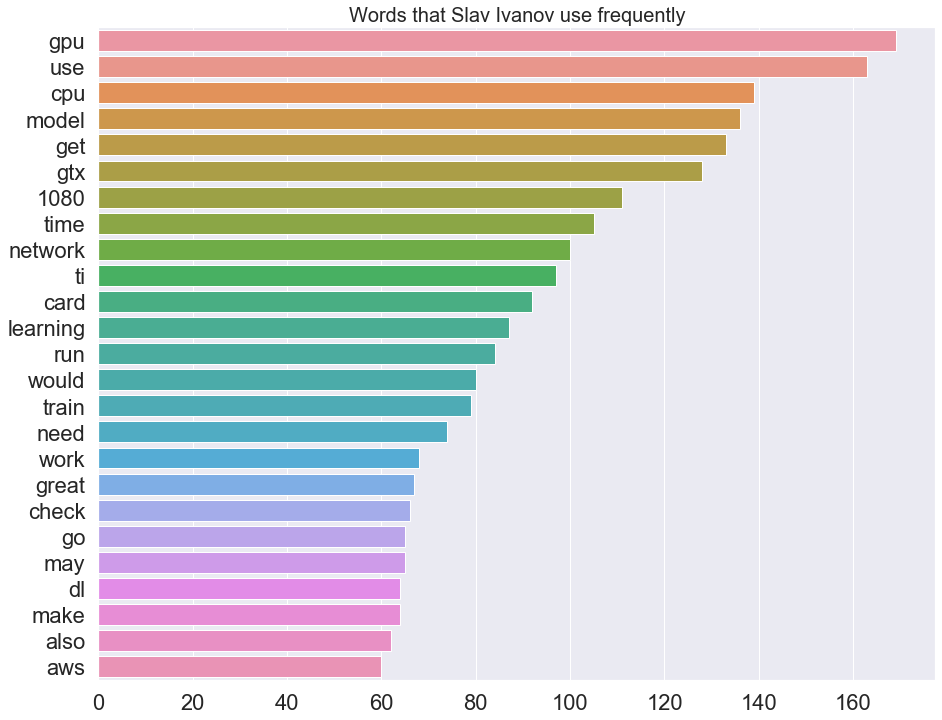

In [122]:
Author = 'Slav Ivanov'
make_barplot_for_author(Author)

The most frequent used words for Slav Ivanov are gpu, model and network. So we can have a initial guess that Slav Ivanov may focus on the deep learning using gpu. Let's take a look at the titles of his articles.

In [123]:
for title in medium_df.loc[medium_df['author'] == 'Slav Ivanov']['title']:
    print(title)

The $1700 great Deep Learning box: Assembly, setup and benchmarks
The $1700 great Deep Learning box: Assembly, setup and benchmarks
The $1700 great Deep Learning box: Assembly, setup and benchmarks
The $1700 great Deep Learning box: Assembly, setup and benchmarks
37 Reasons why your Neural Network is not working – Slav
The $1700 great Deep Learning box: Assembly, setup and benchmarks
37 Reasons why your Neural Network is not working – Slav
Picking a GPU for Deep Learning – Slav
37 Reasons why your Neural Network is not working – Slav
Picking a GPU for Deep Learning – Slav


From the titles above, we can confirm our initial guess that this author specializes in the area of deep learning.

### 3.3 Arthur Juliani

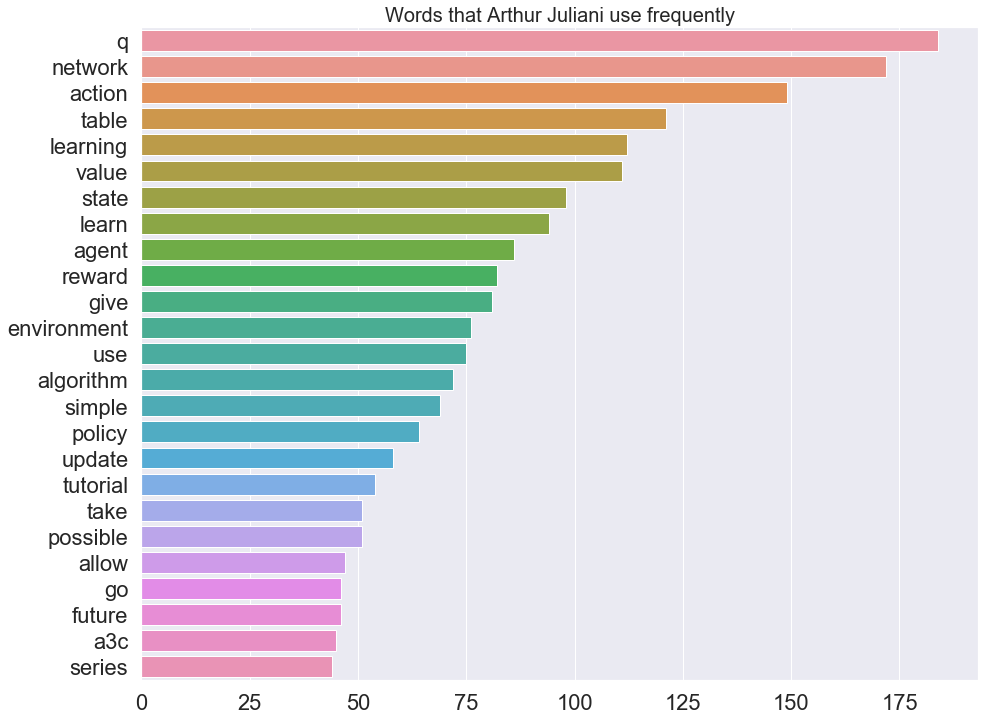

In [124]:
Author = 'Arthur Juliani'
make_barplot_for_author(Author)

We can find that the most frequent words of Arthur Juliani are network and action. Some words like "agent", "reward" may related to reinforcement learning. Then we can take a look at the titles.

In [125]:
for title in medium_df.loc[medium_df['author'] == 'Arthur Juliani']['title']:
    print(title)

Simple Reinforcement Learning with Tensorflow Part 0: Q-Learning with Tables and Neural Networks
Simple Reinforcement Learning with Tensorflow Part 0: Q-Learning with Tables and Neural Networks
Simple Reinforcement Learning with Tensorflow Part 0: Q-Learning with Tables and Neural Networks
Simple Reinforcement Learning with Tensorflow Part 8: Asynchronous Actor-Critic Agents (A3C)
Simple Reinforcement Learning with Tensorflow Part 4: Deep Q-Networks and Beyond
Simple Reinforcement Learning with Tensorflow Part 0: Q-Learning with Tables and Neural Networks
Simple Reinforcement Learning with Tensorflow Part 0: Q-Learning with Tables and Neural Networks
Simple Reinforcement Learning with Tensorflow Part 8: Asynchronous Actor-Critic Agents (A3C)
Simple Reinforcement Learning with Tensorflow Part 0: Q-Learning with Tables and Neural Networks
Simple Reinforcement Learning with Tensorflow Part 8: Asynchronous Actor-Critic Agents (A3C)


From the listed titles above, we can find that this author specializes in reinforcement learning and the articles he wrote seem like a series of reinforcement learning using Tensorflow.

### 3.4 Milo Spencer-Harper

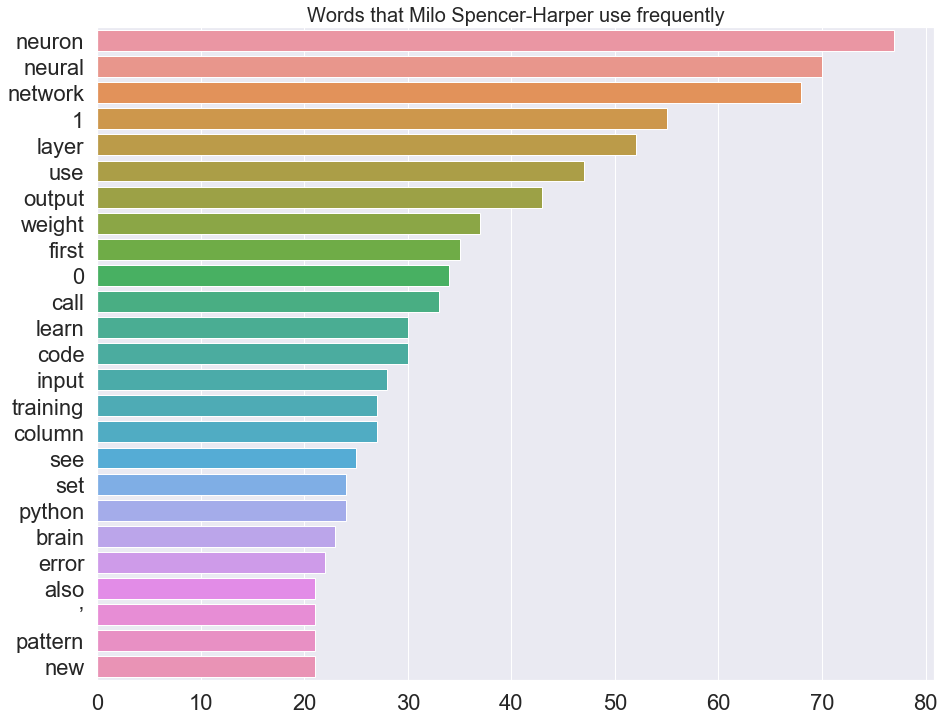

In [126]:
Author = 'Milo Spencer-Harper'
make_barplot_for_author(Author)

The most frequent used words of Milo Spencer-Harper are "neuron", "neural", "network" and "layer". We can have an inference that this author mainly contributes to deep learning and neural network.

In [127]:
for title in medium_df.loc[medium_df['author'] == 'Milo Spencer-Harper']['title']:
    print(title)

How to build a simple neural network in 9 lines of Python code
How to build a simple neural network in 9 lines of Python code
How to build a multi-layered neural network in Python
How to build a multi-layered neural network in Python
Video of a neural network learning – Deep Learning 101 – Medium
How to build a multi-layered neural network in Python
How to create a mind: The secret of human thought revealed
Thanks so much for your response Jared. Really glad you enjoyed reading it.


From the titles above, we can find that this author specializes in neural network, which is in line with our guess.

### 3.5 Dhruv Parthasarathy

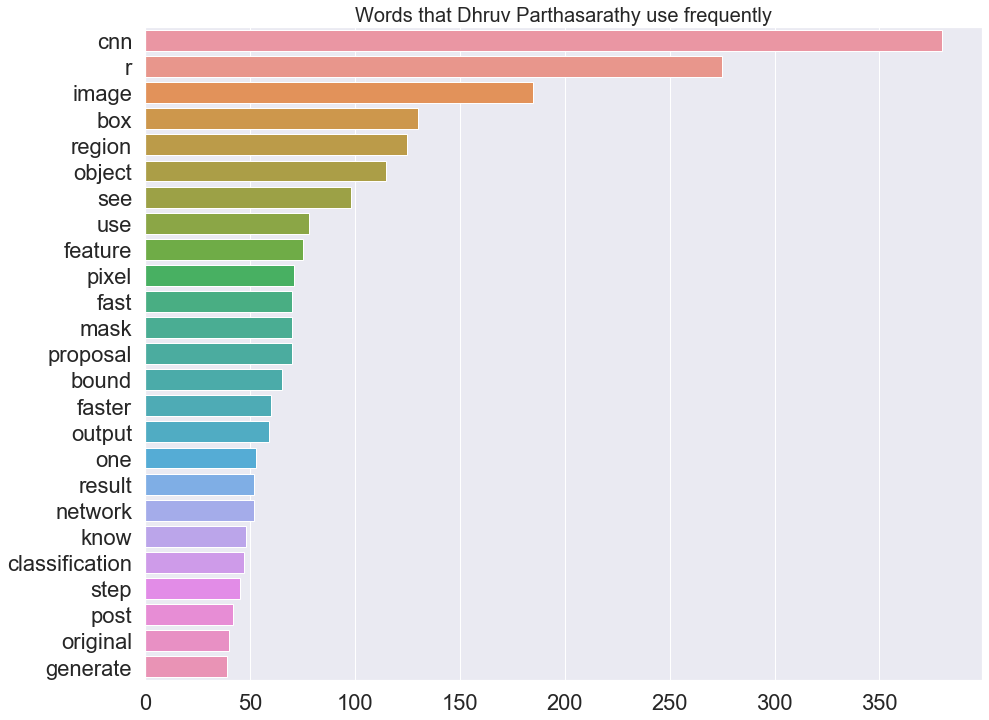

In [128]:
Author = 'Dhruv Parthasarathy'
make_barplot_for_author(Author)

The most frequent used words of Dhruv Parthasarathy are "cnn", "r" and 'image'. We can make an inference that this author is focused on CNN and image.

In [129]:
for title in medium_df.loc[medium_df['author'] == 'Dhruv Parthasarathy']['title']:
    print(title)

A Brief History of CNNs in Image Segmentation: From R-CNN to Mask R-CNN
A Brief History of CNNs in Image Segmentation: From R-CNN to Mask R-CNN
A Brief History of CNNs in Image Segmentation: From R-CNN to Mask R-CNN
A Brief History of CNNs in Image Segmentation: From R-CNN to Mask R-CNN
A Brief History of CNNs in Image Segmentation: From R-CNN to Mask R-CNN
Write an AI to win at Pong from scratch with Reinforcement Learning


From the titles above, we can confirm that this author mainly contributes to the CNN and image segmentation.

## 4. Classification

In [130]:
medium_df.head()

,author,claps,reading_time,link,title,text
0,Justin Lee,8300,11,https://medium.com/swlh/chatbots-were-the-next...,Chatbots were the next big thing: what happene...,"Oh, how the headlines blared:\nChatbots were T..."
1,Conor Dewey,1400,7,https://towardsdatascience.com/python-for-data...,Python for Data Science: 8 Concepts You May Ha...,If you’ve ever found yourself looking up the s...
2,William Koehrsen,2800,11,https://towardsdatascience.com/automated-featu...,Automated Feature Engineering in Python – Towa...,Machine learning is increasingly moving from h...
3,Gant Laborde,1300,7,https://medium.freecodecamp.org/machine-learni...,Machine Learning: how to go from Zero to Hero ...,If your understanding of A.I. and Machine Lear...
4,Emmanuel Ameisen,935,11,https://blog.insightdatascience.com/reinforcem...,Reinforcement Learning from scratch – Insight ...,Want to learn about applied Artificial Intelli...


In [141]:
medium_df['claps'] = pd.to_numeric(medium_df['claps'])

In [142]:
medium_df.describe()

,claps,reading_time
count,337.000000,337.000000
mean,5406.311573,9.700297
std,9089.187145,5.482855
min,1.000000,2.000000
25%,157.000000,6.000000
50%,2000.000000,8.000000
75%,7000.000000,13.000000
max,53000.000000,31.000000


Here we can use their quartile as cut-off points to divide all these articles into 4 categories: 'least_popular', 'less_popular', 'medium_popular' and 'most popular'.

In [144]:
medium_df['category'] = pd.qcut(medium_df['claps'], 4, labels=["least_popular", "less_popular", "more_popular", "most_popular"])

In [145]:
medium_df.head()

,author,claps,reading_time,link,title,text,category
0,Justin Lee,8300,11,https://medium.com/swlh/chatbots-were-the-next...,Chatbots were the next big thing: what happene...,"Oh, how the headlines blared:\nChatbots were T...",most_popular
1,Conor Dewey,1400,7,https://towardsdatascience.com/python-for-data...,Python for Data Science: 8 Concepts You May Ha...,If you’ve ever found yourself looking up the s...,less_popular
2,William Koehrsen,2800,11,https://towardsdatascience.com/automated-featu...,Automated Feature Engineering in Python – Towa...,Machine learning is increasingly moving from h...,more_popular
3,Gant Laborde,1300,7,https://medium.freecodecamp.org/machine-learni...,Machine Learning: how to go from Zero to Hero ...,If your understanding of A.I. and Machine Lear...,less_popular
4,Emmanuel Ameisen,935,11,https://blog.insightdatascience.com/reinforcem...,Reinforcement Learning from scratch – Insight ...,Want to learn about applied Artificial Intelli...,less_popular


In [146]:
# tokenize and normalize
medium_df['tokenized_text'] = medium_df['text'].apply(lambda x: lucem_illud_2020.word_tokenize(x))
medium_df['normalized_text'] = medium_df['tokenized_text'].apply(lambda x: lucem_illud_2020.normalizeTokens(x))

In [147]:
medium_df.head()

,author,claps,reading_time,link,title,text,category,tokenized_text,normalized_text
0,Justin Lee,8300,11,https://medium.com/swlh/chatbots-were-the-next...,Chatbots were the next big thing: what happene...,"Oh, how the headlines blared:\nChatbots were T...",most_popular,"[Oh, how, the, headlines, blared, Chatbots, we...","[oh, headline, blare, chatbots, big, thing, ho..."
1,Conor Dewey,1400,7,https://towardsdatascience.com/python-for-data...,Python for Data Science: 8 Concepts You May Ha...,If you’ve ever found yourself looking up the s...,less_popular,"[If, you, ’ve, ever, found, yourself, looking,...","[have, find, look, question, concept, syntax, ..."
2,William Koehrsen,2800,11,https://towardsdatascience.com/automated-featu...,Automated Feature Engineering in Python – Towa...,Machine learning is increasingly moving from h...,more_popular,"[Machine, learning, is, increasingly, moving, ...","[machine, learn, increasingly, move, hand, des..."
3,Gant Laborde,1300,7,https://medium.freecodecamp.org/machine-learni...,Machine Learning: how to go from Zero to Hero ...,If your understanding of A.I. and Machine Lear...,less_popular,"[If, your, understanding, of, A.I., and, Machi...","[understand, a.i, machine, learn, big, questio..."
4,Emmanuel Ameisen,935,11,https://blog.insightdatascience.com/reinforcem...,Reinforcement Learning from scratch – Insight ...,Want to learn about applied Artificial Intelli...,less_popular,"[Want, to, learn, about, applied, Artificial, ...","[want, learn, apply, artificial, intelligence,..."


In [148]:
# split the dataset into training data and testing data
holdBackFraction = .2
train_df, test_df = lucem_illud_2020.trainTestSplit(medium_df, holdBackFraction=holdBackFraction)

### 4.1 Logistic Classification

In [154]:
# turn the training dataset into a tf-idf matrix
TFVectorizer = sklearn.feature_extraction.text.TfidfVectorizer(max_df=100, min_df=2, stop_words='english', norm='l2')
TFVects = TFVectorizer.fit_transform(train_df['text'])

In [155]:
TFVects.shape

(270, 10380)

In [156]:
# save it into a dataframe
train_df['vect'] = [np.array(v).flatten() for v in TFVects.todense()]

# implement PCA
pca = sklearn.decomposition.PCA()
reduced_data = pca.fit_transform(np.stack(train_df['vect'], axis=0))

# store the pca space vectors in the dataframe
train_df['pca'] = [r for r in reduced_data]

In [160]:
import warnings
warnings.filterwarnings("ignore")

'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches

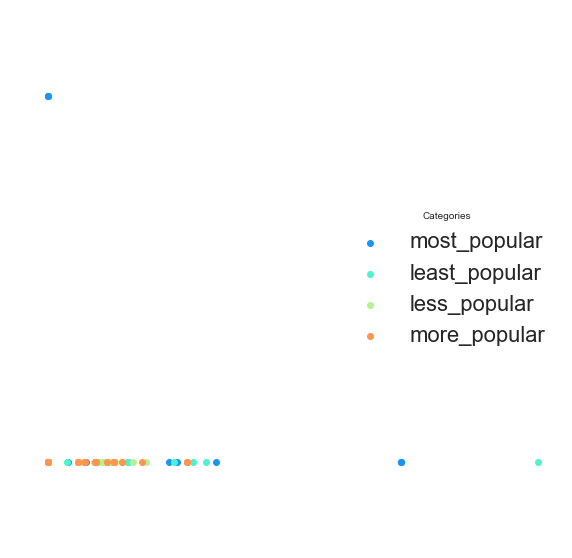

In [161]:
lucem_illud_2020.plotter(train_df)

In [181]:
# logistic classfication without dimension reduction

logistic_full = sklearn.linear_model.LogisticRegression()
logistic_full.fit(np.stack(train_df['vect'], axis=0), train_df['category'])
# Training data
print(logistic_full.score(np.stack(train_df['vect'], axis=0), train_df['category']))
# Testing data
print(logistic_full.score(np.stack(test_df['vect'], axis=0), test_df['category']))

0.9925925925925926
0.6716417910447762


In [182]:
lucem_illud_2020.evaluateClassifier(logistic_full, test_df)

,Error_Rate,AUC,Precision,Average_Precision,Recall
Category,,,,,
most_popular,0.044776,0.931176,0.9375,0.857057,0.882353
less_popular,0.268657,0.643411,0.8000,0.505473,0.333333
least_popular,0.208955,0.841644,0.5000,0.479211,0.928571
more_popular,0.134328,0.820455,0.6000,0.494776,0.750000


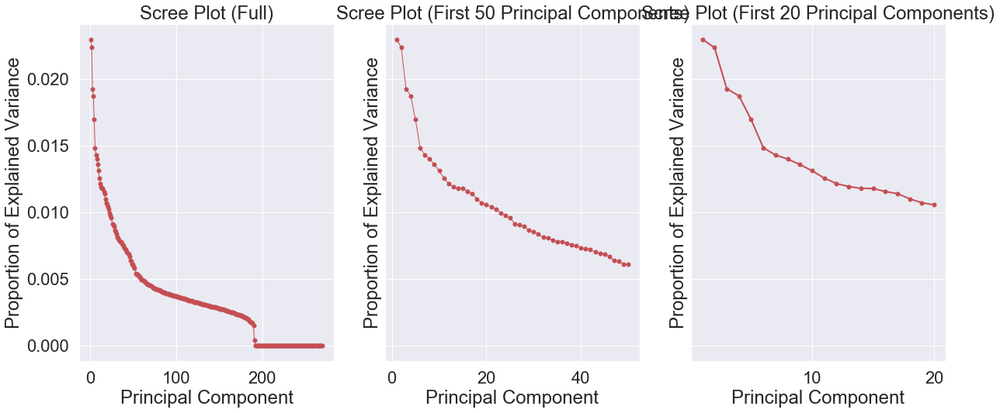

In [167]:
# find the optimal number of principle components
n = len(train_df)
# Initialize
fig, (ax1, ax2, ax3) = plt.subplots(ncols=3, figsize = (20, 8), sharey=True)
# 1
eigen_vals = np.arange(n) + 1
ax1.plot(eigen_vals, pca.explained_variance_ratio_, 'ro-', linewidth=1)
ax1.set_title('Scree Plot (Full)')
ax1.set_xlabel('Principal Component')
ax1.set_ylabel('Proportion of Explained Variance')
# 2
eigen_vals = np.arange(50) + 1
ax2.plot(eigen_vals, pca.explained_variance_ratio_[:50], 'ro-', linewidth=1)
ax2.set_title('Scree Plot (First 50 Principal Components)')
ax2.set_xlabel('Principal Component')
ax2.set_ylabel('Proportion of Explained Variance')
# 3
eigen_vals = np.arange(20) + 1
ax3.plot(eigen_vals, pca.explained_variance_ratio_[:20], 'ro-', linewidth=2)
ax3.set_title('Scree Plot (First 20 Principal Components)')
ax3.set_xlabel('Principal Component')
ax3.set_ylabel('Proportion of Explained Variance')
# Plot
plt.show()

In [174]:
# So we can choose the first 10 principle components
train_df['pca_reduced_10'] = train_df['pca'].apply(lambda x: x[:10])

In [175]:
# fit a logistic regression
logistic = sklearn.linear_model.LogisticRegression()
logistic.fit(np.stack(train_df['pca_reduced_10'], axis=0), train_df['category'])

LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
                   intercept_scaling=1, l1_ratio=None, max_iter=100,
                   multi_class='auto', n_jobs=None, penalty='l2',
                   random_state=None, solver='lbfgs', tol=0.0001, verbose=0,
                   warm_start=False)

In [176]:
# See the performance on the training dataset
logistic.score(np.stack(train_df['pca_reduced_10'], axis=0), train_df['category'])

0.44814814814814813

Unfortunately, the accuracy is only about 45%. Let's take a look at the testing dataset.

In [179]:
# apply model on testing dataset

#Create vectors
TFVects_test = TFVectorizer.transform(test_df['text'])
test_df['vect'] = [np.array(v).flatten() for v in TFVects_test.todense()]

#PCA
reduced_data_test = pca.transform(np.stack(test_df['vect'], axis=0))
test_df['pca'] = [r for r in reduced_data_test]
test_df['pca_reduced_10'] = test_df['pca'].apply(lambda x: x[:10])

#Test
logistic.score(np.stack(test_df['pca_reduced_10'], axis=0), test_df['category'])

0.31343283582089554

Not surprisingly, it still performs bad on testing set. We may considering using penalty.

In [184]:
## With l2 panelty
logistic_l2= sklearn.linear_model.LogisticRegression(penalty='l2')
logistic_l2.fit(np.stack(train_df['vect'], axis=0), train_df['category'])
# Training data
print(logistic_l2.score(np.stack(train_df['vect'], axis=0), train_df['category']))
# Testing data
print(logistic_l2.score(np.stack(test_df['vect'], axis=0), test_df['category']))

0.9925925925925926
0.6716417910447762


In [185]:
lucem_illud_2020.evaluateClassifier(logistic_l2, test_df)

,Error_Rate,AUC,Precision,Average_Precision,Recall
Category,,,,,
most_popular,0.044776,0.931176,0.9375,0.857057,0.882353
less_popular,0.268657,0.643411,0.8000,0.505473,0.333333
least_popular,0.208955,0.841644,0.5000,0.479211,0.928571
more_popular,0.134328,0.820455,0.6000,0.494776,0.750000


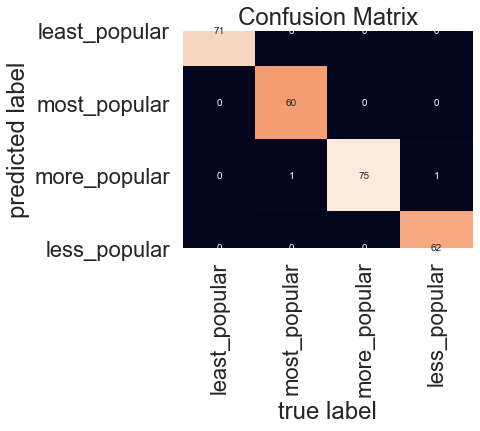

In [187]:
test_df['logistic_penalty_predict'] = logistic_l2.predict(np.stack(test_df['vect'], axis=0))
# Confusion Matrix for Training Data
lucem_illud_2020.plotConfusionMatrix(logistic_l2, train_df)

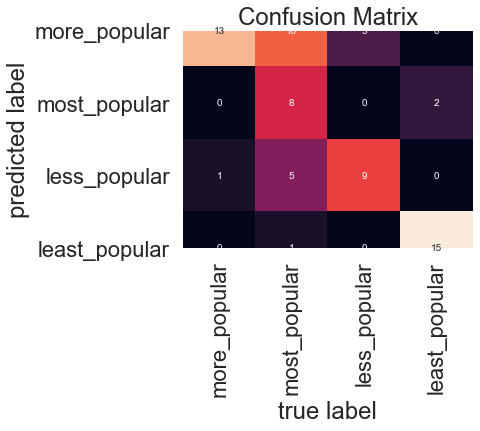

In [188]:
# Confusion Matrix for Testing Data
lucem_illud_2020.plotConfusionMatrix(logistic_l2, test_df)

In [189]:
# More Evaluation
print('Accuracy Score: ', sklearn.metrics.accuracy_score(test_df['category'], test_df['logistic_penalty_predict']))
print('Precision Score: ', sklearn.metrics.precision_score(test_df['category'], test_df['logistic_penalty_predict'],average = 'weighted'))
print('Recall: ', sklearn.metrics.recall_score( test_df['category'], test_df['logistic_penalty_predict'], average = 'weighted'))
print('F1 Score: ', sklearn.metrics.f1_score(test_df['category'], test_df['logistic_penalty_predict'], average = 'weighted'))

Accuracy Score:  0.6716417910447762
Precision Score:  0.7363805970149254
Recall:  0.6716417910447762
F1 Score:  0.6544576582328996


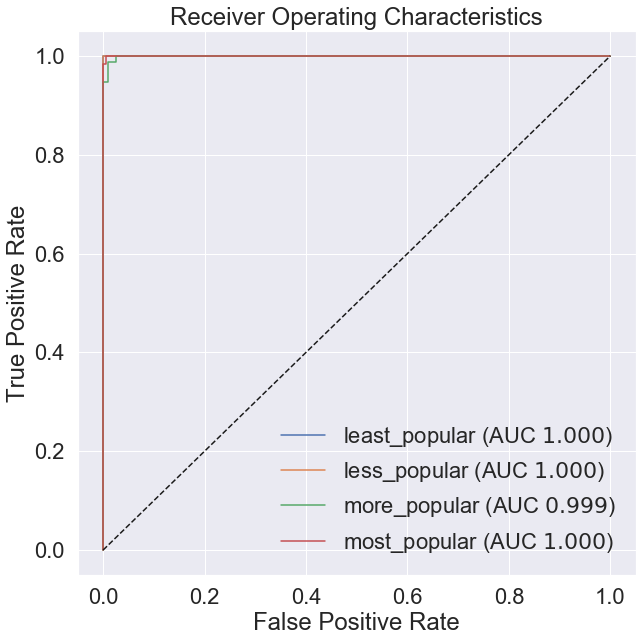

In [190]:
# ROC for Training Data
lucem_illud_2020.plotMultiROC(logistic_l2, train_df)

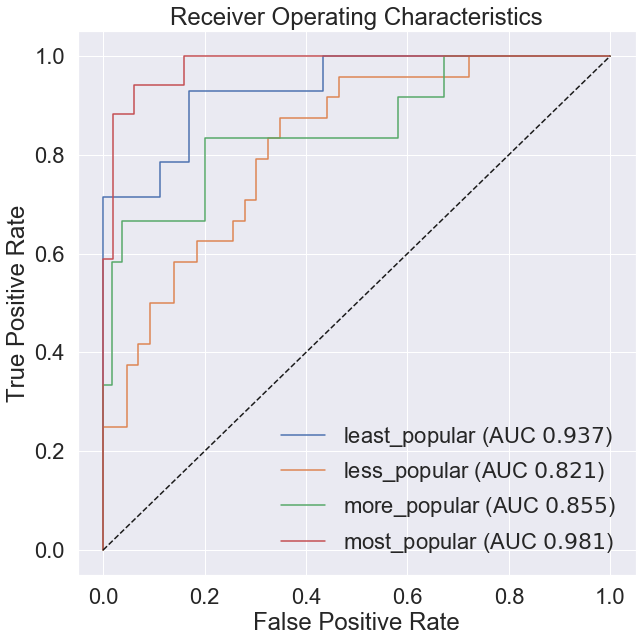

In [192]:
# ROC for Testing Data
lucem_illud_2020.plotMultiROC(logistic_l2, test_df)

'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches

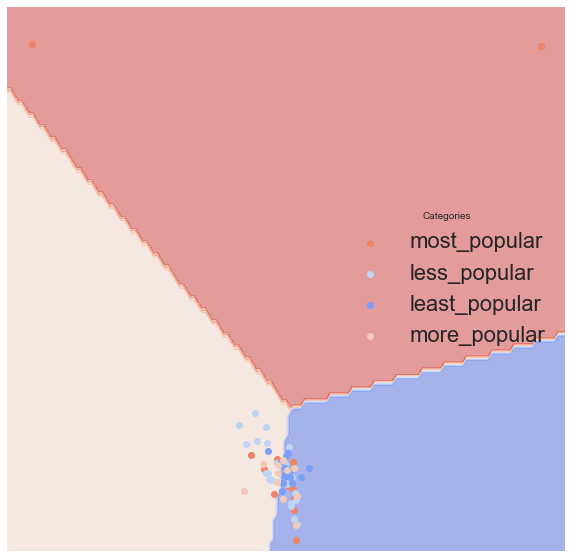

In [207]:
lucem_illud_2020.plotregions(logistic_l2, test_df)

### 4.2  Multinomial Naive Bayes

In [196]:
# train the model
MultinomialNB_med = sklearn.naive_bayes.MultinomialNB()
MultinomialNB_med.fit(np.stack(train_df['vect'], axis = 0), train_df['category'])

MultinomialNB(alpha=1.0, class_prior=None, fit_prior=True)

In [197]:
# save the prediction to the dataframe
train_df['nb_predict'] = MultinomialNB_med.predict(np.stack(train_df['vect'], axis=0))
print("Training score:")
print(MultinomialNB_med.score(np.stack(train_df['vect'], axis=0), train_df['category']))

Training score:
0.9111111111111111


In [198]:
train_df[['category', 'nb_predict']][:10]

,category,nb_predict
125,least_popular,least_popular
99,most_popular,most_popular
193,more_popular,more_popular
304,least_popular,more_popular
75,most_popular,most_popular
4,less_popular,less_popular
27,least_popular,least_popular
56,most_popular,most_popular
94,most_popular,most_popular
133,less_popular,less_popular


Looks pretty good so let's examine the testing dataset:

In [200]:
#Create vectors
TFVects_test = TFVectorizer.transform(test_df['text'])
test_df['vect'] = [np.array(v).flatten() for v in TFVects_test.todense()]

#Add to df
test_df['nb_predict'] = MultinomialNB_med.predict(np.stack(test_df['vect'], axis=0))

#Test
print("Testing score:")
print(MultinomialNB_med.score(np.stack(test_df['vect'], axis=0), test_df['category']))

Testing score:
0.5223880597014925


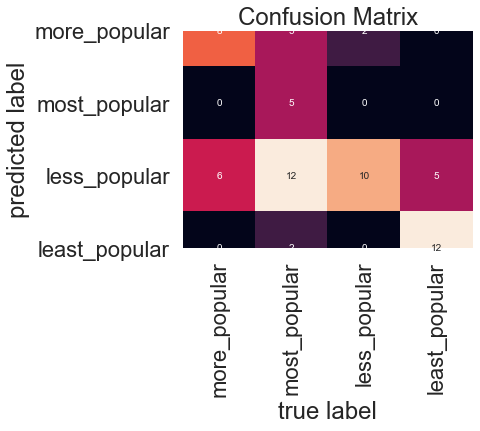

In [201]:
lucem_illud_2020.plotConfusionMatrix(MultinomialNB_med, test_df)

In [202]:
# More Evaluation
print('Accuracy Score: ', sklearn.metrics.accuracy_score(test_df['category'], test_df['nb_predict']))
print('Precision Score: ', sklearn.metrics.precision_score(test_df['category'], test_df['nb_predict'],average = 'weighted'))
print('Recall: ', sklearn.metrics.recall_score(test_df['category'], test_df['nb_predict'], average = 'weighted'))
print('F1 Score: ', sklearn.metrics.f1_score(test_df['category'], test_df['nb_predict'], average = 'weighted'))

Accuracy Score:  0.5223880597014925
Precision Score:  0.7414098339471474
Recall:  0.5223880597014925
F1 Score:  0.5148451291927459


The performance of this classifier is still unsatisfactory.

In [203]:
lucem_illud_2020.metrics.evaluateClassifier(MultinomialNB_med, test_df)

,Error_Rate,AUC,Precision,Average_Precision,Recall
Category,,,,,
most_popular,0.104478,0.832941,0.857143,0.679669,0.705882
less_popular,0.283582,0.604167,1.000000,0.491915,0.208333
least_popular,0.194030,0.719677,0.533333,0.394314,0.571429
more_popular,0.373134,0.707576,0.303030,0.282376,0.833333


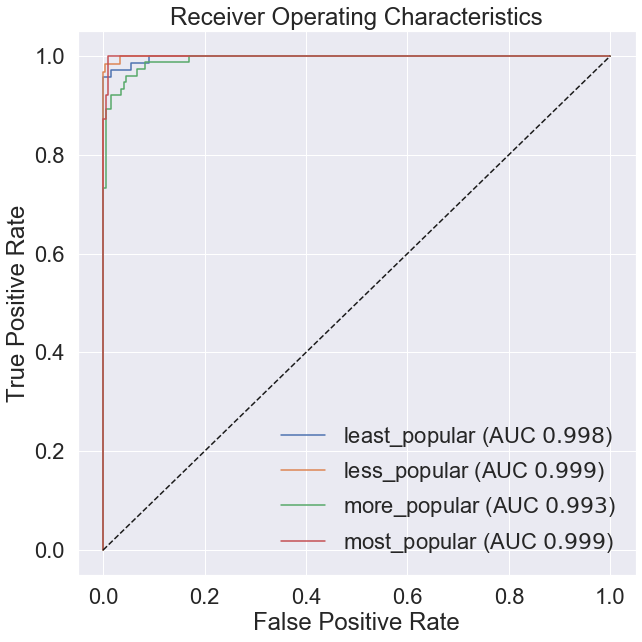

In [205]:
# ROC for training data
lucem_illud_2020.plotMultiROC(MultinomialNB_med, train_df)

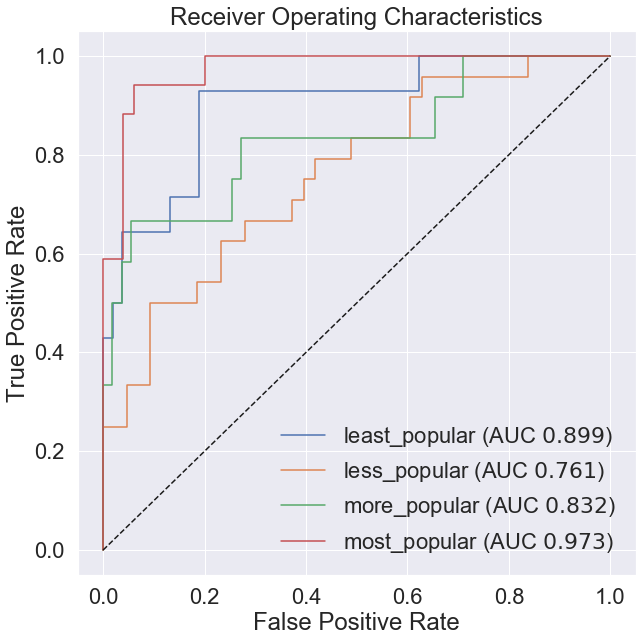

In [204]:
# ROC for testing data
lucem_illud_2020.plotMultiROC(MultinomialNB_med, test_df)

'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches

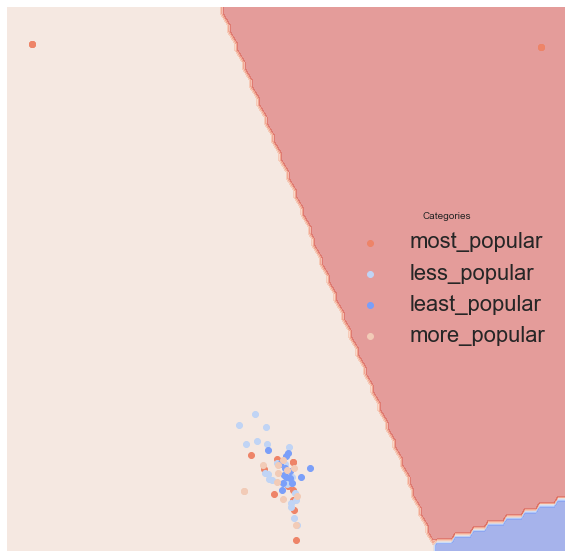

In [206]:
lucem_illud_2020.plotregions(MultinomialNB_med, test_df)

### 4.3 Decision Tree

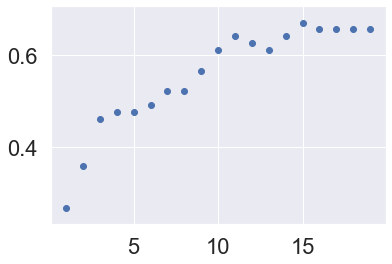

In [210]:
depthvec = []
scorevec = []
for i in range(1,20):
    tree2 = sklearn.tree.DecisionTreeClassifier(max_depth=i,random_state=0)
    tree2.fit(np.stack(train_df['vect'], axis =0), train_df['category'])
    score = sklearn.metrics.accuracy_score(test_df['category'], tree2.predict(np.stack(test_df['vect'], axis = 0)))
    depthvec.append(i)
    scorevec.append(score)
plt.scatter(depthvec,scorevec)
plt.show()

From the plot above, we can find the optimal layers of the decision tree. So we can choose 11 layers.

In [215]:
clf_tree = sklearn.tree.DecisionTreeClassifier(max_depth=11,random_state=0)
clf_tree.fit(np.stack(train_df['vect'], axis =0), train_df['category'])

DecisionTreeClassifier(ccp_alpha=0.0, class_weight=None, criterion='gini',
                       max_depth=11, max_features=None, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, presort='deprecated',
                       random_state=0, splitter='best')

'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches

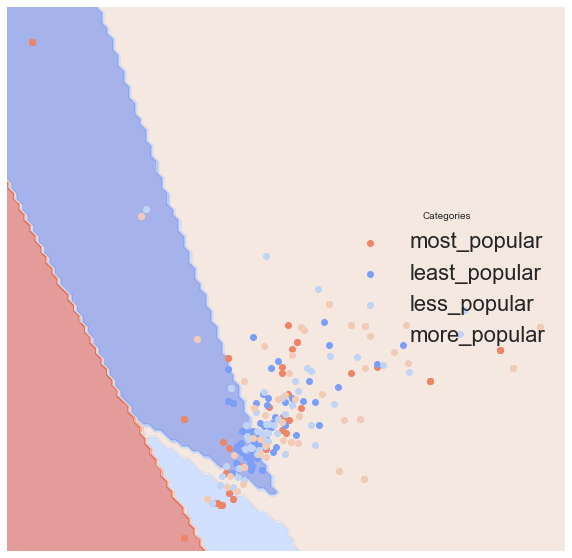

In [216]:
lucem_illud_2020.plotregions(clf_tree, train_df)

'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches

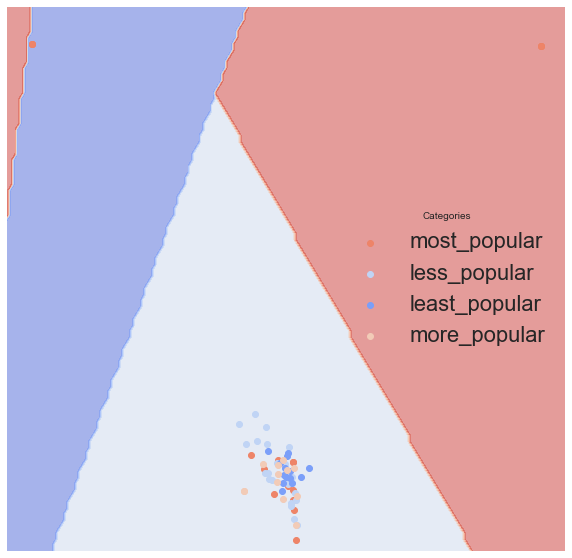

In [221]:
lucem_illud_2020.plotregions(clf_tree, test_df)

In [217]:
lucem_illud_2020.evaluateClassifier(clf_tree, test_df)

,Error_Rate,AUC,Precision,Average_Precision,Recall
Category,,,,,
most_popular,0.104478,0.910588,0.727273,0.699417,0.941176
less_popular,0.253731,0.645833,1.000000,0.545398,0.291667
least_popular,0.253731,0.760782,0.440000,0.390490,0.785714
more_popular,0.104478,0.838636,0.692308,0.564007,0.750000


In [218]:
# accuracy score
sklearn.metrics.accuracy_score(test_df['category'],clf_tree.predict(np.stack(test_df['vect'], axis = 0)))

0.6417910447761194

In [228]:
#Add to dataframe
test_df['decision_tree_predict'] = clf_tree.predict(np.stack(test_df['vect'], axis=0))

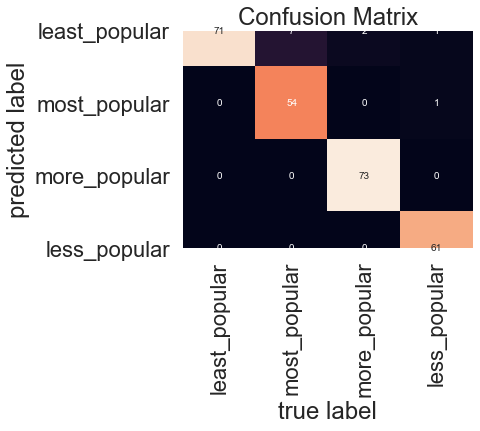

In [229]:
# Confusion Matrix for training dataset
lucem_illud_2020.plotConfusionMatrix(clf_tree, train_df)

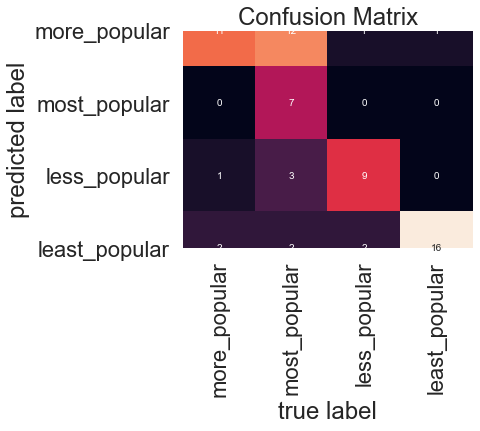

In [230]:
# Confusion Matrix for testing dataset
lucem_illud_2020.plotConfusionMatrix(clf_tree, test_df)

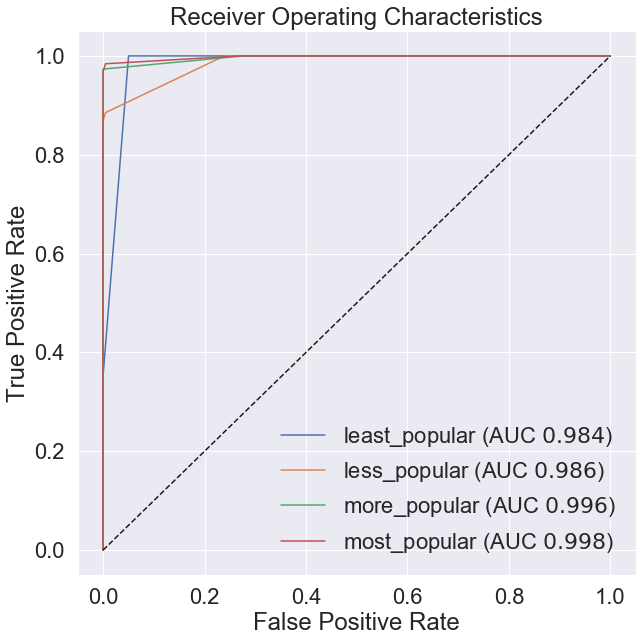

In [231]:
# ROC for training dataset
lucem_illud_2020.plotMultiROC(clf_tree, train_df)

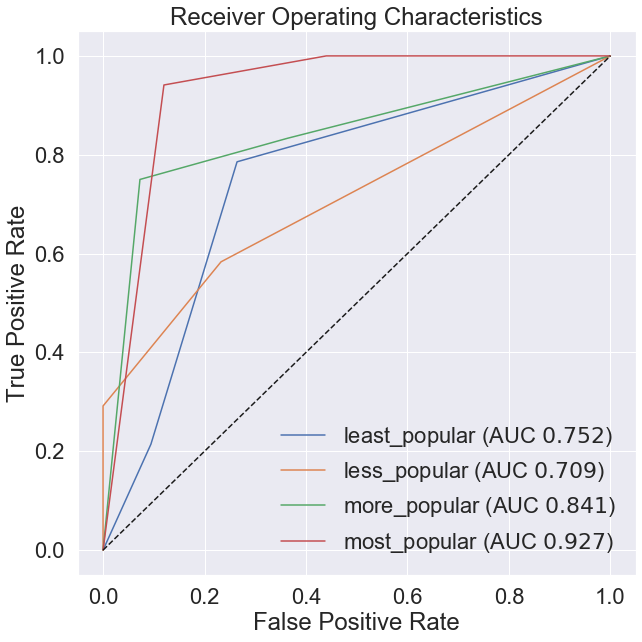

In [232]:
# ROC for testing dataset
lucem_illud_2020.plotMultiROC(clf_tree, test_df)

The decision tree is still non-ideal.

In [219]:
# bagging of decision trees
tree = sklearn.tree.DecisionTreeClassifier(max_depth=10) #Create an instance of our decision tree classifier.

bag = sklearn.ensemble.BaggingClassifier(tree, n_estimators=100, max_samples=0.8, random_state=1) #Each tree uses up to 80% of the data

In [220]:
# train the model
bag.fit(np.stack(train_df['vect'], axis =0), train_df['category']) #Fit the bagged classifier

BaggingClassifier(base_estimator=DecisionTreeClassifier(ccp_alpha=0.0,
                                                        class_weight=None,
                                                        criterion='gini',
                                                        max_depth=10,
                                                        max_features=None,
                                                        max_leaf_nodes=None,
                                                        min_impurity_decrease=0.0,
                                                        min_impurity_split=None,
                                                        min_samples_leaf=1,
                                                        min_samples_split=2,
                                                        min_weight_fraction_leaf=0.0,
                                                        presort='deprecated',
                                                        random_state=None,
  

In [240]:
#Add to dataframe
test_df['random_forest_predict'] = bag.predict(np.stack(test_df['vect'], axis=0))

'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches

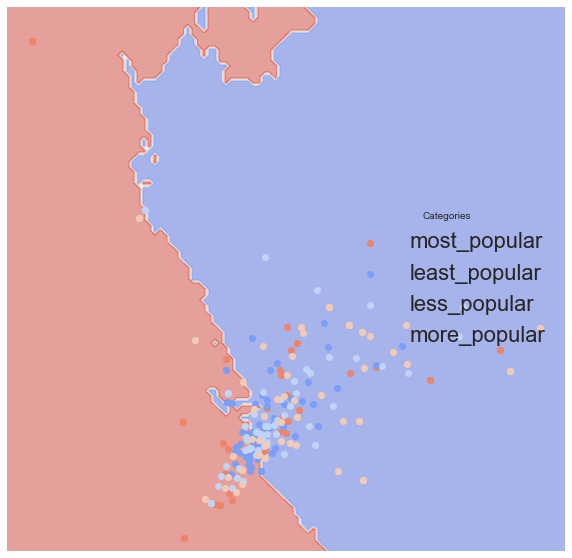

In [222]:
lucem_illud_2020.plotregions(bag, train_df)

'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches

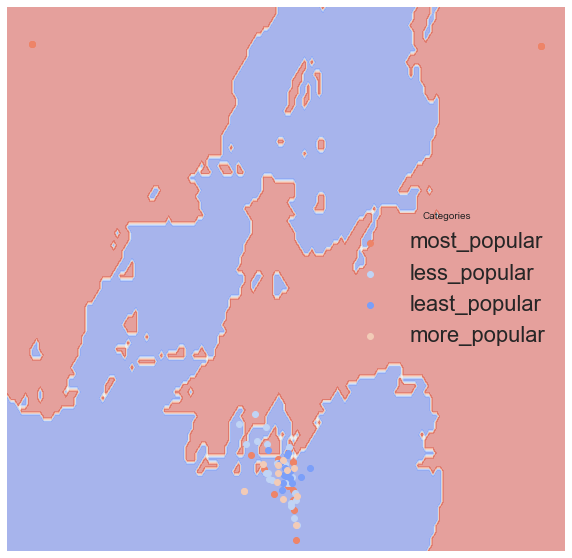

In [223]:
lucem_illud_2020.plotregions(bag, test_df)

In [241]:
print('Accuracy Score: ', sklearn.metrics.accuracy_score(test_df['category'], test_df['random_forest_predict']))
print('Precision Score: ', sklearn.metrics.precision_score(test_df['category'], test_df['random_forest_predict'], average = 'weighted'))
print('Recall: ', sklearn.metrics.recall_score(test_df['category'], test_df['random_forest_predict'], average = 'weighted'))
print('F1 Score: ', sklearn.metrics.f1_score(test_df['category'], test_df['random_forest_predict'], average = 'weighted'))

Accuracy Score:  0.6567164179104478
Precision Score:  0.7524115533443891
Recall:  0.6567164179104478
F1 Score:  0.6429861042165375


In [224]:
lucem_illud_2020.evaluateClassifier(bag, test_df)

,Error_Rate,AUC,Precision,Average_Precision,Recall
Category,,,,,
most_popular,0.044776,0.931176,0.937500,0.857057,0.882353
less_popular,0.253731,0.655039,0.888889,0.535102,0.333333
least_popular,0.223881,0.832210,0.481481,0.462015,0.928571
more_popular,0.164179,0.769697,0.533333,0.415257,0.666667


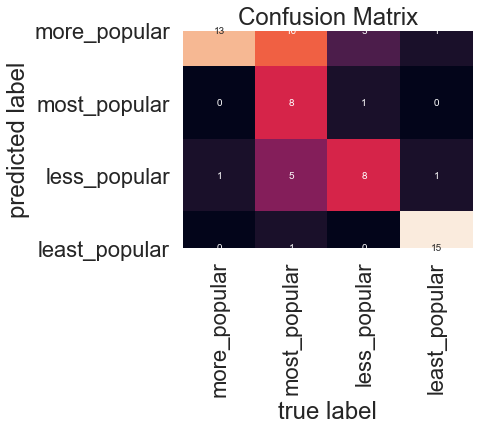

In [225]:
lucem_illud_2020.plotConfusionMatrix(bag, test_df)

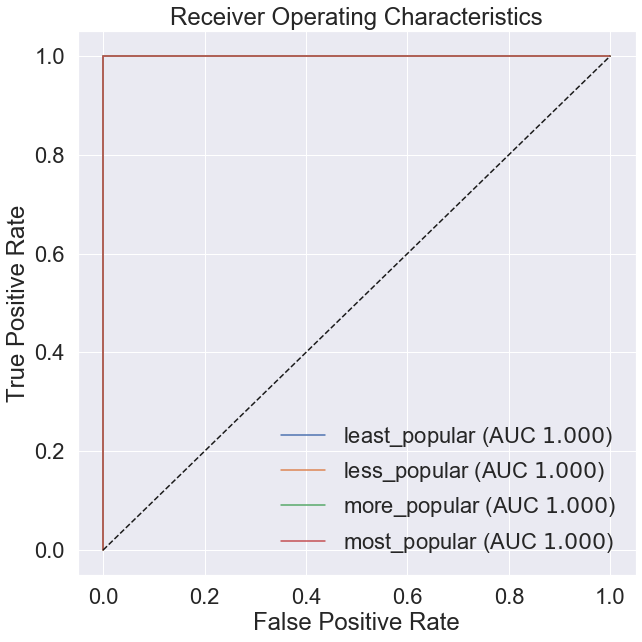

In [226]:
# ROC for training dataset
lucem_illud_2020.plotMultiROC(bag, train_df)

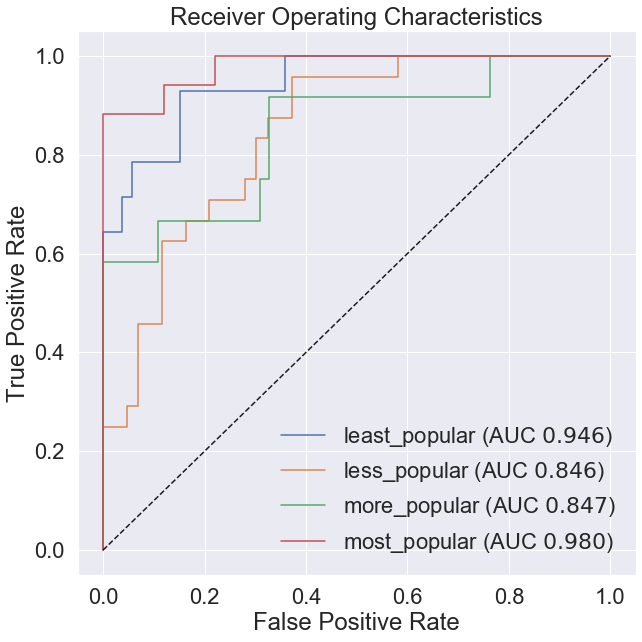

In [227]:
# ROC for testing dataset
lucem_illud_2020.plotMultiROC(bag, test_df)

Compared with single decision tree, bagging model has better performance.

### 4.4 Random Forest

In [233]:
# Train the model
clf_rf = sklearn.ensemble.RandomForestClassifier() # use default settings
clf_rf.fit(np.stack(train_df['vect'], axis =0), train_df['category'])

RandomForestClassifier(bootstrap=True, ccp_alpha=0.0, class_weight=None,
                       criterion='gini', max_depth=None, max_features='auto',
                       max_leaf_nodes=None, max_samples=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=100,
                       n_jobs=None, oob_score=False, random_state=None,
                       verbose=0, warm_start=False)

In [234]:
#Add to dataframe
test_df['rf_not_bagging'] = clf_rf.predict(np.stack(test_df['vect'], axis=0))

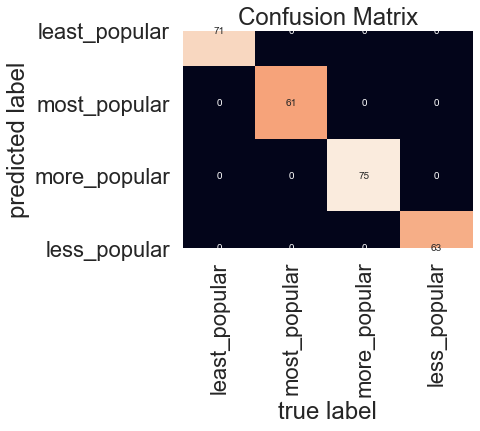

In [235]:
# Confusion Matrix for training dataset
lucem_illud_2020.plotConfusionMatrix(clf_rf, train_df)

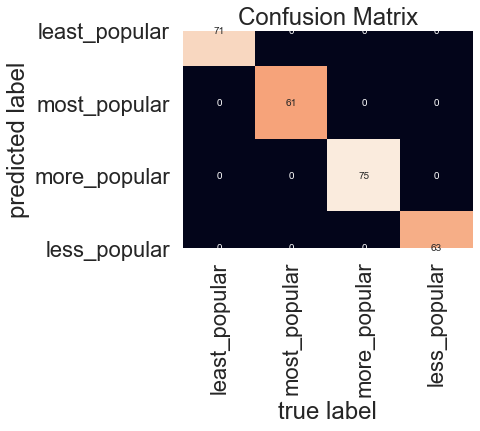

In [236]:
# Confusion Matrix for training dataset
lucem_illud_2020.plotConfusionMatrix(clf_rf, train_df)

In [237]:
print('Accuracy Score: ', sklearn.metrics.accuracy_score(test_df['category'], test_df['rf_not_bagging']))
print('Precision Score: ', sklearn.metrics.precision_score(test_df['category'], test_df['rf_not_bagging'], average = 'weighted'))
print('Recall: ', sklearn.metrics.recall_score(test_df['category'], test_df['rf_not_bagging'], average = 'weighted'))
print('F1 Score: ', sklearn.metrics.f1_score(test_df['category'], test_df['rf_not_bagging'], average = 'weighted'))

Accuracy Score:  0.582089552238806
Precision Score:  0.6053067993366501
Recall:  0.582089552238806
F1 Score:  0.551184890828138


In [239]:
lucem_illud_2020.evaluateClassifier(clf_rf, test_df)

,Error_Rate,AUC,Precision,Average_Precision,Recall
Category,,,,,
most_popular,0.059701,0.921176,0.882353,0.808397,0.882353
less_popular,0.343284,0.557655,0.555556,0.399323,0.208333
least_popular,0.253731,0.787062,0.444444,0.410803,0.857143
more_popular,0.179104,0.728030,0.500000,0.366294,0.583333


'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches

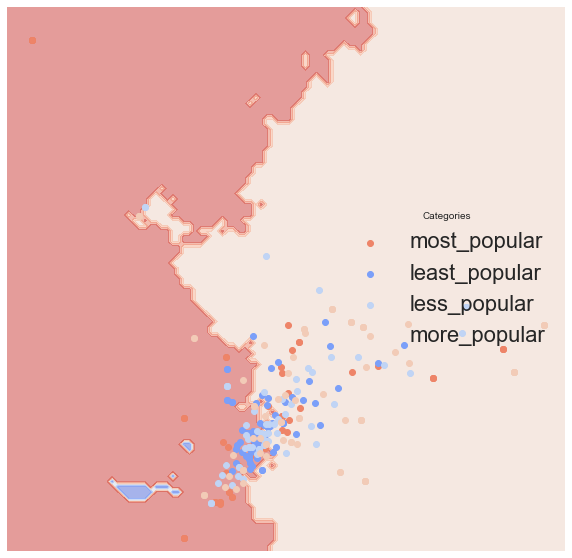

In [242]:
lucem_illud_2020.plotregions(clf_rf, train_df)

'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches

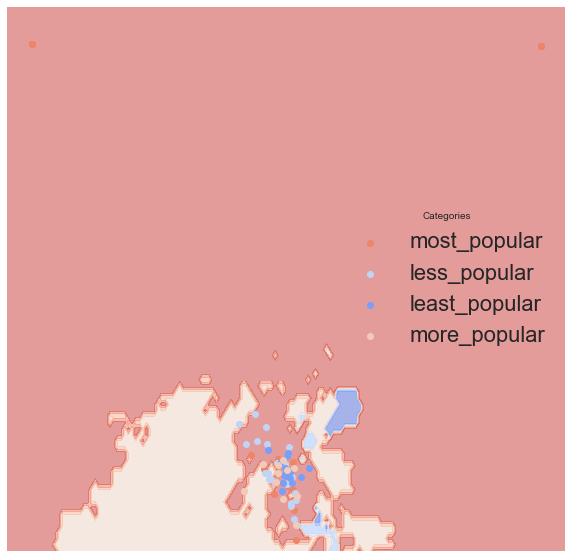

In [243]:
lucem_illud_2020.plotregions(clf_rf, test_df)

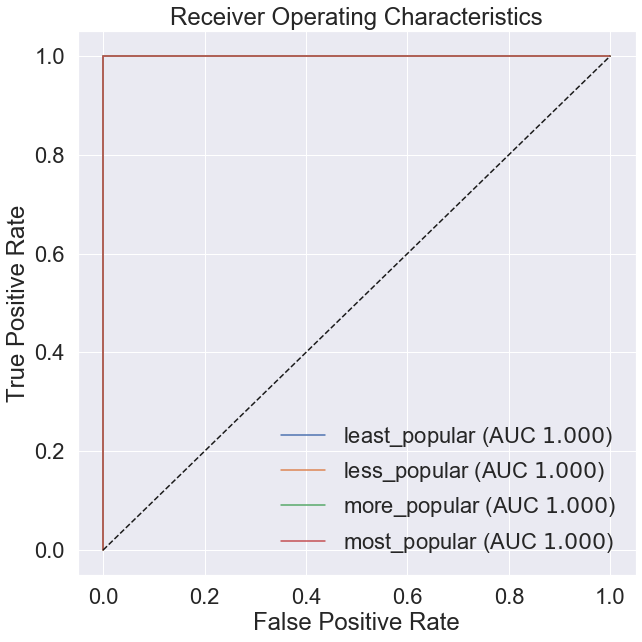

In [244]:
# ROC for traing dataset
lucem_illud_2020.plotMultiROC(clf_rf, train_df)

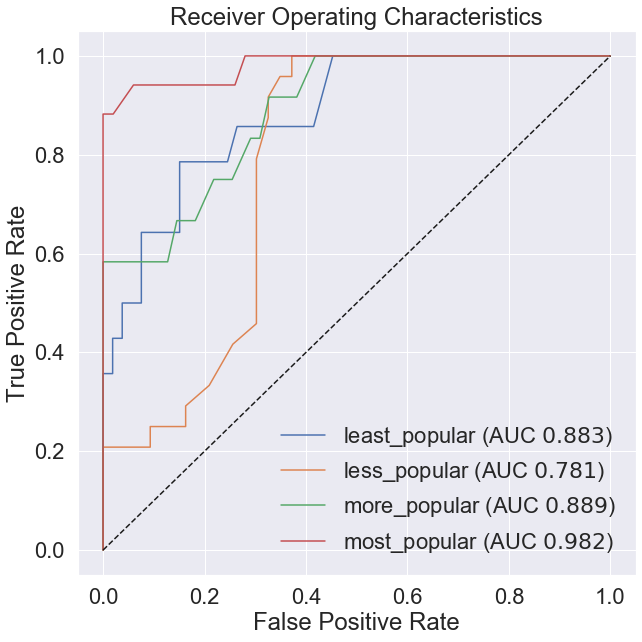

In [245]:
lucem_illud_2020.plotMultiROC(clf_rf, test_df)

The performance of random forest is slightly worse compared with bagging.

### 4.5 K-Nearest Neighbors

In [246]:
# with n=5
n_neighbors = 5
weights = "uniform"
clf_knn = sklearn.neighbors.KNeighborsClassifier(n_neighbors, weights=weights)
clf_knn.fit(np.stack(train_df['vect'], axis = 0), train_df['category'])

KNeighborsClassifier(algorithm='auto', leaf_size=30, metric='minkowski',
                     metric_params=None, n_jobs=None, n_neighbors=5, p=2,
                     weights='uniform')

In [247]:
#Add to dataframe
test_df['knn_predict'] = clf_knn.predict(np.stack(test_df['vect'], axis=0))

In [248]:
lucem_illud_2020.evaluateClassifier(clf_knn, test_df)

,Error_Rate,AUC,Precision,Average_Precision,Recall
Category,,,,,
most_popular,0.298507,0.664118,0.434783,0.360232,0.588235
less_popular,0.358209,0.555233,0.500000,0.393657,0.250000
least_popular,0.179104,0.676550,0.600000,0.376546,0.428571
more_popular,0.208955,0.807576,0.454545,0.408639,0.833333


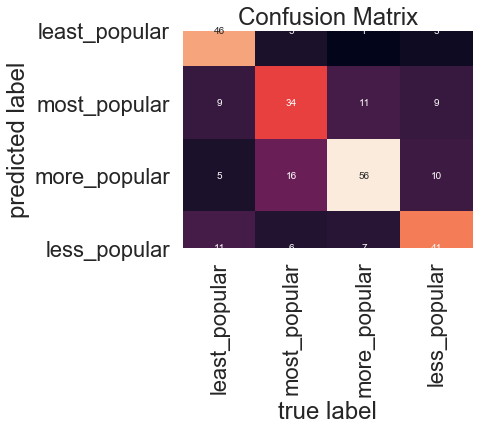

In [249]:
# Confusion Matrix with training dataset
lucem_illud_2020.plotConfusionMatrix(clf_knn, train_df)

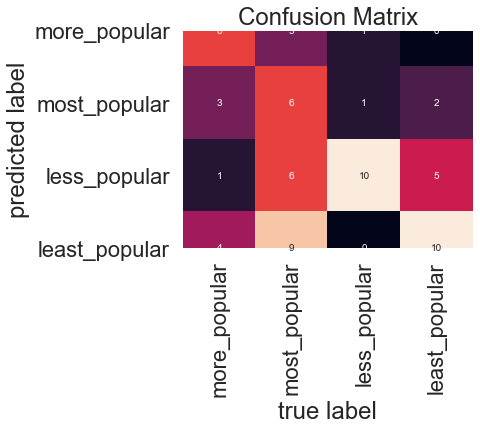

In [261]:
# Confusion Matrix with testing dataset
lucem_illud_2020.plotConfusionMatrix(clf_knn, test_df)

In [251]:
print('Accuracy Score: ', sklearn.metrics.accuracy_score(test_df['category'], test_df['knn_predict']))
print('Precision Score: ', sklearn.metrics.precision_score(test_df['category'], test_df['knn_predict'], average = 'weighted'))
print('Recall: ', sklearn.metrics.recall_score(test_df['category'], test_df['knn_predict'], average = 'weighted'))
print('F1 Score: ', sklearn.metrics.f1_score(test_df['category'], test_df['knn_predict'], average = 'weighted'))

Accuracy Score:  0.47761194029850745
Precision Score:  0.4962067134682319
Recall:  0.47761194029850745
F1 Score:  0.4561018437225636


'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches

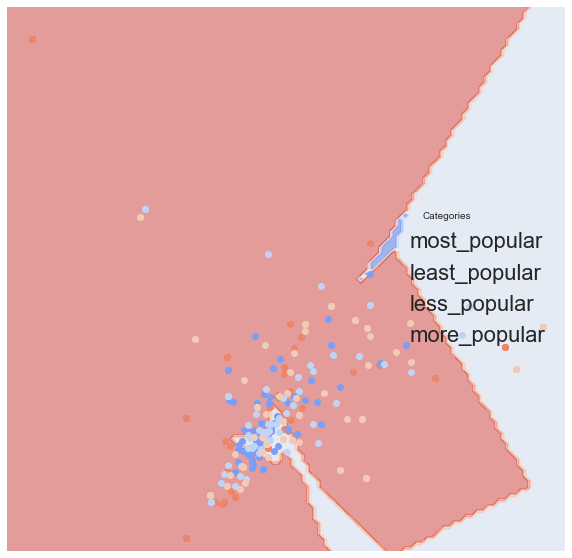

In [252]:
lucem_illud_2020.plotregions(clf_knn, train_df)

'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches

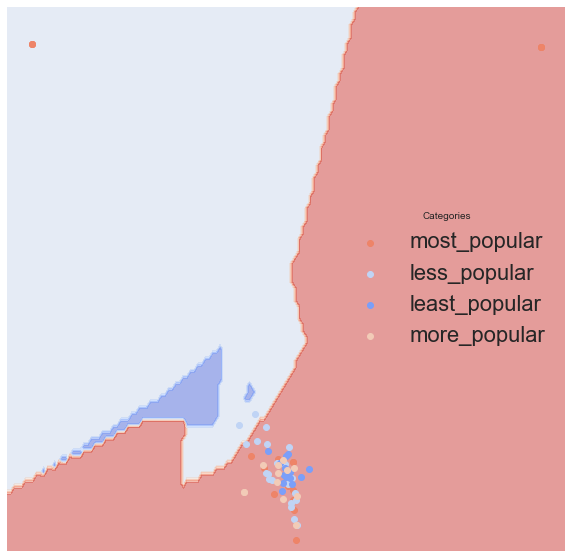

In [253]:
lucem_illud_2020.plotregions(clf_knn, test_df)

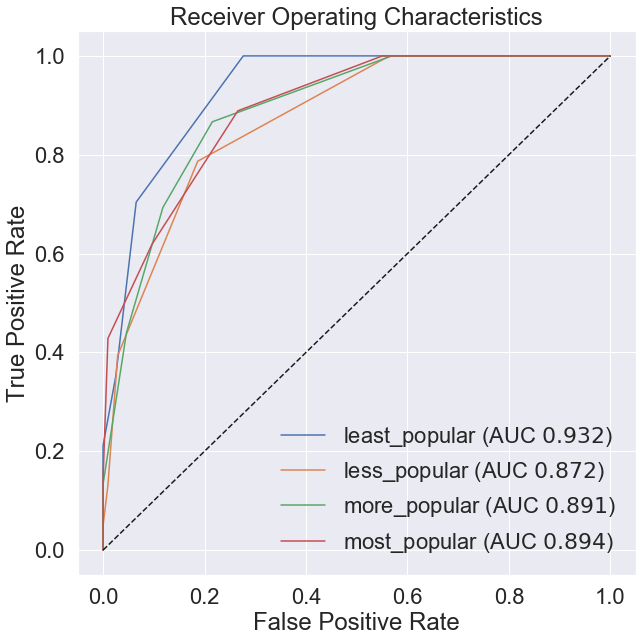

In [254]:
# ROC for training dataset
lucem_illud_2020.plotMultiROC(clf_knn, train_df)

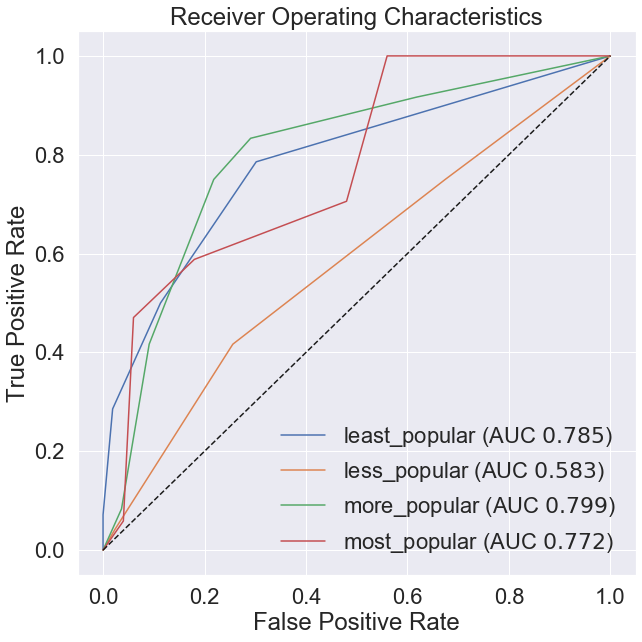

In [255]:
# ROC for testing dataset
lucem_illud_2020.plotMultiROC(clf_knn, test_df)

However, we find that KNN does not have a good performance on classification and it may be caused the initial value of k selection.

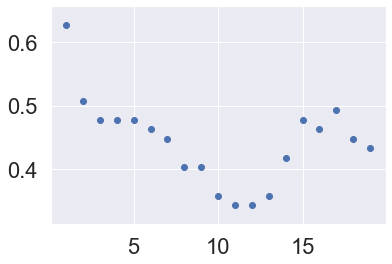

In [257]:
neigvec = []
scorevec = []
for i in range(1,20):
    knn = sklearn.neighbors.KNeighborsClassifier(n_neighbors=i)
    knn.fit(np.stack(train_df['vect'], axis =0), train_df['category'])
    score = sklearn.metrics.accuracy_score(test_df['category'], knn.predict(np.stack(test_df['vect'], axis = 0)))
    neigvec.append(i)
    scorevec.append(score)
plt.scatter(neigvec,scorevec)
plt.show()

It seems 5 is not an ideal selection of number of neighbors.

### 4.6 SVM

In [258]:
# linear kernel
clf_svm = sklearn.svm.SVC(kernel='linear', probability = False)
clf_svm.fit(np.stack(train_df['vect'], axis=0), train_df['category'])

SVC(C=1.0, break_ties=False, cache_size=200, class_weight=None, coef0=0.0,
    decision_function_shape='ovr', degree=3, gamma='scale', kernel='linear',
    max_iter=-1, probability=False, random_state=None, shrinking=True,
    tol=0.001, verbose=False)

In [259]:
#Add to dataframe
test_df['svm_predict'] = clf_svm.predict(np.stack(test_df['vect'], axis=0))

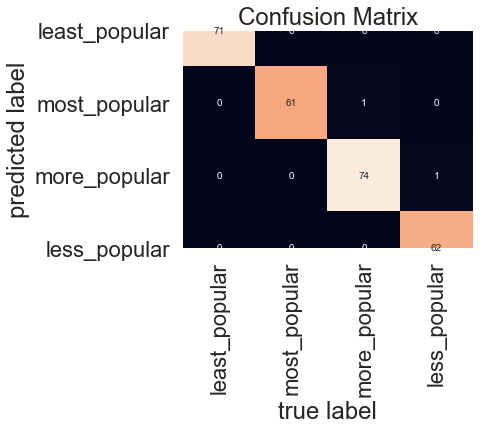

In [260]:
# Confusion Matrix for training dataset
lucem_illud_2020.plotConfusionMatrix(clf_svm, train_df)

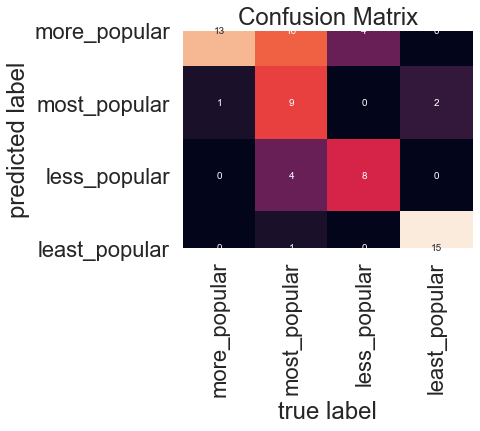

In [262]:
# Confusion Matrix with testing dataset
lucem_illud_2020.plotConfusionMatrix(clf_svm, test_df)

In [263]:
lucem_illud_2020.evaluateClassifier(clf_svm, test_df)

,Error_Rate,AUC,Precision,Average_Precision,Recall
Category,,,,,
most_popular,0.044776,0.931176,0.937500,0.857057,0.882353
less_popular,0.268657,0.652616,0.750000,0.505131,0.375000
least_popular,0.223881,0.832210,0.481481,0.462015,0.928571
more_popular,0.119403,0.796970,0.666667,0.504146,0.666667


In [264]:
print('Accuracy Score: ', sklearn.metrics.accuracy_score(test_df['category'], test_df['svm_predict']))
print('Precision Score: ', sklearn.metrics.precision_score(test_df['category'], test_df['svm_predict'], average = 'weighted'))
print('Recall: ', sklearn.metrics.recall_score(test_df['category'], test_df['svm_predict'], average = 'weighted'))
print('F1 Score: ', sklearn.metrics.f1_score(test_df['category'], test_df['svm_predict'], average = 'weighted'))

Accuracy Score:  0.6716417910447762
Precision Score:  0.72654090657822
Recall:  0.6716417910447762
F1 Score:  0.6616805109706456


'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches

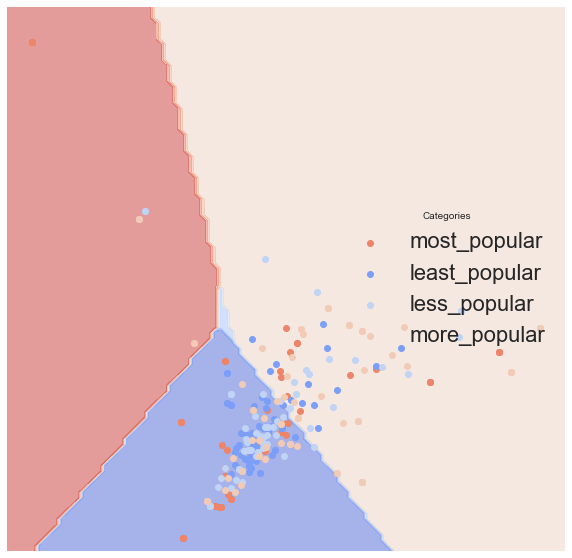

In [265]:
lucem_illud_2020.plotregions(clf_svm, train_df)

'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches

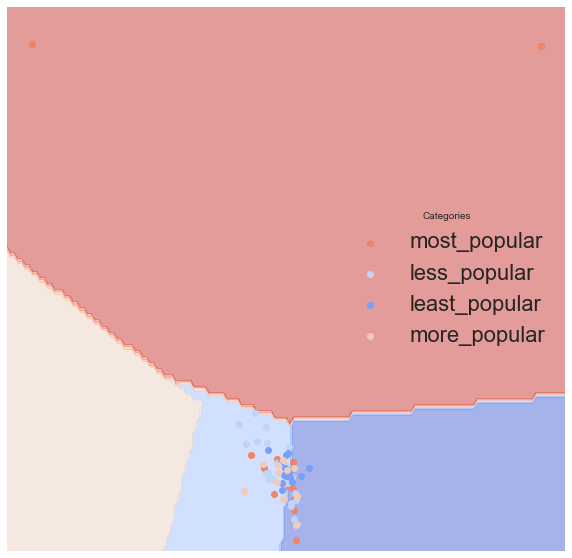

In [266]:
lucem_illud_2020.plotregions(clf_svm, test_df)

### 4.7 Simple Neural Nets

In [270]:
# Train the model
clf_nn = sklearn.neural_network.MLPClassifier()
clf_nn.fit(np.stack(train_df['vect'], axis=0), train_df['category'])

MLPClassifier(activation='relu', alpha=0.0001, batch_size='auto', beta_1=0.9,
              beta_2=0.999, early_stopping=False, epsilon=1e-08,
              hidden_layer_sizes=(100,), learning_rate='constant',
              learning_rate_init=0.001, max_fun=15000, max_iter=200,
              momentum=0.9, n_iter_no_change=10, nesterovs_momentum=True,
              power_t=0.5, random_state=None, shuffle=True, solver='adam',
              tol=0.0001, validation_fraction=0.1, verbose=False,
              warm_start=False)

In [271]:
#Add to dataframe
test_df['nn_predict'] = clf_nn.predict(np.stack(test_df['vect'], axis=0))

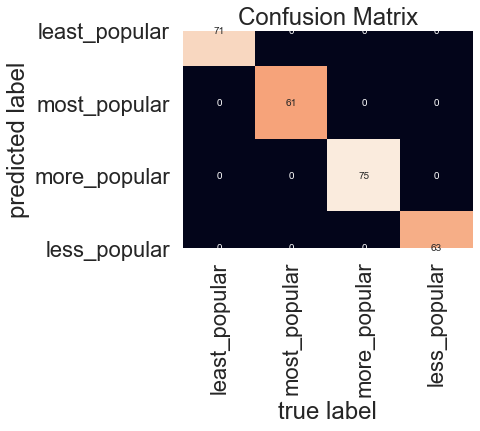

In [272]:
# Confusion Matrix with training dataset
lucem_illud_2020.plotConfusionMatrix(clf_nn, train_df)

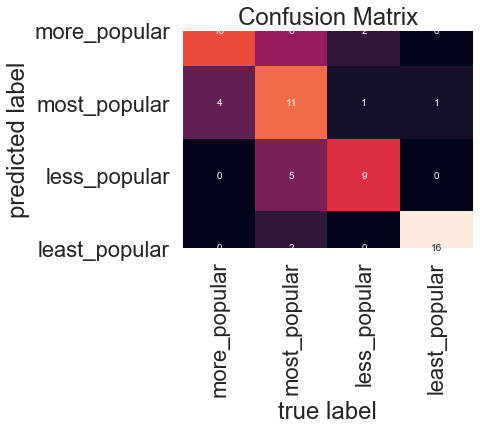

In [273]:
# Confusion Matrix with testing dataset
lucem_illud_2020.plotConfusionMatrix(clf_nn, test_df)

In [274]:
lucem_illud_2020.evaluateClassifier(clf_nn, test_df)

,Error_Rate,AUC,Precision,Average_Precision,Recall
Category,,,,,
most_popular,0.044776,0.950588,0.888889,0.851527,0.941176
less_popular,0.283582,0.659399,0.647059,0.490598,0.458333
least_popular,0.179104,0.781671,0.555556,0.456527,0.714286
more_popular,0.119403,0.829545,0.642857,0.526919,0.750000


In [275]:
print('Accuracy Score: ', sklearn.metrics.accuracy_score(test_df['category'], test_df['nn_predict']))
print('Precision Score: ', sklearn.metrics.precision_score(test_df['category'], test_df['nn_predict'], average = 'weighted'))
print('Recall: ', sklearn.metrics.recall_score(test_df['category'], test_df['nn_predict'], average = 'weighted'))
print('F1 Score: ', sklearn.metrics.f1_score(test_df['category'], test_df['nn_predict'], average = 'weighted'))

Accuracy Score:  0.6865671641791045
Precision Score:  0.6885460651922461
Recall:  0.6865671641791045
F1 Score:  0.6787850482244366


'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches

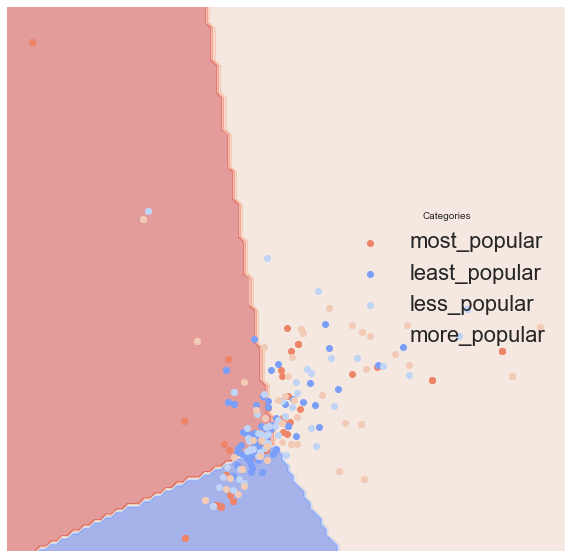

In [276]:
lucem_illud_2020.plotregions(clf_nn, train_df)

'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches

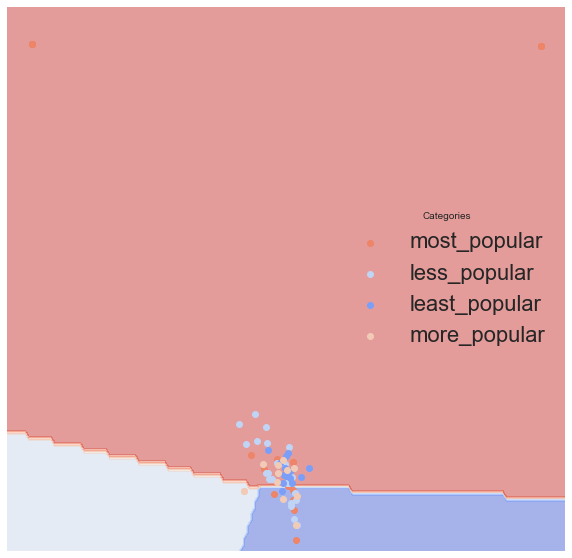

In [277]:
lucem_illud_2020.plotregions(clf_nn, test_df)

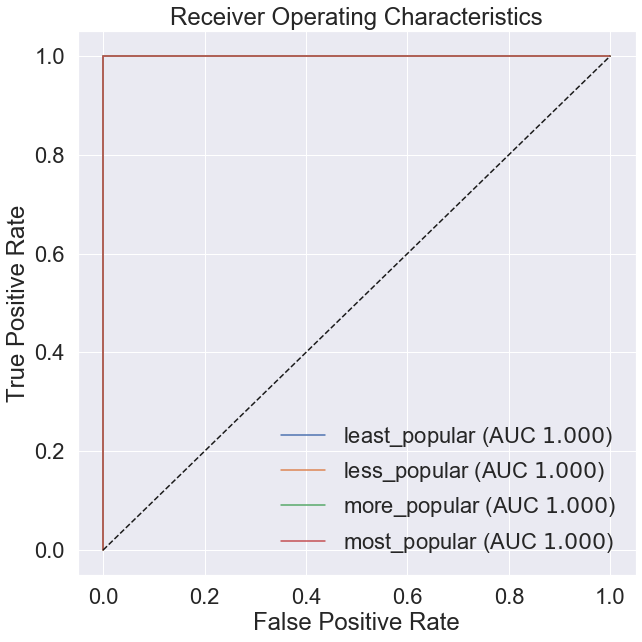

In [278]:
# ROC for traing dataset
lucem_illud_2020.plotMultiROC(clf_nn, train_df)

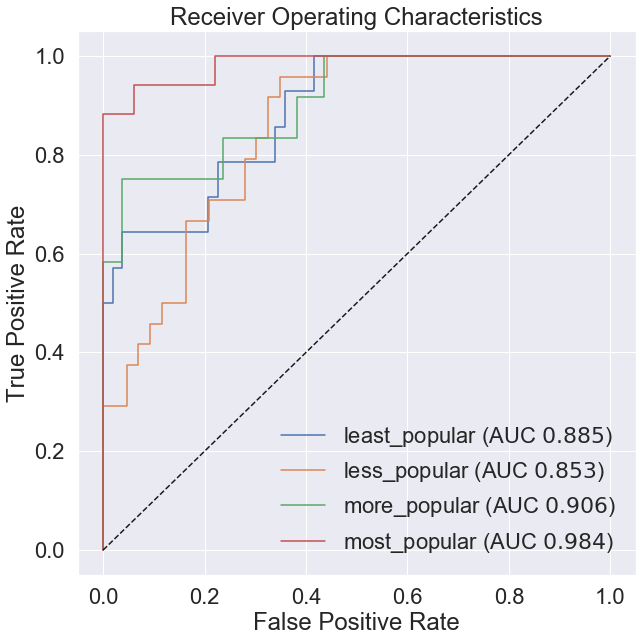

In [279]:
# ROC for testing dataset
lucem_illud_2020.plotMultiROC(clf_nn, test_df)

From the results above, we find that the simple neural network has the best performance.

## 5. Semantic & Influence Networks

### 5.1 document-to-document network

In [5]:
import networkx as nx
from IPython.display import Image #for pics
import pickle #if you want to save layouts

In [6]:
# reload the data 
medium_df = pandas.read_csv('medium.csv')
medium_df.head()

,author,claps,reading_time,link,title,text
0,Justin Lee,8.3K,11,https://medium.com/swlh/chatbots-were-the-next...,Chatbots were the next big thing: what happene...,"Oh, how the headlines blared:\nChatbots were T..."
1,Conor Dewey,1.4K,7,https://towardsdatascience.com/python-for-data...,Python for Data Science: 8 Concepts You May Ha...,If you’ve ever found yourself looking up the s...
2,William Koehrsen,2.8K,11,https://towardsdatascience.com/automated-featu...,Automated Feature Engineering in Python – Towa...,Machine learning is increasingly moving from h...
3,Gant Laborde,1.3K,7,https://medium.freecodecamp.org/machine-learni...,Machine Learning: how to go from Zero to Hero ...,If your understanding of A.I. and Machine Lear...
4,Emmanuel Ameisen,935,11,https://blog.insightdatascience.com/reinforcem...,Reinforcement Learning from scratch – Insight ...,Want to learn about applied Artificial Intelli...


In [281]:
# Tokenize and normalize
medium_df['tokenized_sents'] = medium_df['text'].apply(lambda x: [lucem_illud_2020.word_tokenize(s) for s in lucem_illud_2020.sent_tokenize(x)])
medium_df['normalized_sents'] = medium_df['tokenized_sents'].apply(lambda x: [lucem_illud_2020.normalizeTokens(s) for s in x])

In [282]:
# looking at the words that co-occur in the same sentences
def wordCooccurrence(sentences, makeMatrix = False):
    words = set()
    for sent in sentences:
        words |= set(sent)
    wordLst = list(words)
    wordIndices = {w: i for i, w in enumerate(wordLst)}
    wordCoCounts = {}
    #consider a sparse matrix if memory becomes an issue
    coOcMat = np.zeros((len(wordIndices), len(wordIndices)))
    for sent in sentences:
        for i, word1 in enumerate(sent):
            word1Index = wordIndices[word1]
            for word2 in sent[i + 1:]:
                coOcMat[word1Index][wordIndices[word2]] += 1
    if makeMatrix:
        return coOcMat, wordLst
    else:
        coOcMat = coOcMat.T + coOcMat
        g = nx.convert_matrix.from_numpy_matrix(coOcMat)
        g = nx.relabel_nodes(g, {i : w for i, w in enumerate(wordLst)})
        return g

In [285]:
# build a graph based on word coocurences in the medium articles
g = wordCooccurrence(medium_df['normalized_sents'].sum())

In [286]:
# total number of vertices and edges
print("total number of vertices:", len(g.nodes))
print("total number of edges:", len(g.edges))

total number of vertices: 15421
total number of edges: 580459


In [287]:
# a part of adjacency matrix
nx.to_numpy_matrix(g)[:10, :10]

matrix([[0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
        [0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
        [0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
        [0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
        [0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
        [0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
        [0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
        [0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
        [0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
        [0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]])

In [288]:
import sklearn.feature_extraction

# use the document-word frequency matrix
def tokenize(text):
    tokenlist = lucem_illud_2020.word_tokenize(text)
    normalized = lucem_illud_2020.normalizeTokens(tokenlist)
    return normalized

In [289]:
# fit the model
mediumVectorizer = sklearn.feature_extraction.text.CountVectorizer(tokenizer = tokenize)
mediumVects_incidence = mediumVectorizer.fit_transform(medium_df['text'])
mediumVects_incidence.shape

(337, 15419)

Then we need to turn the incidence matrix into a network.

In [290]:
g_2mode = nx.Graph()

#define all the nodes
# use bipartite as an attribute--the network graph is bipartite
g_2mode.add_nodes_from((mediumVectorizer.get_feature_names()[i] for i in range(mediumVects_incidence.shape[1])), bipartite = 'word')
g_2mode.add_nodes_from(range(mediumVects_incidence.shape[0]), bipartite = 'doc')

#add all the edges
g_2mode.add_edges_from(((d, mediumVectorizer.get_feature_names()[w], {'weight' : mediumVects_incidence[d, w]}) for d, w in zip(*mediumVects_incidence.nonzero())))

In [291]:
print(nx.info(g_2mode))

Name: 
Type: Graph
Number of nodes: 15756
Number of edges: 141491
Average degree:  17.9603


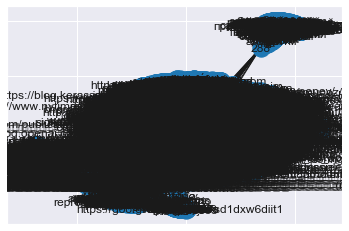

In [293]:
# plot the bipartite network with a quick spring layout
nx.draw_networkx(g_2mode)

We can see that without filtering, this picture will not bring much insight. So we transorm the two-mode network into one-mode network.

In [294]:
def contractNetwork(g, targetType):
    g_mono = nx.Graph()
    g_mono.add_nodes_from(((n, d) for n, d in g_2mode.nodes(data = True) if d['bipartite'] == targetType))
    
    for n_outside in (n for n, d in g_2mode.nodes(data = True) if d['bipartite'] != targetType):
        neighbors = list((n for n in g.neighbors(n_outside) if g.nodes[n]['bipartite'] == targetType))
        for i, n1 in enumerate(neighbors):
            for n2 in neighbors[i+1:]:
                try:
                    g_mono.edges[n1, n2]['weight'] += 1
                except KeyError:
                    g_mono.add_edge(n1, n2, weight = 1)
    return g_mono

In [295]:
gDoc = contractNetwork(g_2mode, 'doc')

In [296]:
# look at the document-to-document network
print(nx.info(gDoc))

Name: 
Type: Graph
Number of nodes: 337
Number of edges: 56616
Average degree: 336.0000


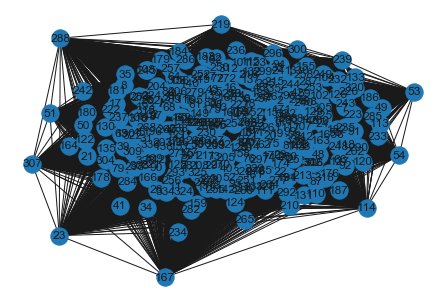

In [302]:
# construct a visualization
layout = nx.spring_layout(gDoc, k = 1/3, weight='weight', iterations= 50)
nx.draw(gDoc, pos = layout, labels = {n:n for n in gDoc.nodes()}) #Getting labels is a bit annoying

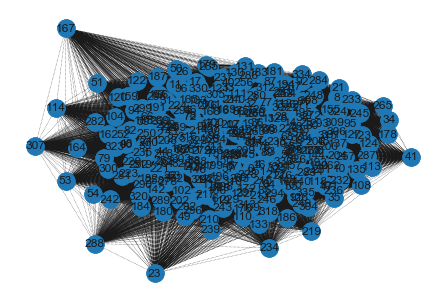

In [298]:
# draw the graph with high and low edges distinguished
wMedian = np.median([d['weight'] for n1, n2, d in gDoc.edges(data = True)])
edgesHigh = [(n1, n2) for n1, n2, d in gDoc.edges(data = True) if d['weight'] > wMedian]
edgesLow = [(n1, n2) for n1, n2, d in gDoc.edges(data = True) if d['weight'] <= wMedian]
nx.draw(gDoc, pos = layout, labels = {n:n for n in gDoc.nodes()}, edgelist = edgesLow, style='dotted', width=.5)
nx.draw(gDoc, pos = layout, nodelist=None, edgelist = edgesHigh, width=2)

Now we can see that 167 and 23 are obviously on the outside. Let's take a close look at them.

In [303]:
print(len(medium_df.iloc[23]['text']),"words:","\n",medium_df.iloc[23]['text'].strip().replace('  ', '\n'))

1413 words: 
 这一阵为了工作上的关系,花了点时间学习了一下LDA算法,说实话,对于我这个学CS而非学数学的人来说,除了集体智慧编程这本书之外基本没怎么看过机器学习的人来说,一开始还真是摸不太到门道,前前后后快要四个月了,算是基本了解了这个算法的实现,记录一下,也供后来人快速入门做个参考。
一开始直接就下了Blei的原始的那篇论文来看,但是看了个开头就被Dirichlet分布和几个数学公式打倒,然后因为专心在写项目中的具体的代码,也就先放下了。但是因为发现完全忘记了本科学的概率和统计的内容,只好回头去看大学时候概率论的教材,发现早不知道借给谁了,于是上网买了本,花了几天时间大致回顾了一遍概率论的知识,什么贝叶斯全概率公式,正态分布,二项分布之类的。后来晚上没事儿的时候,去水木的AI版转了转,了解到了Machine Learning的圣经PRML,考虑到反正也是要长期学习了,搞了电子版,同时上淘宝买了个打印胶装的版本。春节里每天晚上看一点儿,扫了一下前两章,再次回顾了一下基本数学知识,然后了解了下贝叶斯学派那种采用共轭先验来建模的方式。于是再次尝试回头去看Blei的那篇论文,发现还是看不太懂,于是又放下了。然后某天Tony让我准备准备给复旦的同学们share一下我们项目中LDA的使用,为了不露怯,又去翻论文,正好看到Science上这篇Topic Models Vs. Unstructured Data的科普性质的文章,翻了一遍之后,再去PRML里看了一遍Graphic Models那一张,觉得对于LDA想解决的问题和方法了解了更清楚了。之后从search engine里搜到这篇文章,然后根据推荐读了一部分的Gibbs Sampling for the Uninitiated。之后忘了怎么又搜到了Mark Steyvers和Tom Griffiths合著的Probabilistic Topic Models,在某个周末往返北京的飞机上读完了,觉得基本上模型训练过程也明白了。再之后就是读了一下这个最简版的LDA Gibbs Sampling的实现,再回过头读了一下PLDA的源码,基本上算是对LDA有了个相对清楚的了解。
这样前前后后,也过去了三个月,其实不少时间都是浪费掉的,比如Blei的论文在没有任何相关知识的情况下一开始读了好几次,都没读完而且得到到信息

In [307]:
print(len(medium_df.iloc[167]['text']),"words:","\n",medium_df.iloc[167]['text'].strip().replace('  ', '\n'))

1423 words: 
 O Grupo de Estudo em Deep Learning de Brasília está planejando o próximo ciclo de encontros do grupo, que deve iniciar-se a partir do meio de junho de 2018. Ainda há tempo para manifestar suas preferências para participar do grupo!
Para tal, favor preencher o seguinte questionário para que possamos agregar as preferências de nossa comunidade e selecionar as opções que melhor atenderem a todos: https://goo.gl/forms/H4K77sD1DxW6diIt1
Agradecemos se puder divulgar o grupo junto a sua rede de contatos com interesse nos temas de aprendizado automático e Deep Learning, para que possamos iniciar o próximo ciclo já com o máximo de interessados desde o primeiro dia!
Seguem abaixo alguns dos resultados iniciais do grupo:
Quanto aos resultados inciais do questionário, segue uma síntese das primeiras 50 respostas:
Dentre os tópicos de mais interesse destacam-se:
1o Deep Learning: 87,5%
2o Machine Learning: 78,6%
3o Aplicações de Deep Learning em projetos: 69,6%
4o Processamento de Li

We also can have a look at a article in the center, say 230 and 83.

In [308]:
print(len(medium_df.iloc[83]['text']),"words:","\n",medium_df.iloc[83]['text'].strip().replace('  ', '\n'))

18964 words: 
 We are in the midst of a gold rush in AI. But who will reap the economic benefits? The mass of startups who are all gold panning? The corporates who have massive gold mining operations? The technology giants who are supplying the picks and shovels? And which nations have the richest seams of gold?
We are currently experiencing another gold rush in AI. Billions are being invested in AI startups across every imaginable industry and business function. Google, Amazon, Microsoft and IBM are in a heavyweight fight investing over $20 billion in AI in 2016. Corporates are scrambling to ensure they realise the productivity benefits of AI ahead of their competitors while looking over their shoulders at the startups. China is putting its considerable weight behind AI and the European Union is talking about a $22 billion AI investment as it fears losing ground to China and the US.
AI is everywhere. From the 3.5 billion daily searches on Google to the new Apple iPhone X that uses fac

In [309]:
print(len(medium_df.iloc[230]['text']),"words:","\n",medium_df.iloc[230]['text'].strip().replace('  ', '\n'))

29729 words: 
 By Berit Anderson and Brett Horvath
This piece was originally published at Scout.ai.
“This is a propaganda machine. It’s targeting people individually to recruit them to an idea. It’s a level of social engineering that I’ve never seen before. They’re capturing people and then keeping them on an emotional leash and never letting them go,” said professor Jonathan Albright.
Albright, an assistant professor and data scientist at Elon University, started digging into fake news sites after Donald Trump was elected president. Through extensive research and interviews with Albright and other key experts in the field, including Samuel Woolley, Head of Research at Oxford University’s Computational Propaganda Project, and Martin Moore, Director of the Centre for the Study of Media, Communication and Power at Kings College, it became clear to Scout that this phenomenon was about much more than just a few fake news stories. It was a piece of a much bigger and darker puzzle — a Weapon

From the results above, it is not suprising that the outside ariticles have much less words compared the number of words of two central articles. Besides, we can also find that the articles in the center are written in English while the articles at the extreme outside, like the two articles above, written in Chinese and French.

### 5.2 Word-to-word network

In [313]:
# look at the word-to-word network by documents
gWord = contractNetwork(g_2mode, 'word')
print(nx.info(gWord))

Name: 
Type: Graph
Number of nodes: 15419
Number of edges: 11053027
Average degree: 1433.6892


In [314]:
# reduce the number of words to a manageable size
wMean = np.mean([d['weight'] for n1, n2, d in gWord.edges(data = True)])
wMean

3.3751784013555746

In [323]:
# filtering
g = wordCooccurrence(medium_df['normalized_sents'].sum())
print("before filtering:", len(g))

# drop all the edges with weight below 60
g.remove_edges_from([(n1, n2) for n1, n2, d in g.edges(data = True) if d['weight'] <= 60])
# drop isolates
g.remove_nodes_from(list(nx.isolates(g)))

before filtering: 15421


In [324]:
def connected_component_subgraphs(G):
    for c in nx.connected_components(G):
        yield G.subgraph(c)

In [325]:
# keep just the giant connected component
giant = max(connected_component_subgraphs(g), key=len) 
print(nx.info(giant))

Name: 
Type: Graph
Number of nodes: 187
Number of edges: 593
Average degree:   6.3422


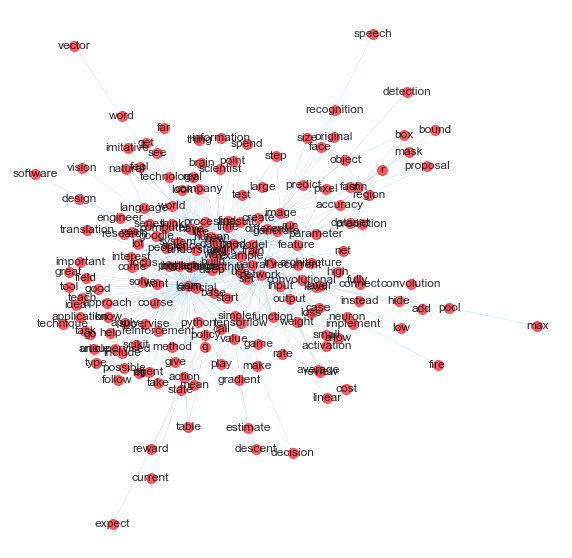

In [326]:
# visualize now
layout = nx.spring_layout(giant, weight='weight', iterations= 100)
fig, ax = plt.subplots(figsize = (10,10))
nx.draw(giant, ax = ax, pos = layout, labels = {n:n for n in giant.nodes()},
        width=.2, 
        alpha = .9, 
        node_size = 100,
        node_color = "xkcd:light red",
        edge_color='xkcd:sky blue') 

In [327]:
# find communities in graphs
from networkx.algorithms.community import greedy_modularity_communities
c = list(greedy_modularity_communities(giant))
c

[frozenset({'accuracy',
            'action',
            'activation',
            'add',
            'agent',
            'algorithm',
            'allow',
            'application',
            'apply',
            'approach',
            'architecture',
            'article',
            'artificial',
            'average',
            'base',
            'big',
            'bound',
            'box',
            'brain',
            'build',
            'call',
            'case',
            'cnn',
            'come',
            'company',
            'computer',
            'connect',
            'convolution',
            'convolutional',
            'cost',
            'course',
            'create',
            'current',
            'dataset',
            'datum',
            'decision',
            'deep',
            'descent',
            'design',
            'detection',
            'different',
            'engineer',
            'estimate',
            'example',
   

In [328]:
# remove the words that show up in many documents
giant = nx.Graph(giant)
giant.remove_nodes_from([n for n in giant.nodes if len(set(giant.neighbors(n))) >= 5000]) 
giant.remove_nodes_from(list(nx.isolates(giant)))
print(nx.info(giant))

Name: 
Type: Graph
Number of nodes: 187
Number of edges: 593
Average degree:   6.3422


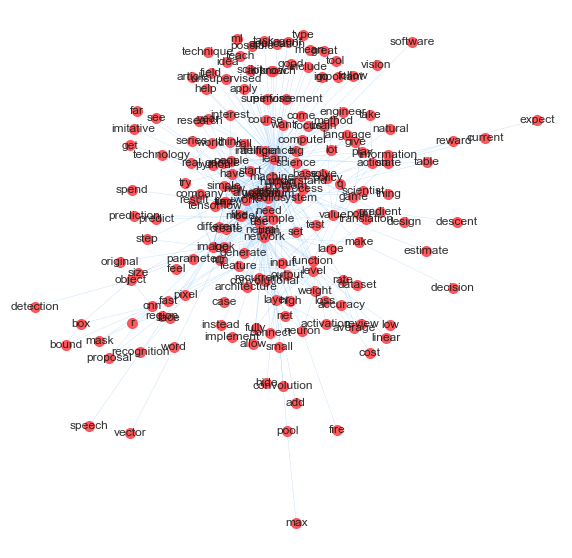

In [329]:
layout = nx.spring_layout(giant, weight='weight', iterations= 100)
fig, ax = plt.subplots(figsize = (10,10))
nx.draw(giant, ax = ax, pos = layout, labels = {n:n for n in giant.nodes()},
        width=.2, 
        alpha = .9, 
        node_size = 100,
        node_color = "xkcd:light red",
        edge_color='xkcd:sky blue') 

In [330]:
# find cliques
print(', '.join(max(nx.clique.find_cliques(giant), key = lambda x: len(x))))

learn, datum, network, train, use, neural, have, model, like, deep, machine


Take a look at a subgraph of the network, those nodes that are within 1 or 2 network steps of "network".

In [333]:
networkNeighbors = giant.neighbors('network')
g_network = giant.subgraph(networkNeighbors)
print(nx.info(g_network))

Name: 
Type: Graph
Number of nodes: 58
Number of edges: 314
Average degree:  10.8276


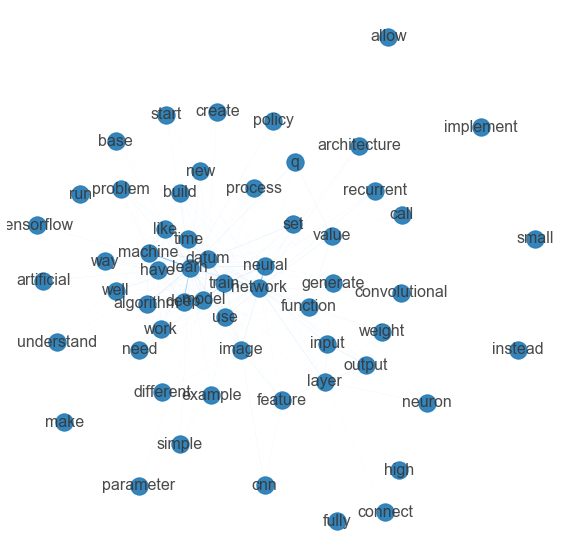

In [334]:
layout_network = nx.spring_layout(g_network, weight='weight', iterations= 100, k = .3)
fig, ax = plt.subplots(figsize = (10,10))
maxWeight = max((d['weight'] for n1, n2, d in g_network.edges(data = True)))
minWeight = min((d['weight'] for n1, n2, d in g_network.edges(data = True)))
nx.draw(g_network, ax = ax, pos = layout_network, labels = {n:n for n in g_network.nodes()},
        width=[(d['weight'] - minWeight + .7) / maxWeight for n1, n2, d in g_network.edges(data = True)], 
        alpha = .9, 
        font_size = 16,
        font_color = 'xkcd:dark grey',
        edge_color = 'xkcd:sky blue',
        cmap = plt.get_cmap('plasma'))

From the graph above, we can see that "neural", "image", "train" and "model" are expected neighbors of "network".

In [335]:
networkNeighbors = gWord.neighbors('network')
networkNeighborsPlus1 = set(networkNeighbors)
for n in networkNeighbors:
    networkNeighborsPlus1 |= set(giant.neighbors(n))

In [336]:
g_network2 = giant.subgraph(networkNeighborsPlus1)
print(nx.info(g_network2))

Name: 
Type: Graph
Number of nodes: 186
Number of edges: 535
Average degree:   5.7527


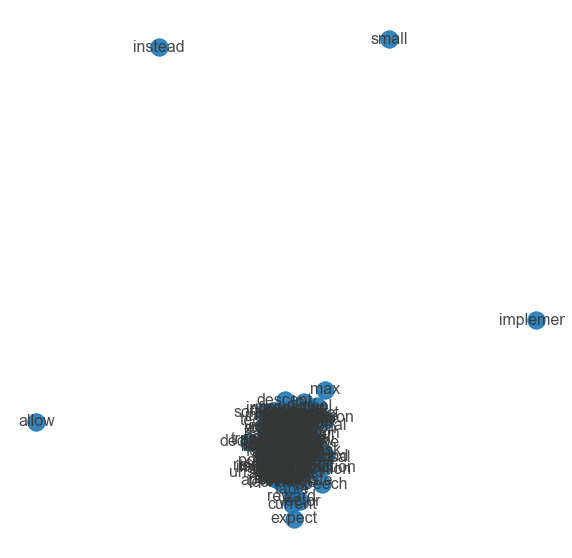

In [339]:
layout_network = nx.spring_layout(g_network2, weight='weight', iterations= 100, k = .3)
fig, ax = plt.subplots(figsize = (10,10))
centralities_network = nx.eigenvector_centrality(g_network2)
maxC = max(centralities_network.items(), key = lambda x : x[1])[1]
maxWeight = max((d['weight'] for n1, n2, d in g_network2.edges(data = True)))
minWeight = min((d['weight'] for n1, n2, d in g_network2.edges(data = True)))
nx.draw(g_network2, ax = ax, pos = layout_network, labels = {n:n for n in g_network2.nodes()},
        width=[(d['weight'] - minWeight + .7) / maxWeight for n1, n2, d in g_network2.edges(data = True)], 
        alpha = .9, 
        font_size = 16,
        font_color = 'xkcd:dark grey',
        edge_color = 'xkcd:sky blue',
        cmap = plt.get_cmap('plasma'))

### 5.3 Network statistics

#### 5.3.1 degree centrality

In [340]:
dcentralities = nx.degree_centrality(giant)
dcentralities['network']

0.31720430107526887

In [341]:
max(dcentralities.items(), key = lambda x : x[1])

('learn', 0.5483870967741936)

The word 'learn' are most central.

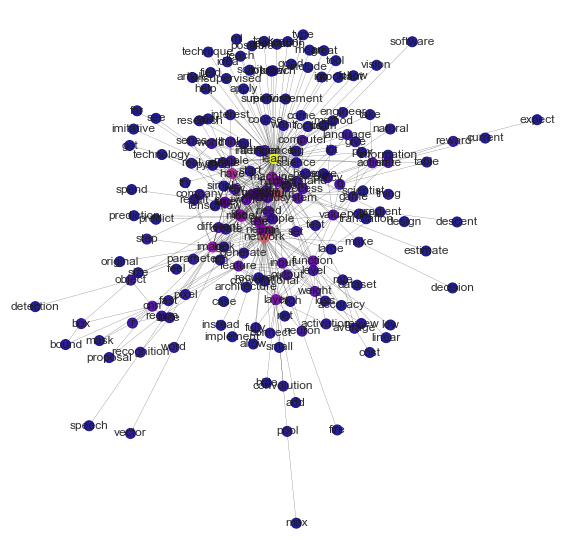

In [342]:
# color and size the nodes by betweenness centrality
fig, ax = plt.subplots(figsize = (10,10))
maxC = max(dcentralities.items(), key = lambda x : x[1])[1]
nx.draw(giant, ax = ax, pos = layout, labels = {n:n for n in giant.nodes()},
        width=.2, 
        alpha = .9, 
        node_size = 100,
        node_color = [dcentralities[n] / maxC for n in giant.nodes],
        cmap = plt.get_cmap('plasma'))

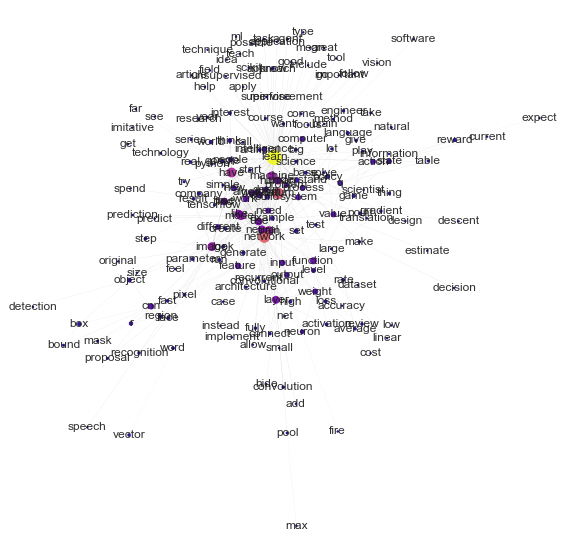

In [343]:
# another way to visualize (use size to represent degree centrality and age weight)
fig, ax = plt.subplots(figsize = (10,10))
maxC = max(dcentralities.items(), key = lambda x : x[1])[1]
maxWeight = max((d['weight'] for n1, n2, d in giant.edges(data = True)))
minWeight = min((d['weight'] for n1, n2, d in giant.edges(data = True)))
nx.draw(giant, ax = ax, pos = layout, labels = {n:n for n in giant.nodes()},
        width=[(d['weight'] - minWeight + .7) / maxWeight for n1, n2, d in gWord.edges(data = True)], 
        alpha = .9, 
        node_color = [dcentralities[n] / maxC for n in giant.nodes],
        node_size = [dcentralities[n] / maxC * 200 for n in giant.nodes],
        cmap = plt.get_cmap('plasma'))

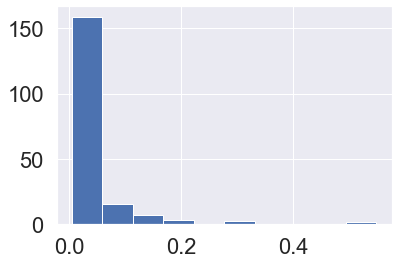

In [344]:
# distribution of degree centrality
plt.hist(list(dcentralities.values()))
plt.show()

In [345]:
# see the top and bottom ten words in terms of degree

# top
sorted(dcentralities.items(), key = lambda x: x[1], reverse = True)[:10]

[('learn', 0.5483870967741936),
 ('network', 0.31720430107526887),
 ('datum', 0.2956989247311828),
 ('have', 0.20967741935483872),
 ('train', 0.1774193548387097),
 ('machine', 0.17204301075268819),
 ('image', 0.16666666666666669),
 ('model', 0.16129032258064518),
 ('neural', 0.13978494623655915),
 ('like', 0.13978494623655915)]

In [347]:
# bottom
sorted(dcentralities.items(), key = lambda x: x[1], reverse = True)[-10:]

[('application', 0.005376344086021506),
 ('speech', 0.005376344086021506),
 ('task', 0.005376344086021506),
 ('case', 0.005376344086021506),
 ('current', 0.005376344086021506),
 ('linear', 0.005376344086021506),
 ('fire', 0.005376344086021506),
 ('original', 0.005376344086021506),
 ('good', 0.005376344086021506),
 ('small', 0.005376344086021506)]

#### 5.3.2 Betweenness centrality

In [348]:
b_centralities = nx.betweenness.betweenness_centrality(giant)
b_centralities['network']

0.17998237191195054

In [349]:
max(b_centralities.items(), key = lambda x : x[1])

('learn', 0.5278349924096829)

We can see that "learn" is the word with highest betweenness centrality.

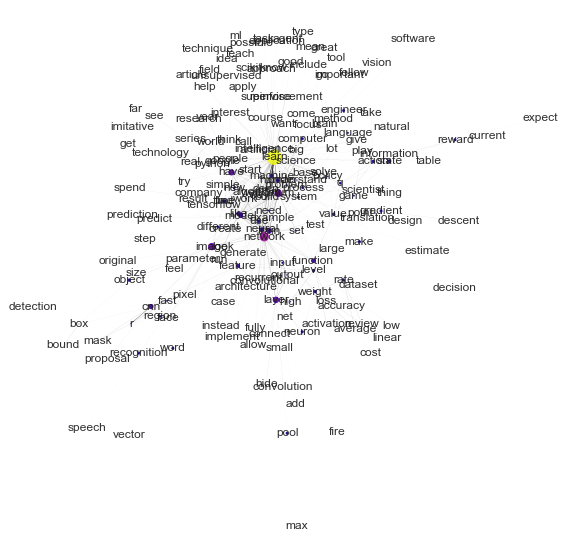

In [350]:
# color and size the nodes by betweenness centrality
fig, ax = plt.subplots(figsize = (10,10))
maxC = max(b_centralities.items(), key = lambda x : x[1])[1]
maxWeight = max((d['weight'] for n1, n2, d in giant.edges(data = True)))
minWeight = min((d['weight'] for n1, n2, d in giant.edges(data = True)))
nx.draw(giant, ax = ax, pos = layout, labels = {n:n for n in giant.nodes()},
        width=[(d['weight'] - minWeight + .7) / maxWeight for n1, n2, d in giant.edges(data = True)], 
        alpha = .9, 
        node_color = [b_centralities[n] / maxC for n in giant.nodes],
        node_size = [b_centralities[n] / maxC * 200 for n in giant.nodes],
        cmap = plt.get_cmap('plasma'))

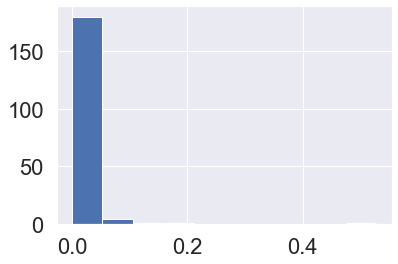

In [351]:
# the distribution of betweenness centrality
plt.hist(list(b_centralities.values()))
plt.show()

It is roughly an exponential distributoion.

In [352]:
# top ten words in terms of betweenness centrality
sorted(b_centralities.items(), key = lambda x: x[1], reverse = True)[:10]

[('learn', 0.5278349924096829),
 ('network', 0.17998237191195054),
 ('datum', 0.112592522741065),
 ('image', 0.10538709009677912),
 ('layer', 0.07863212728701721),
 ('have', 0.07097921235103043),
 ('train', 0.05756115235123315),
 ('cnn', 0.04570413748781871),
 ('like', 0.039974068614904316),
 ('model', 0.03741552686586461)]

We can see that "learn", "network", "datum", "image" and "layer" are key concepts that connect others in the broader network.

In [353]:
# bottom ten words in terms of betweenness centrality
sorted(b_centralities.items(), key = lambda x: x[1], reverse = True)[-10:]

[('convolutional', 0.0),
 ('original', 0.0),
 ('good', 0.0),
 ('convolution', 0.0),
 ('solve', 0.0),
 ('simple', 0.0),
 ('average', 0.0),
 ('test', 0.0),
 ('small', 0.0),
 ('result', 0.0)]

#### 5.3.3  Closeness centrality

In [354]:
c_centralities = nx.closeness_centrality(giant)

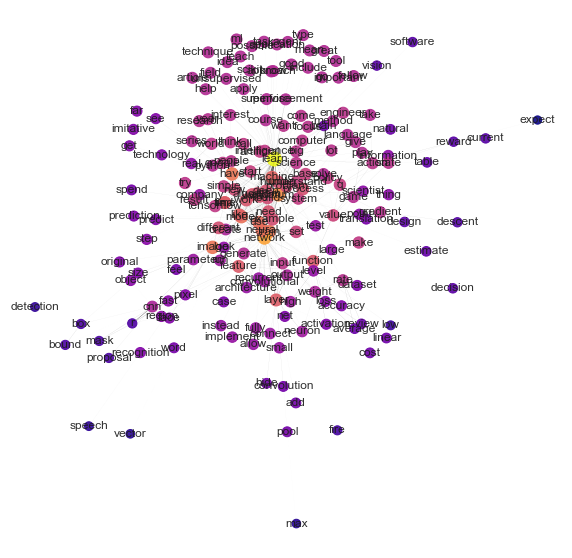

In [355]:
fig, ax = plt.subplots(figsize = (10,10))
maxC = max(c_centralities.items(), key = lambda x : x[1])[1]
maxWeight = max((d['weight'] for n1, n2, d in giant.edges(data = True)))
minWeight = min((d['weight'] for n1, n2, d in giant.edges(data = True)))
nx.draw(giant, ax = ax, pos = layout, labels = {n:n for n in giant.nodes()},
        width=[(d['weight'] - minWeight + .7) / maxWeight for n1, n2, d in giant.edges(data = True)], 
        alpha = .9, 
        node_color = [c_centralities[n] / maxC for n in giant.nodes],
        node_size = [c_centralities[n] / maxC * 200 for n in giant.nodes],
        cmap = plt.get_cmap('plasma'))

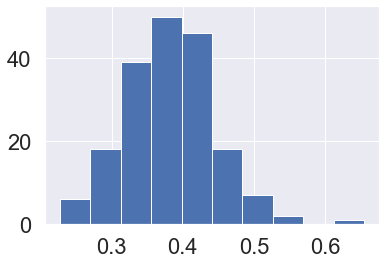

In [356]:
# the distribution of closeness centrality
plt.hist(list(c_centralities.values()))
plt.show()

In [357]:
# top ten words in terms of closeness centrality
sorted(c_centralities.items(), key = lambda x: x[1], reverse = True)[:10]

[('learn', 0.6549295774647887),
 ('network', 0.5653495440729484),
 ('datum', 0.5375722543352601),
 ('have', 0.5081967213114754),
 ('train', 0.5068119891008175),
 ('image', 0.5068119891008175),
 ('model', 0.5013477088948787),
 ('neural', 0.49732620320855614),
 ('use', 0.4946808510638298),
 ('machine', 0.484375)]

In [358]:
# bottom ten words in terms of closeness centrality
sorted(c_centralities.items(), key = lambda x: x[1], reverse = True)[-10:]

[('proposal', 0.27927927927927926),
 ('mask', 0.27927927927927926),
 ('bound', 0.27927927927927926),
 ('fire', 0.27232796486090777),
 ('low', 0.26458036984352773),
 ('detection', 0.25655172413793104),
 ('speech', 0.25340599455040874),
 ('vector', 0.24570673712021135),
 ('max', 0.24441524310118265),
 ('expect', 0.2271062271062271)]

#### 5.3.4 Eigenvector centrality

In [359]:
e_centralities = nx.eigenvector_centrality(giant)

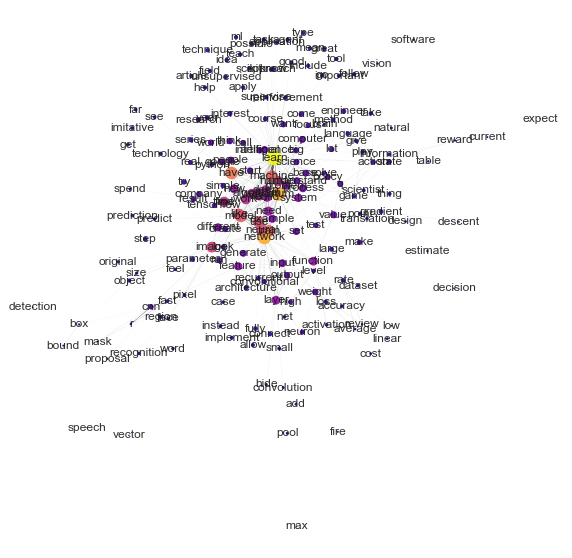

In [360]:
fig, ax = plt.subplots(figsize = (10,10))
maxC = max(e_centralities.items(), key = lambda x : x[1])[1]
maxWeight = max((d['weight'] for n1, n2, d in giant.edges(data = True)))
minWeight = min((d['weight'] for n1, n2, d in giant.edges(data = True)))
nx.draw(giant, ax = ax, pos = layout, labels = {n:n for n in giant.nodes()},
        width=[(d['weight'] - minWeight + .7) / maxWeight for n1, n2, d in giant.edges(data = True)], 
        alpha = .9, 
        node_color = [e_centralities[n] / maxC for n in giant.nodes],
        node_size = [e_centralities[n] / maxC * 200 for n in giant.nodes],
        cmap = plt.get_cmap('plasma'))

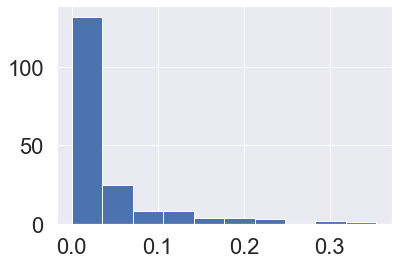

In [361]:
# the distribution of eigenvector centrality
plt.hist(list(e_centralities.values()))
plt.show()

In [362]:
# top ten words in terms of eigenvector centrality
sorted(e_centralities.items(), key = lambda x: x[1], reverse = True)[:10]

[('learn', 0.3539822712771989),
 ('datum', 0.2887511681787818),
 ('network', 0.287529167149633),
 ('have', 0.2356515129216286),
 ('train', 0.21711009869036169),
 ('machine', 0.2145572534538533),
 ('model', 0.2103068776063234),
 ('like', 0.19437224317342247),
 ('neural', 0.1939776732048172),
 ('use', 0.18782125172375297)]

In [363]:
# bottom ten words in terms of closeness centrality
sorted(e_centralities.items(), key = lambda x: x[1], reverse = True)[-10:]

[('decision', 0.0017018022934742407),
 ('fire', 0.0014762241111353385),
 ('current', 0.0014477261892205202),
 ('descent', 0.0012198959123651564),
 ('low', 0.001106371665004669),
 ('detection', 0.0008342370275678006),
 ('vector', 0.0005731775106037512),
 ('speech', 0.00048289583355929196),
 ('max', 0.00028363769741655267),
 ('expect', 0.00016658223799001962)]

In [364]:
# filter out the network by a type of centrality 
def filterWords(G, minWeight = 3, filter_ = "betweenness", rule = "number", value_of_rule = 200):
    G = G.copy()
    try:
        G.remove_edges_from([(n1,n2) for n1, n2, d in G.edges(data = True) if d['weight'] < minWeight])
    except:
        print("weight might be missing from one or more edges")
        raise
    if filter_ =="betweenness":
        index = nx.betweenness_centrality(G) #betweeness centrality score
    elif filter_ == "closeness":
        index = nx.closeness_centrality(G) #closeness centrality score
    elif filter_ == "eigenvector":
        index = nx.eigenvector_centrality(G) #eigenvector centrality score
    elif filter_ == "degree":
        index = nx.degree_centrality(G) #degree centrality score
    else:
        raise ValueError("wrong filter paremeter, should be: betweenness/closeness/eigenvector")    
        
    if rule=='number':# if filter by limiting the total number of nodes 
        
        sorted_index = sorted(index.items(), key=lambda x:x[1], reverse=True)
        value_of_rule = np.min([value_of_rule, len(G.nodes)])
        
        nodes_remain = {}
        for word, centr in sorted_index[:value_of_rule]:
            nodes_remain[word] = centr
        G.remove_nodes_from([n for n in index if n not in nodes_remain])
        print ("Total number of nodes(after filtering) in the graph is %s" % len(G))
        return G
    
    if rule=='above':# if filter by limiting the min value of centrality
        value_of_rule = np.max([float(value_of_rule),0])
        G.remove_nodes_from([n for n in index if index[n] >=value_of_rule])
        print ("Total number of nodes(after filtering) in the graph is %s" % len(G))
        return G
    
    if rule=='below':# if filter by limiting the max value of centrality
        value_of_rule = np.max([float(value_of_rule),0])
        G.remove_nodes_from([n for n in index if index[n] <=value_of_rule])
        print ("Total number of nodes(after filtering) in the graph is %s" % len(G))
        return G

In [365]:
giant_filtered80 = filterWords(giant, minWeight=3, filter_='betweenness', rule='number', value_of_rule=80)
print(nx.info(giant_filtered80))

Total number of nodes(after filtering) in the graph is 80
Name: 
Type: Graph
Number of nodes: 80
Number of edges: 412
Average degree:  10.3000


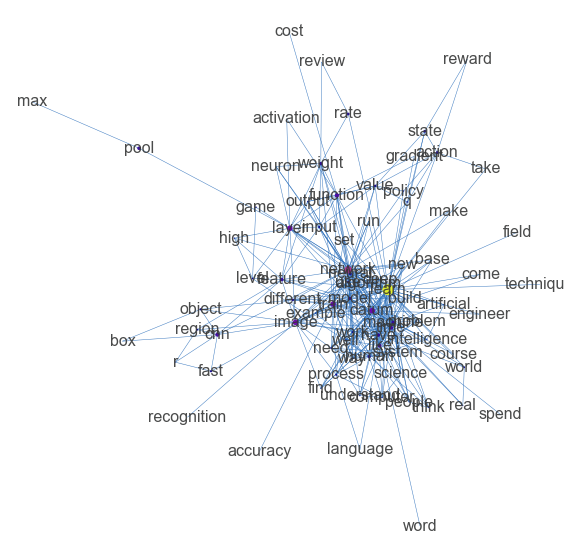

In [366]:
layout_giant_filtered80 = nx.spring_layout(giant_filtered80, weight='weight', iterations= 100)
fig, ax = plt.subplots(figsize = (10,10))
centralities_giant80 = nx.betweenness_centrality(giant_filtered80)
maxC = max(centralities_giant80.items(), key = lambda x : x[1])[1]
nx.draw(giant_filtered80, ax = ax, pos = layout_giant_filtered80, labels = {n: n for n in giant_filtered80.nodes()},
        alpha = .9, 
        width = .5,
        node_color = [centralities_giant80[n] / maxC for n in giant_filtered80.nodes],
        node_size = [centralities_giant80[n] / maxC * 100 for n in giant_filtered80.nodes],
        font_size = 16,
        font_color = 'xkcd:dark grey',
        edge_color = 'xkcd:medium blue',
        cmap = plt.get_cmap('plasma'),
       )

In [367]:
# look at global statistics

# density of network
nx.density(giant)

0.03409809671669254

In [368]:
# average degree per code
np.mean([v for w,v in nx.degree(giant)])

6.342245989304812

In [369]:
# the diameter to calculates the average distance between any two nodes in the network
nx.diameter(giant)

6

Generally speaking, different centraliaty measures give similar most central words and least central words, but slight different remains. The most central words tend to be the most general words for ML, AI and data science, such as 'model', 'machine', 'datum', 'network', and so on. The least central words tend to be some specific words, such as 'max', 'word' and so on.  

The global density of the corpus is approximately 0.03409809671669254. The average degree per node is approximately 6.342245989304812. And the average distance between two nodes is 6.

### 5.4  POS based network

In [10]:
medium_df['sentences'] = medium_df['text'].apply(lambda x: [lucem_illud_2020.word_tokenize(s) for s in lucem_illud_2020.sent_tokenize(x)])

In [11]:
medium_df.index = range(len(medium_df) - 1, -1,-1)

In [12]:
# normalize the tokens through stemming
medium_df['normalized_sents'] = medium_df['sentences'].apply(lambda x: [lucem_illud_2020.normalizeTokens(s) for s in x])

In [13]:
import spacy
nlp = spacy.load('en')

In [14]:
def posCooccurrence(sentences, *posType, makeMatrix = False):
    words = set()
    reducedSents = []
    #Only using the first kind of POS for each word
    wordsMap = {}
    for sent in sentences:
        s = [(w, t) for w, t in lucem_illud_2020.spacy_pos(sent) if t in posType]
        for w, t in s:
            if w not in wordsMap:
                wordsMap[w] = t
        reducedSent = [w for w, t in s]
        words |= set(reducedSent)
        reducedSents.append(reducedSent)
    wordLst = list(words)
    wordIndices = {w: i for i, w in enumerate(wordLst)}
    wordCoCounts = {}
    #consider a sparse matrix if memory becomes an issue
    coOcMat = np.zeros((len(wordIndices), len(wordIndices)))
    for sent in reducedSents:
        for i, word1 in enumerate(sent):
            word1Index = wordIndices[word1]
            for word2 in sent[i + 1:]:
                coOcMat[word1Index][wordIndices[word2]] += 1
    if makeMatrix:
        return coOcMat, wordLst
    else:
        coOcMat = coOcMat.T + coOcMat
        g = nx.convert_matrix.from_numpy_matrix(coOcMat)
        g = nx.relabel_nodes(g, {i : w for i, w in enumerate(wordLst)})
        for w in g.nodes:
            g.nodes[w]['bipartite'] = wordsMap[w]
        return g

#### 5.4.1 Noun-noun network

In [375]:
# pos cooccurrence with nouns 
gNN = posCooccurrence(medium_df['normalized_sents'].sum(), 'NN')

In [376]:
print(nx.info(gNN))

Name: 
Type: Graph
Number of nodes: 5813
Number of edges: 121331
Average degree:  41.7447


In [377]:
# remove the vertices with degree less than or equal to 500
gNN.remove_nodes_from([n for n in gNN.nodes if len(set(gNN.neighbors(n))) <= 550]) 
print(nx.info(gNN))

Name: 
Type: Graph
Number of nodes: 38
Number of edges: 731
Average degree:  38.4737


In [378]:
# remove low weight edges
gNN.remove_edges_from([(n1, n2) for n1, n2, d in gNN.edges(data = True) if d['weight'] <= 12])
print(nx.info(gNN))

Name: 
Type: Graph
Number of nodes: 38
Number of edges: 462
Average degree:  24.3158


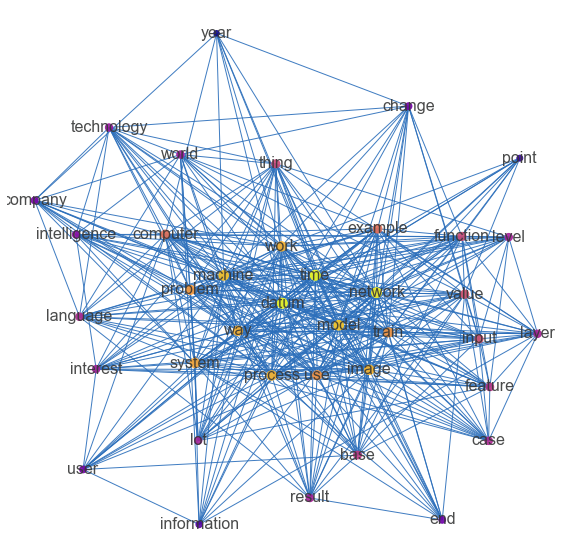

In [379]:
# visualization
layout_nn = nx.spring_layout(gNN, weight='weight', iterations= 100)
fig, ax = plt.subplots(figsize = (10,10))
centralities_nn = nx.eigenvector_centrality(gNN)
maxC = max(centralities_nn.items(), key = lambda x : x[1])[1]
maxWeight = max((d['weight'] for n1, n2, d in gNN.edges(data = True)))
minWeight = min((d['weight'] for n1, n2, d in gNN.edges(data = True)))
nx.draw(gNN, ax = ax, pos = layout_nn, labels = {n: n for n in gNN.nodes()},
        #width=[(d['weight'] - minWeight + .7) / maxWeight for n1, n2, d in gNN.edges(data = True)], 
        alpha = .9, 
        node_color = [centralities_nn[n] / maxC for n in gNN.nodes],
        node_size = [centralities_nn[n] / maxC * 100 for n in gNN.nodes],
        font_size = 16,
        font_color = 'xkcd:dark grey',
        edge_color = 'xkcd:medium blue',
        cmap = plt.get_cmap('plasma'),
       )

We can see that "network", "machine", "model" are more likely to co-occured in the corpus.

In [380]:
# ego-network for noun-noun network

# create "ego network" surrounding "datum" - the most central word
g_n = gNN.subgraph(['datum'] + list(gNN.neighbors('datum')))

In [381]:
print(nx.info(g_n))

Name: 
Type: Graph
Number of nodes: 38
Number of edges: 462
Average degree:  24.3158


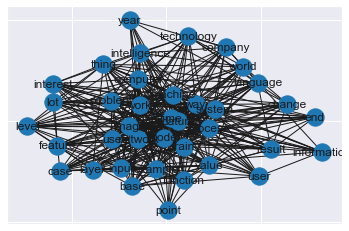

In [382]:
nx.draw_networkx(g_n)

In [384]:
# look at the neighbors of "model"
modelNeighbors = gNN.neighbors('model')
set(modelNeighbors)

{'base',
 'case',
 'change',
 'company',
 'computer',
 'datum',
 'end',
 'example',
 'feature',
 'function',
 'image',
 'input',
 'language',
 'layer',
 'level',
 'lot',
 'machine',
 'model',
 'network',
 'point',
 'problem',
 'process',
 'result',
 'system',
 'thing',
 'time',
 'train',
 'use',
 'user',
 'value',
 'way',
 'work',
 'world',
 'year'}

In [385]:
modelNeighbors = set(gNN.neighbors('model'))
modelNeighborsPlus1 = set(modelNeighbors)
for n in modelNeighbors:
    modelNeighborsPlus1 |= set(gNN.neighbors(n))

In [386]:
gNN_model = gNN.subgraph(modelNeighborsPlus1)
print(nx.info(gNN_model))

Name: 
Type: Graph
Number of nodes: 38
Number of edges: 462
Average degree:  24.3158


In [387]:
# degree centrality
sorted(nx.degree_centrality(gNN_model).items(), key = lambda x: x[1], reverse = True)[:10]

[('time', 1.0540540540540542),
 ('datum', 1.0540540540540542),
 ('network', 1.0270270270270272),
 ('model', 0.945945945945946),
 ('machine', 0.945945945945946),
 ('work', 0.918918918918919),
 ('way', 0.8918918918918919),
 ('image', 0.8918918918918919),
 ('process', 0.8918918918918919),
 ('system', 0.8648648648648649)]

In [388]:
# eigenvector centrality
sorted(nx.eigenvector_centrality(gNN_model).items(), key = lambda x: x[1], reverse = True)[:10]

[('time', 0.23221003267170157),
 ('datum', 0.23221003267170157),
 ('network', 0.22795109176622422),
 ('model', 0.21407490531770354),
 ('machine', 0.2124853720382548),
 ('image', 0.20688648315559258),
 ('process', 0.20652985392447762),
 ('way', 0.20524744612255616),
 ('work', 0.20524202257924223),
 ('system', 0.200410301966998)]

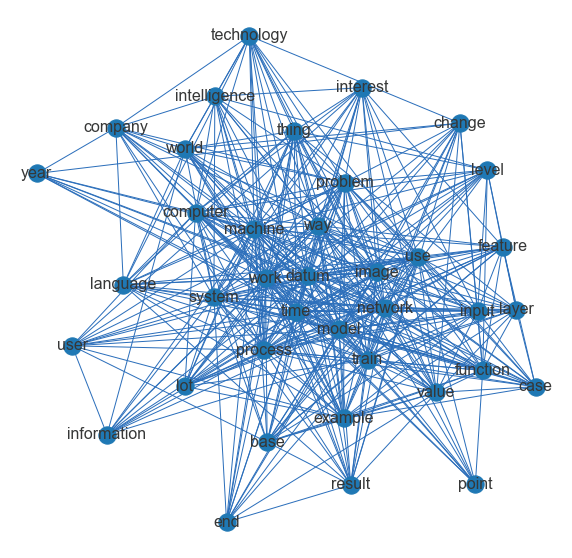

In [389]:
layout_model = nx.spring_layout(gNN_model, weight='weight', iterations= 100)
fig, ax = plt.subplots(figsize = (10,10))
nx.draw(gNN_model, ax = ax, pos = layout_model, labels = {n: n for n in gNN_model.nodes()},
        font_size = 16,
        font_color = 'xkcd:dark grey',
        edge_color = 'xkcd:medium blue',
       )

#### 5.4.2 Noun-verb network

In [390]:
gNV = posCooccurrence(medium_df['normalized_sents'].sum(), 'NN', 'VB')

In [391]:
print(nx.info(gNV))

Name: 
Type: Graph
Number of nodes: 6041
Number of edges: 158995
Average degree:  52.6386


In [392]:
# remove co-occurrence between nouns and nouns as well as verbs and verbs
gNV.remove_edges_from([(n1,n2) for n1,n2,d in gNV.edges(data = True) if gNV.nodes[n1]['bipartite'] == gNV.nodes[n2]['bipartite']])

In [393]:
print(nx.info(gNV))

Name: 
Type: Graph
Number of nodes: 6041
Number of edges: 39305
Average degree:  13.0127


In [394]:
# drop low weight edges and low degree vertices
gNV.remove_edges_from([(n1, n2) for n1, n2, d in gNV.edges(data = True) if d['weight'] <= 10])
gNV.remove_nodes_from([n for n in gNV.nodes if len(set(gNV.neighbors(n))) <= 25])

In [395]:
print(nx.info(gNV))

Name: 
Type: Graph
Number of nodes: 17
Number of edges: 67
Average degree:   7.8824


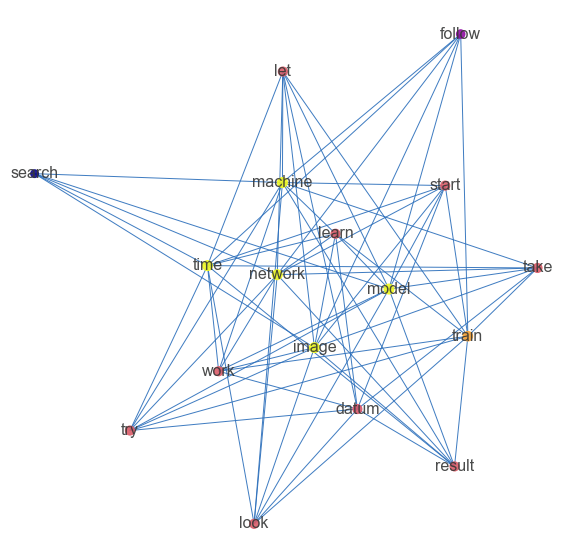

In [396]:
layout_nv = nx.spring_layout(gNV, weight='weight', iterations= 100)
fig, ax = plt.subplots(figsize = (10,10))
centralities_nv = nx.eigenvector_centrality(gNV)
maxC = max(centralities_nv.items(), key = lambda x : x[1])[1]
maxWeight = max((d['weight'] for n1, n2, d in gNV.edges(data = True)))
minWeight = min((d['weight'] for n1, n2, d in gNV.edges(data = True)))
nx.draw(gNV, ax = ax, pos = layout_nv, labels = {n: n for n in gNV.nodes()},
        #width=[(d['weight'] - minWeight + .7) / maxWeight for n1, n2, d in gNN.edges(data = True)], 
        alpha = .9, 
        node_color = [centralities_nv[n] / maxC for n in gNV.nodes],
        node_size = [centralities_nv[n] / maxC * 100 for n in gNV.nodes],
        font_size = 16,
        font_color = 'xkcd:dark grey',
        edge_color = 'xkcd:medium blue',
        cmap = plt.get_cmap('plasma'),
       )

In [397]:
# ego-networks for Noun-verb network

# create an "ego network" surrounding a single important word: "network"
g_i = gNV.subgraph(['network'] + list(gNV.neighbors('network')))

In [398]:
print(nx.info(g_i))

Name: 
Type: Graph
Number of nodes: 11
Number of edges: 10
Average degree:   1.8182


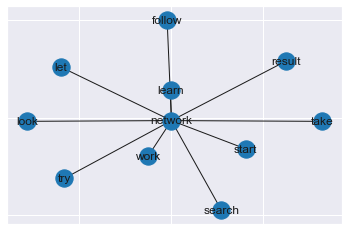

In [399]:
nx.draw_networkx(g_i)

In [401]:
# see "search" neighbors
searchNeighbors = gNV.neighbors('search')
set(searchNeighbors)

{'image', 'machine', 'model', 'network', 'time'}

In [403]:
searchNeighbors= set(gNV.neighbors('search'))
searchNeighborsPlus1 = set(searchNeighbors)
for n in searchNeighbors:
    searchNeighborsPlus1 |= set(gNV.neighbors(n))

In [404]:
gNV_search = gNV.subgraph(searchNeighborsPlus1)
print(nx.info(gNV_search))

Name: 
Type: Graph
Number of nodes: 15
Number of edges: 50
Average degree:   6.6667


In [405]:
# compute degree centrality
sorted(nx.degree_centrality(gNV_search).items(), key = lambda x: x[1], reverse = True)[:10]

[('network', 0.7142857142857142),
 ('model', 0.7142857142857142),
 ('time', 0.7142857142857142),
 ('image', 0.7142857142857142),
 ('machine', 0.7142857142857142),
 ('take', 0.3571428571428571),
 ('follow', 0.3571428571428571),
 ('start', 0.3571428571428571),
 ('work', 0.3571428571428571),
 ('search', 0.3571428571428571)]

In [406]:
# eigenvector centrality
sorted(nx.eigenvector_centrality(gNV_search).items(), key = lambda x: x[1], reverse = True)[:10]

[('network', 0.3162282274894225),
 ('model', 0.3162282274894225),
 ('time', 0.3162282274894225),
 ('image', 0.3162282274894225),
 ('machine', 0.3162282274894225),
 ('take', 0.223606471439109),
 ('follow', 0.223606471439109),
 ('start', 0.223606471439109),
 ('work', 0.223606471439109),
 ('search', 0.223606471439109)]

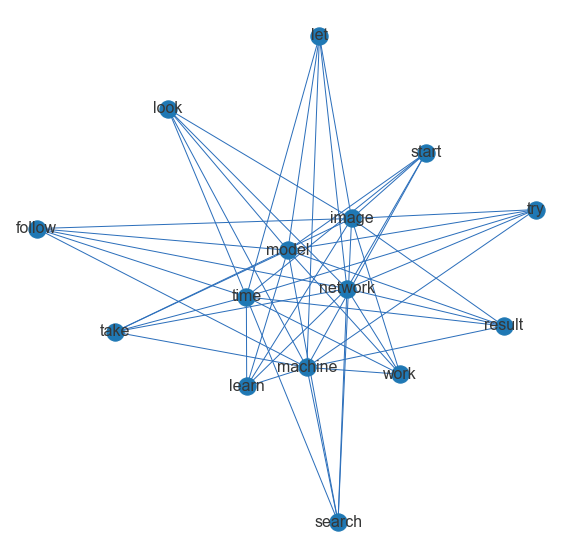

In [407]:
# visualization
layout_search = nx.spring_layout(gNV_search, weight='weight', iterations= 100)
fig, ax = plt.subplots(figsize = (10,10))
nx.draw(gNV_search, ax = ax, pos = layout_search, labels = {n: n for n in gNV_search.nodes()},
        font_size = 16,
        font_color = 'xkcd:dark grey',
        edge_color = 'xkcd:medium blue',
       )

#### 5.4.3 Noun-adjective network

In [15]:
gNJ = posCooccurrence(medium_df['normalized_sents'].sum(), 'NN', 'JJ')
print(nx.info(gNJ))

Name: 
Type: Graph
Number of nodes: 7740
Number of edges: 221029
Average degree:  57.1134


In [16]:
# Remove low weight edges and low frequency nodes
gNJ.remove_nodes_from([n for n in gNJ.nodes if len(set(gNJ.neighbors(n))) <= 1200])
print(nx.info(gNJ))
gNJ.remove_edges_from([(n1, n2) for n1, n2, d in gNJ.edges(data = True) if d['weight'] <= 20])
print(nx.info(gNJ))

Name: 
Type: Graph
Number of nodes: 15
Number of edges: 120
Average degree:  16.0000
Name: 
Type: Graph
Number of nodes: 15
Number of edges: 110
Average degree:  14.6667


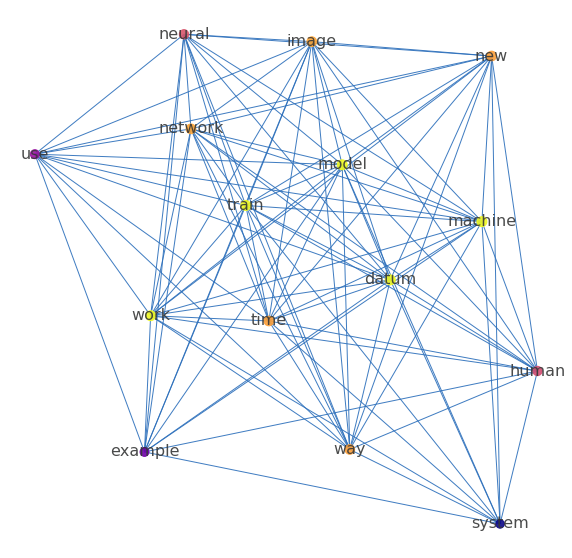

In [17]:
layout_nj = nx.spring_layout(gNJ, weight='weight', iterations= 100)
fig, ax = plt.subplots(figsize = (10,10))
centralities_nj = nx.eigenvector_centrality(gNJ)
maxC = max(centralities_nj.items(), key = lambda x : x[1])[1]
maxWeight = max((d['weight'] for n1, n2, d in gNJ.edges(data = True)))
minWeight = min((d['weight'] for n1, n2, d in gNJ.edges(data = True)))
nx.draw(gNJ, ax = ax, pos = layout_nj, labels = {n: n for n in gNJ.nodes()}, 
        alpha = .9, 
        node_color = [centralities_nj[n] / maxC for n in gNJ.nodes],
        node_size = [centralities_nj[n] / maxC * 100 for n in gNJ.nodes],
        font_size = 16,
        font_color = 'xkcd:dark grey',
        edge_color = 'xkcd:medium blue',
        cmap = plt.get_cmap('plasma'),
       )

In [18]:
# ego-network for noun-adjective network

# create an "ego network" surrounding a single important word: 'time'
g_j = gNJ.subgraph(['time'] + list(gNJ.neighbors('time')))

In [19]:
print(nx.info(g_j))

Name: 
Type: Graph
Number of nodes: 14
Number of edges: 98
Average degree:  14.0000


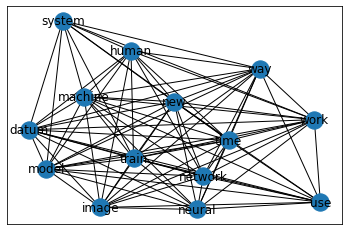

In [20]:
nx.draw_networkx(g_j)

In [21]:
# look at the neighbors of "new"
newNeighbors = gNJ.neighbors('new')
set(newNeighbors)

{'datum',
 'human',
 'image',
 'machine',
 'model',
 'network',
 'neural',
 'new',
 'system',
 'time',
 'train',
 'use',
 'way',
 'work'}

In [22]:
newNeighbors = set(gNJ.neighbors('new'))
newNeighborsPlus1 = set(newNeighbors)
for n in newNeighbors:
    newNeighborsPlus1 |= set(gNJ.neighbors(n))

In [24]:
gNJ_new = gNJ.subgraph(newNeighborsPlus1)
print(nx.info(gNJ_new))

Name: 
Type: Graph
Number of nodes: 15
Number of edges: 110
Average degree:  14.6667


In [26]:
# top 10
sorted(nx.degree_centrality(gNJ_new).items(), key = lambda x: x[1], reverse = True)[:10]

[('machine', 1.1428571428571428),
 ('train', 1.1428571428571428),
 ('model', 1.1428571428571428),
 ('work', 1.1428571428571428),
 ('datum', 1.1428571428571428),
 ('new', 1.0714285714285714),
 ('network', 1.0714285714285714),
 ('way', 1.0714285714285714),
 ('time', 1.0714285714285714),
 ('image', 1.0714285714285714)]

In [28]:
# bottom 10
sorted(nx.eigenvector_centrality(gNJ_new).items(), key = lambda x: x[1], reverse = True)[:10]

[('machine', 0.2788078869851344),
 ('train', 0.2788078869851344),
 ('model', 0.2788078869851344),
 ('work', 0.2788078869851344),
 ('datum', 0.2788078869851344),
 ('network', 0.26390246741640133),
 ('image', 0.26390246741640133),
 ('new', 0.2627781472334494),
 ('way', 0.2627781472334494),
 ('time', 0.2627781472334494)]

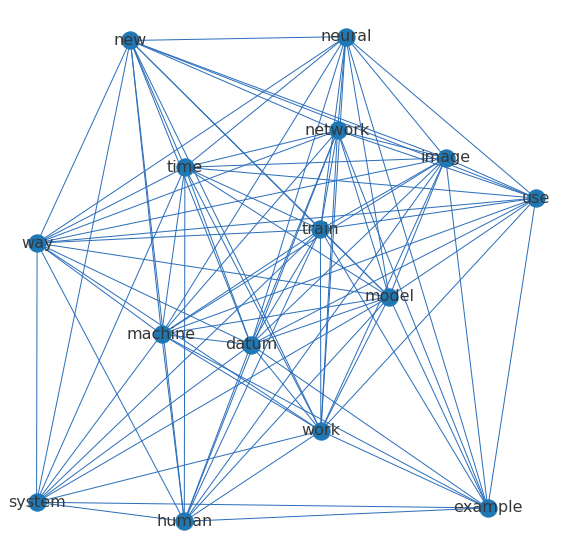

In [29]:
layout_new = nx.spring_layout(gNJ_new, weight='weight', iterations= 100)
fig, ax = plt.subplots(figsize = (10,10))
nx.draw(gNJ_new, ax = ax, pos = layout_new, labels = {n: n for n in gNJ_new.nodes()},
        font_size = 16,
        font_color = 'xkcd:dark grey',
        edge_color = 'xkcd:medium blue',
       )

According to the network graphs, either in the noun-noun network, noun-vern network or in the noun-adjective network, the words such as 'machine', 'model', 'netwrok' are always the most central words. 

Scretch. I draw the ego networks for 'datum', 'network', 'new' and so on. They are helpful to identify common combinations of these words. For instance, from the result above, we can find that 'search', 'try', 'learn', 'start' are quite commonly connected with the noun 'network', which in lines with our common sense.

## 6. Discovering patterns: Clusters & Topics

### 6.1 K-means

In [30]:
import sklearn
import sklearn.feature_extraction.text
import sklearn.pipeline
import sklearn.preprocessing
import sklearn.datasets
import sklearn.cluster
import sklearn.decomposition
import sklearn.metrics

In [31]:
# reload data
medium_df = pd.read_csv("medium.csv")
medium_df.head()

,author,claps,reading_time,link,title,text
0,Justin Lee,8.3K,11,https://medium.com/swlh/chatbots-were-the-next...,Chatbots were the next big thing: what happene...,"Oh, how the headlines blared:\nChatbots were T..."
1,Conor Dewey,1.4K,7,https://towardsdatascience.com/python-for-data...,Python for Data Science: 8 Concepts You May Ha...,If you’ve ever found yourself looking up the s...
2,William Koehrsen,2.8K,11,https://towardsdatascience.com/automated-featu...,Automated Feature Engineering in Python – Towa...,Machine learning is increasingly moving from h...
3,Gant Laborde,1.3K,7,https://medium.freecodecamp.org/machine-learni...,Machine Learning: how to go from Zero to Hero ...,If your understanding of A.I. and Machine Lear...
4,Emmanuel Ameisen,935,11,https://blog.insightdatascience.com/reinforcem...,Reinforcement Learning from scratch – Insight ...,Want to learn about applied Artificial Intelli...


In [32]:
# convert the documents into word count vectors
medCountVectorizer = sklearn.feature_extraction.text.CountVectorizer()
mediumVects = medCountVectorizer.fit_transform(medium_df['text'])
print(mediumVects.shape)

(337, 20396)


In [33]:
mediumVects

<337x20396 sparse matrix of type '<class 'numpy.int64'>'
	with 207027 stored elements in Compressed Sparse Row format>

In [34]:
# look up the indices of different words using the Vectorizer
medCountVectorizer.vocabulary_.get('vector')

18398

In [35]:
# implement tf-idf
mediumTFTransformer = sklearn.feature_extraction.text.TfidfTransformer().fit(mediumVects)
mediumTF = mediumTFTransformer.transform(mediumVects)
print(mediumTF.shape)

(337, 20396)


In [36]:
# see the tf-idf for each word in each text
list(zip(medCountVectorizer.vocabulary_.keys(), mediumTF.data))[:20]

[('oh', 0.02206601996883917),
 ('how', 0.021389951923591687),
 ('the', 0.01723100359636826),
 ('headlines', 0.039471849323310354),
 ('blared', 0.01625567061926425),
 ('chatbots', 0.012680201174679212),
 ('were', 0.021389951923591687),
 ('next', 0.02402300986864087),
 ('big', 0.010189158913520648),
 ('thing', 0.0246980861859421),
 ('our', 0.009815677115797098),
 ('hopes', 0.012855655012457048),
 ('sky', 0.02845466314226932),
 ('high', 0.010651244957817534),
 ('bright', 0.013462346687896075),
 ('eyed', 0.006093242591498654),
 ('and', 0.019194870052168456),
 ('bushy', 0.024540036467223664),
 ('tailed', 0.02286563874863499),
 ('industry', 0.00688903268398373)]

In [37]:
# limit word vector to 1000 words with at least 3 occurrences
mediumTFVectorizer = sklearn.feature_extraction.text.TfidfVectorizer(max_df=0.5, max_features=1000, min_df=3, stop_words='english', norm='l2')
mediumTFVects = mediumTFVectorizer.fit_transform(medium_df['text'])

In [38]:
# display vector for the given word
try:
    print(mediumTFVectorizer.vocabulary_['innovation'])
except KeyError:
    print('innovation is missing')
    print('The available words are: {} ...'.format(list(mediumTFVectorizer.vocabulary_.keys())[:10]))

441


Before doing k-means clustering, we can select an optimal cluster number using Silhouette method.

In [39]:
# define a helper function for Silhouette method
# revised based on the previous function given by the notebook
# since the reduced_data is not a global variable without changes
def plotSilhouette_revised(n_clusters, X, reduced_data):
    
    fig, (ax1, ax2) = plt.subplots(ncols=2, figsize = (15,5))
    
    ax1.set_xlim([-0.1, 1])
    ax1.set_ylim([0, len(X) + (n_clusters + 1) * 10])
    clusterer = sklearn.cluster.KMeans(n_clusters=n_clusters, random_state=10)
    cluster_labels = clusterer.fit_predict(X)
    
    silhouette_avg = sklearn.metrics.silhouette_score(X, cluster_labels)

    # Compute the silhouette scores for each sample
    sample_silhouette_values = sklearn.metrics.silhouette_samples(X, cluster_labels)

    y_lower = 10
    
    for i in range(n_clusters):
        ith_cluster_silhouette_values = sample_silhouette_values[cluster_labels == i]

        ith_cluster_silhouette_values.sort()

        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i
        cmap = matplotlib.cm.get_cmap("nipy_spectral")
        color = cmap(float(i) / n_clusters)
        ax1.fill_betweenx(np.arange(y_lower, y_upper),
                          0, ith_cluster_silhouette_values,
                          facecolor=color, edgecolor=color, alpha=0.7)

        ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

        y_lower = y_upper + 10
    
    ax1.set_title("The silhouette plot for the various clusters.")
    ax1.set_xlabel("The silhouette coefficient values")
    ax1.set_ylabel("Cluster label")

    ax1.axvline(x=silhouette_avg, color="red", linestyle="--")

    ax1.set_yticks([])  # Clear the yaxis labels / ticks
    ax1.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])

    # 2nd Plot showing the actual clusters formed
    cmap = matplotlib.cm.get_cmap("nipy_spectral")
    colors = cmap(float(i) / n_clusters)
    ax2.scatter(reduced_data[:, 0], reduced_data[:, 1], marker='.', s=30, lw=0, alpha=0.7,
                c=colors)

    # Labeling the clusters
    centers = clusterer.cluster_centers_
    projected_centers = pca.transform(centers)
    # Draw white circles at cluster centers
    ax2.scatter(projected_centers[:, 0], projected_centers[:, 1],
                marker='o', c="white", alpha=1, s=200)

    for i, c in enumerate(projected_centers):
        ax2.scatter(c[0], c[1], marker='$%d$' % i, alpha=1, s=50)

    ax2.set_title("The visualization of the clustered data.")
    ax2.set_xlabel("PC 1")
    ax2.set_ylabel("PC 2")

    plt.suptitle(("Silhouette analysis for KMeans clustering on sample data "
                  "with n_clusters = %d" % n_clusters),
                 fontsize=14, fontweight='bold')
    plt.show()
    print("For n_clusters = {}, The average silhouette_score is : {:.3f}".format(n_clusters, silhouette_avg))

'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


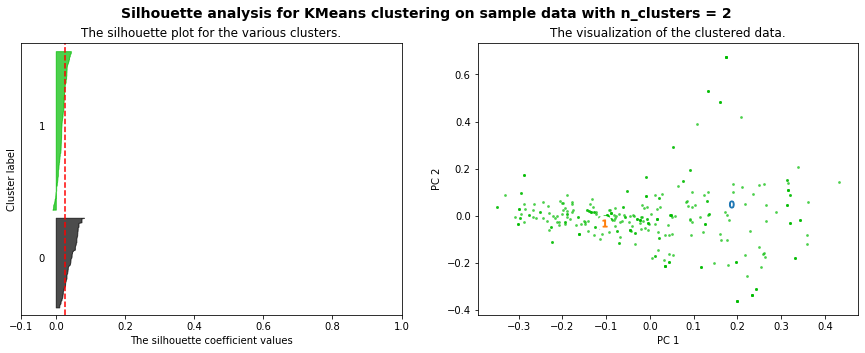

For n_clusters = 2, The average silhouette_score is : 0.025


In [40]:
# PCA (n_components = 2)
PCA = sklearn.decomposition.PCA
pca = PCA(n_components = 2).fit(mediumTFVects.toarray())
reduced_data = pca.transform(mediumTFVects.toarray())
# Silhouette analysis
X = mediumTFVects.toarray()
plotSilhouette_revised(2, X, reduced_data)

'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


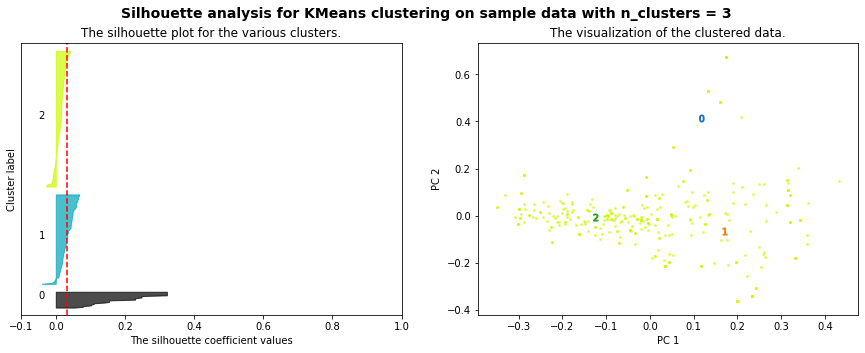

For n_clusters = 3, The average silhouette_score is : 0.032


In [41]:
# PCA (n_components = 3)
PCA = sklearn.decomposition.PCA
pca = PCA(n_components = 3).fit(mediumTFVects.toarray())
reduced_data = pca.transform(mediumTFVects.toarray())
# Silhouette analysis
X = mediumTFVects.toarray()
plotSilhouette_revised(3, X, reduced_data)

'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


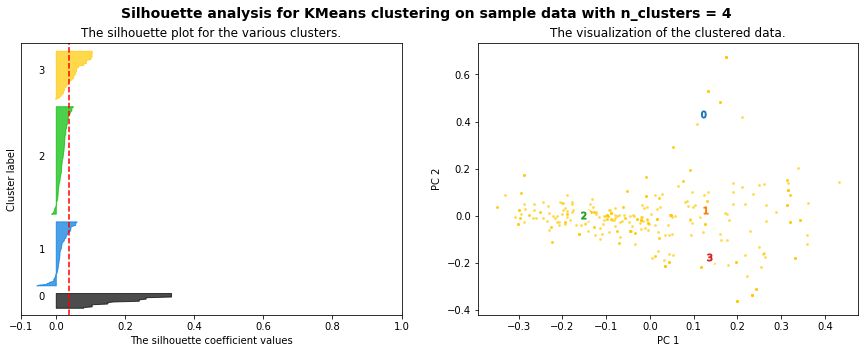

For n_clusters = 4, The average silhouette_score is : 0.037


In [42]:
# PCA (n_components = 4)
PCA = sklearn.decomposition.PCA
pca = PCA(n_components = 4).fit(mediumTFVects.toarray())
reduced_data = pca.transform(mediumTFVects.toarray())
# Silhouette analysis
X = mediumTFVects.toarray()
plotSilhouette_revised(4, X, reduced_data)

'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


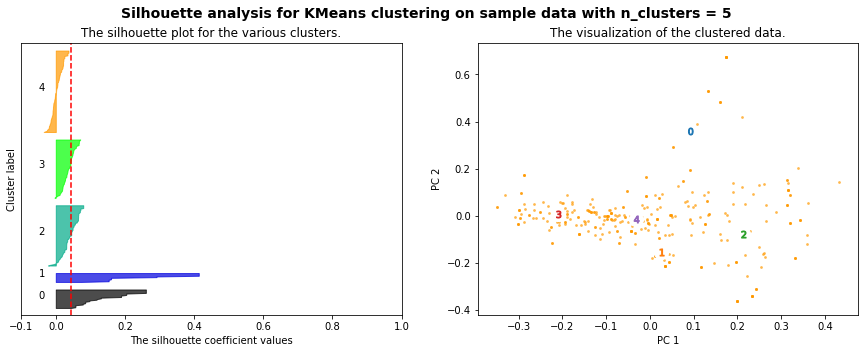

For n_clusters = 5, The average silhouette_score is : 0.044


In [43]:
# PCA (n_components = 5)
PCA = sklearn.decomposition.PCA
pca = PCA(n_components = 5).fit(mediumTFVects.toarray())
reduced_data = pca.transform(mediumTFVects.toarray())
# Silhouette analysis
X = mediumTFVects.toarray()
plotSilhouette_revised(5, X, reduced_data)

'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


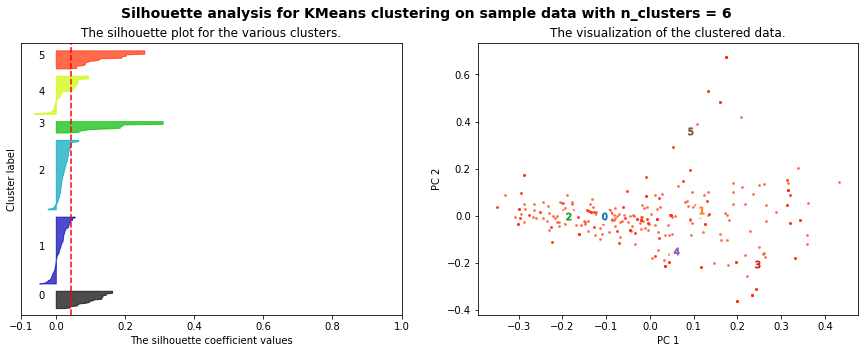

For n_clusters = 6, The average silhouette_score is : 0.044


In [44]:
# PCA (n_components = 6)
PCA = sklearn.decomposition.PCA
pca = PCA(n_components = 6).fit(mediumTFVects.toarray())
reduced_data = pca.transform(mediumTFVects.toarray())
# Silhouette analysis
X = mediumTFVects.toarray()
plotSilhouette_revised(6, X, reduced_data)

Based on the results above, we can see that the optimal number of clusters is 5 or 6 (their silhouette score are same). So here we can choose 5.

In [45]:
km5 = sklearn.cluster.KMeans(n_clusters= 5, init='k-means++')
km5.fit(mediumTFVects.toarray())

KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=300,
       n_clusters=5, n_init=10, n_jobs=None, precompute_distances='auto',
       random_state=None, tol=0.0001, verbose=0)

Furthermore, we can look at Homogeneity, Completeness, V-measure and Adjusted Rand Score.

In [46]:
print("Homogeneity: {:0.3f}".format(sklearn.metrics.homogeneity_score(medium_df['text'], km5.labels_)))
print("Completeness: {:0.3f}".format(sklearn.metrics.completeness_score(medium_df['text'], km5.labels_)))
print("V-measure: {:0.3f}".format(sklearn.metrics.v_measure_score(medium_df['text'], km5.labels_)))
print("Adjusted Rand Score: {:0.3f}".format(sklearn.metrics.adjusted_rand_score(medium_df['text'], km5.labels_)))

Homogeneity: 0.262
Completeness: 1.000
V-measure: 0.415
Adjusted Rand Score: 0.015


In [47]:
#distinguishing features of the clusters

terms = mediumTFVectorizer.get_feature_names()
print("Top terms per cluster:")
order_centroids = km5.cluster_centers_.argsort()[:, ::-1]
for i in range(5):
    print("Cluster %d:" % i)
    for ind in order_centroids[i, :10]:
        print(' %s' % terms[ind])
    print('\n')

Top terms per cluster:
Cluster 0:
 intelligence
 google
 artificial
 technology
 companies
 science
 course
 computer
 app
 future


Cluster 1:
 policy
 action
 table
 reward
 actions
 environment
 rl
 state
 agent
 value


Cluster 2:
 image
 images
 cnn
 pi
 layer
 gtx
 features
 object
 train
 rnn


Cluster 3:
 neuron
 weights
 neurons
 function
 layer
 output
 gradient
 sigmoid
 cheat
 backpropagation


Cluster 4:
 dataset
 models
 tensorflow
 input
 algorithm
 loss
 function
 matrix
 variables
 regression




In [48]:
#assigning the predicted clusters to the dataframe 
medium_df['kmeans_predictions'] = km5.labels_
medium_df

,author,claps,reading_time,link,title,text,kmeans_predictions
0,Justin Lee,8.3K,11,https://medium.com/swlh/chatbots-were-the-next...,Chatbots were the next big thing: what happene...,"Oh, how the headlines blared:\nChatbots were T...",0
1,Conor Dewey,1.4K,7,https://towardsdatascience.com/python-for-data...,Python for Data Science: 8 Concepts You May Ha...,If you’ve ever found yourself looking up the s...,3
2,William Koehrsen,2.8K,11,https://towardsdatascience.com/automated-featu...,Automated Feature Engineering in Python – Towa...,Machine learning is increasingly moving from h...,4
3,Gant Laborde,1.3K,7,https://medium.freecodecamp.org/machine-learni...,Machine Learning: how to go from Zero to Hero ...,If your understanding of A.I. and Machine Lear...,0
4,Emmanuel Ameisen,935,11,https://blog.insightdatascience.com/reinforcem...,Reinforcement Learning from scratch – Insight ...,Want to learn about applied Artificial Intelli...,1
...,...,...,...,...,...,...,...
332,Daniel Simmons,3.4K,8,https://itnext.io/you-can-build-a-neural-netwo...,You can build a neural network in JavaScript e...,Click here to share this article on LinkedIn »...,3
333,Eugenio Culurciello,2.8K,13,https://towardsdatascience.com/artificial-inte...,"Artificial Intelligence, AI in 2018 and beyond...",These are my opinions on where deep neural net...,0
334,Devin Soni,5.8K,4,https://towardsdatascience.com/spiking-neural-...,"Spiking Neural Networks, the Next Generation o...",Everyone who has been remotely tuned in to rec...,3
335,Carlos E. Perez,3.9K,7,https://medium.com/intuitionmachine/neurons-ar...,Surprise! Neurons are Now More Complex than We...,One of the biggest misconceptions around is th...,3


### 6.2 Hierarchical Clustering

In [52]:
import scipy #For hierarchical clustering and some visuals
#import scipy.cluster.hierarchy
import gensim

In [49]:
mediumTFVects

<337x1000 sparse matrix of type '<class 'numpy.float64'>'
	with 65169 stored elements in Compressed Sparse Row format>

First of all, we implement the first method: we create a word occurence matrix measuring how similar the documents are to each other based on their number of shared words.

In [50]:
# get the matrix
mediumCoocMat = mediumTFVects * mediumTFVects.T
# set the diagonal to 0
mediumCoocMat.setdiag(0)

In [53]:
medium_matrix = scipy.cluster.hierarchy.ward(mediumCoocMat[:50, :50].toarray())

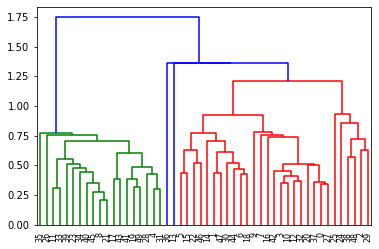

In [54]:
d=scipy.cluster.hierarchy.dendrogram(medium_matrix, get_leaves=True)

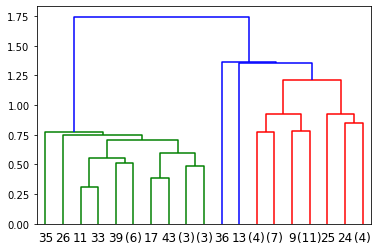

In [55]:
ax = scipy.cluster.hierarchy.dendrogram(medium_matrix, p=5, truncate_mode='level', get_leaves=True)

The second method is to cut the tree into n branches using fcluster().

In [56]:
medium_linkage_matrix_full = scipy.cluster.hierarchy.ward(mediumCoocMat.toarray())
medium_hierarchicalClusters_full = scipy.cluster.hierarchy.fcluster(medium_linkage_matrix_full, 5, 'maxclust')
medium_hierarchicalClusters_full

array([4, 4, 5, 4, 1, 3, 4, 4, 5, 4, 4, 5, 4, 4, 3, 3, 4, 4, 4, 4, 4, 5,
       4, 5, 4, 4, 5, 4, 4, 4, 4, 4, 4, 5, 5, 5, 4, 4, 4, 5, 5, 5, 4, 4,
       2, 5, 3, 4, 4, 5, 5, 5, 5, 5, 3, 4, 3, 3, 4, 1, 4, 4, 4, 2, 4, 4,
       4, 4, 4, 3, 4, 3, 4, 2, 4, 4, 5, 2, 4, 5, 1, 5, 5, 4, 4, 4, 4, 4,
       1, 3, 4, 4, 5, 4, 4, 4, 4, 4, 4, 4, 4, 2, 4, 4, 4, 4, 4, 4, 4, 4,
       4, 4, 4, 4, 5, 4, 4, 4, 4, 4, 4, 4, 4, 4, 5, 5, 2, 4, 4, 4, 5, 2,
       4, 4, 4, 4, 4, 1, 4, 4, 4, 4, 4, 4, 4, 3, 4, 4, 3, 5, 4, 5, 4, 4,
       1, 4, 4, 1, 3, 5, 4, 3, 2, 1, 5, 4, 5, 5, 3, 3, 3, 1, 3, 2, 3, 5,
       5, 4, 5, 2, 5, 2, 4, 4, 2, 4, 5, 2, 4, 4, 2, 2, 4, 1, 2, 1, 4, 3,
       3, 2, 3, 5, 5, 2, 4, 5, 1, 1, 4, 4, 4, 5, 4, 3, 3, 4, 4, 4, 5, 4,
       4, 3, 5, 4, 5, 3, 5, 4, 5, 4, 4, 2, 4, 4, 5, 4, 4, 4, 5, 4, 4, 4,
       4, 4, 4, 5, 4, 4, 4, 5, 3, 3, 4, 3, 4, 4, 2, 4, 4, 3, 5, 4, 4, 4,
       2, 5, 4, 4, 4, 3, 3, 3, 4, 4, 4, 4, 4, 3, 3, 3, 4, 5, 5, 1, 2, 5,
       5, 5, 5, 5, 2, 1, 5, 2, 2, 1, 4, 5, 4, 5, 2,

In [57]:
sklearn.metrics.silhouette_score(mediumCoocMat, medium_hierarchicalClusters_full)

0.12192136949223538

In [58]:
medium_df['wald_predictions'] = medium_hierarchicalClusters_full
medium_df.iloc[:20]

,author,claps,reading_time,link,title,text,kmeans_predictions,wald_predictions
0,Justin Lee,8.3K,11,https://medium.com/swlh/chatbots-were-the-next...,Chatbots were the next big thing: what happene...,"Oh, how the headlines blared:\nChatbots were T...",0,4
1,Conor Dewey,1.4K,7,https://towardsdatascience.com/python-for-data...,Python for Data Science: 8 Concepts You May Ha...,If you’ve ever found yourself looking up the s...,3,4
2,William Koehrsen,2.8K,11,https://towardsdatascience.com/automated-featu...,Automated Feature Engineering in Python – Towa...,Machine learning is increasingly moving from h...,4,5
3,Gant Laborde,1.3K,7,https://medium.freecodecamp.org/machine-learni...,Machine Learning: how to go from Zero to Hero ...,If your understanding of A.I. and Machine Lear...,0,4
4,Emmanuel Ameisen,935,11,https://blog.insightdatascience.com/reinforcem...,Reinforcement Learning from scratch – Insight ...,Want to learn about applied Artificial Intelli...,1,1
5,Irhum Shafkat,2K,15,https://towardsdatascience.com/intuitively-und...,Intuitively Understanding Convolutions for Dee...,The advent of powerful and versatile deep lear...,2,3
6,Sam Drozdov,2.3K,6,https://uxdesign.cc/an-intro-to-machine-learni...,An intro to Machine Learning for designers – U...,There is an ongoing debate about whether or no...,4,4
7,Conor Dewey,252,10,https://towardsdatascience.com/the-big-list-of...,The Big List of DS/ML Interview Resources – To...,Data science interviews certainly aren’t easy....,0,4
8,Abhishek Parbhakar,937,6,https://towardsdatascience.com/must-know-infor...,Must know Information Theory concepts in Deep ...,Information theory is an important field that ...,4,5
9,Aman Dalmia,2.3K,17,https://blog.usejournal.com/what-i-learned-fro...,What I learned from interviewing at multiple A...,"Over the past 8 months, I’ve been interviewing...",0,4


From above results, we can see that wald_predictions are different from the k_means_predictions and wald_prediction performs better based on silhouette_score.

### 6.3 Topic modeling

In [211]:
# reload data
medium_df = pd.read_csv("medium.csv")

In [212]:
medium_df['tokenized_text'] = medium_df['text'].apply(lambda x: lucem_illud_2020.word_tokenize(x))
medium_df['normalized_tokens'] = medium_df['tokenized_text'].apply(lambda x: lucem_illud_2020.normalizeTokens(x))

In [213]:
# drop missing
def dropMissing(wordLst, vocab):
    return [w for w in wordLst if w in vocab]
medium_df['reduced_tokens'] = medium_df['normalized_tokens'].apply(lambda x: dropMissing(x, mediumTFVectorizer.vocabulary_.keys()))

In [214]:
dictionary = gensim.corpora.Dictionary(medium_df['reduced_tokens'])
corpus = [dictionary.doc2bow(text) for text in medium_df['reduced_tokens']]

In [215]:
# serialize the corpus
gensim.corpora.MmCorpus.serialize('medium.mm', corpus)
medmm = gensim.corpora.MmCorpus('medium.mm')

Now we have a correctly formatted corpus that we can use for topic modeling and induction.

In [216]:
# LDA model
medlda = gensim.models.ldamodel.LdaModel(corpus=medmm, id2word=dictionary, num_topics=10, alpha='auto', eta='auto')

In [217]:
# inspect the degree to which distinct texts load on different topics
med1Bow = dictionary.doc2bow(medium_df['reduced_tokens'][0])
med1lda = medlda[med1Bow]
print("The topics of the text: {}".format(medium_df['title'][0]))
print("are: {}".format(med1lda))

The topics of the text: Chatbots were the next big thing: what happened? – The Startup – Medium
are: [(0, 0.079820685), (4, 0.21821544), (5, 0.28147903), (9, 0.41843805)]


In [218]:
# build a dataframe with topics for each text
med_ldaDF = pandas.DataFrame({
        'name' : medium_df['title'],
        'topics' : [medlda[dictionary.doc2bow(l)] for l in medium_df['reduced_tokens']]
    })
med_ldaDF.head()

,name,topics
0,Chatbots were the next big thing: what happene...,"[(0, 0.08076965), (4, 0.18780646), (5, 0.29395..."
1,Python for Data Science: 8 Concepts You May Ha...,"[(1, 0.019018123), (4, 0.97676206)]"
2,Automated Feature Engineering in Python – Towa...,"[(1, 0.51351047), (2, 0.41130874), (3, 0.07291..."
3,Machine Learning: how to go from Zero to Hero ...,"[(4, 0.86077034), (6, 0.02693617), (7, 0.10541..."
4,Reinforcement Learning from scratch – Insight ...,"[(2, 0.80393094), (4, 0.028677711), (9, 0.1654..."


In [219]:
# make each topic its own column

#Dict to temporally hold the probabilities
topicsProbDict = {i : [0] * len(med_ldaDF) for i in range(medlda.num_topics)}

#Load them into the dict
for index, topicTuples in enumerate(med_ldaDF['topics']):
    for topicNum, prob in topicTuples:
        topicsProbDict[topicNum][index] = prob

#Update the DataFrame
for topicNum in range(medlda.num_topics):
    med_ldaDF['topic_{}'.format(topicNum)] = topicsProbDict[topicNum]

med_ldaDF[1::100]

,name,topics,topic_0,topic_1,topic_2,topic_3,topic_4,topic_5,topic_6,topic_7,topic_8,topic_9
1,Python for Data Science: 8 Concepts You May Ha...,"[(1, 0.019018123), (4, 0.97676206)]",0.0,0.019018,0.000000,0.0,0.976762,0.000000,0.000000,0.0,0.000000,0.0
101,How to build a simple neural network in 9 line...,"[(2, 0.06781183), (4, 0.9268989)]",0.0,0.000000,0.067812,0.0,0.926899,0.000000,0.000000,0.0,0.000000,0.0
201,"The $1700 great Deep Learning box: Assembly, s...","[(6, 0.61437947), (8, 0.38359645)]",0.0,0.000000,0.000000,0.0,0.000000,0.000000,0.614379,0.0,0.383596,0.0
301,Everything You Need to Know About Artificial N...,"[(1, 0.18505642), (2, 0.689425), (4, 0.0815711...",0.0,0.185056,0.689425,0.0,0.081571,0.041721,0.000000,0.0,0.000000,0.0


In [67]:
# subset the first 10 docs in corpus
med_ldaDFV = med_ldaDF[:10][['topic_%d' %x for x in range(10)]]
med_ldaDFVisN = med_ldaDF[:10][['name']]
# pandas.DataFrame.as_matrix deprecated since version 0.23.0:
med_ldaDFVis = med_ldaDFV.values
med_ldaDFVisNames = med_ldaDFVisN.values
med_ldaDFV

,topic_0,topic_1,topic_2,topic_3,topic_4,topic_5,topic_6,topic_7,topic_8,topic_9
0,0.000000,0.091493,0.011665,0.000000,0.000000,0.874496,0.000000,0.000000,0.020295,0.000000
1,0.267833,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.718531,0.000000
2,0.997115,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
3,0.000000,0.000000,0.000000,0.408070,0.000000,0.000000,0.310702,0.000000,0.000000,0.276835
4,0.000000,0.000000,0.000000,0.997558,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
5,0.136179,0.000000,0.000000,0.000000,0.033977,0.000000,0.000000,0.206851,0.031453,0.590556
6,0.066404,0.000000,0.000000,0.011014,0.000000,0.020162,0.298283,0.383429,0.217900,0.000000
7,0.000000,0.444403,0.000000,0.000000,0.000000,0.000000,0.000000,0.161122,0.376960,0.000000
8,0.000000,0.000000,0.000000,0.000000,0.000000,0.993499,0.000000,0.000000,0.000000,0.000000
9,0.000000,0.806106,0.000000,0.076901,0.000000,0.000000,0.000000,0.000000,0.028673,0.077555


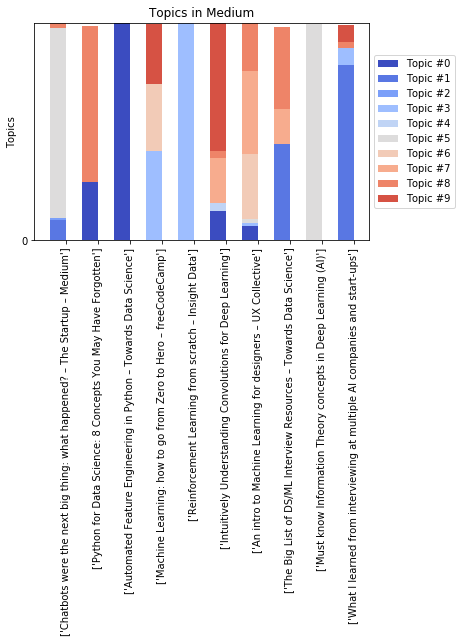

In [68]:
# first we can visualize as a stacked bar chart
N = 10
ind = np.arange(N)
K = medlda.num_topics  # N documents, K topics
ind = np.arange(N)  # the x-axis locations for the novels
width = 0.5  # the width of the bars
plots = []
height_cumulative = np.zeros(N)

for k in range(K):
    color = plt.cm.coolwarm(k/K, 1)
    if k == 0:
        p = plt.bar(ind, med_ldaDFVis[:, k], width, color=color)
    else:
        p = plt.bar(ind, med_ldaDFVis[:, k], width, bottom=height_cumulative, color=color)
    height_cumulative += med_ldaDFVis[:, k]
    plots.append(p)
    

plt.ylim((0, 1))  # proportions sum to 1, so the height of the stacked bars is 1
plt.ylabel('Topics')

plt.title('Topics in Medium')
plt.xticks(ind+width/2, med_ldaDFVisNames, rotation='vertical')

plt.yticks(np.arange(0, 1, 10))
topic_labels = ['Topic #{}'.format(k) for k in range(K)]
plt.legend([p[0] for p in plots], topic_labels, loc='center left', frameon=True,  bbox_to_anchor = (1, .5))

plt.show()

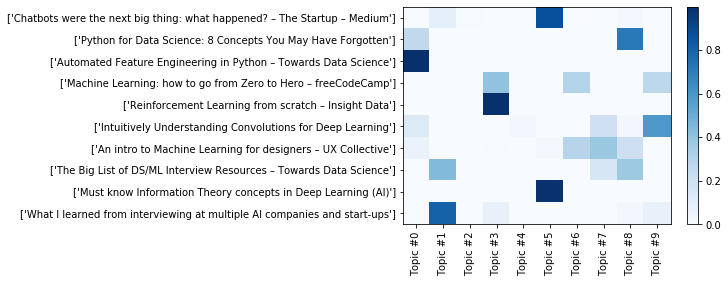

In [69]:
plt.pcolor(med_ldaDFVis, norm=None, cmap='Blues')
plt.yticks(np.arange(med_ldaDFVis.shape[0])+0.5, med_ldaDFVisNames);
plt.xticks(np.arange(med_ldaDFVis.shape[1])+0.5, topic_labels);

# flip the y-axis so the texts are in the order we anticipate (Austen first, then Brontë)
plt.gca().invert_yaxis()

# rotate the ticks on the x-axis
plt.xticks(rotation=90)

# add a legend
plt.colorbar(cmap='Blues')
plt.show()

We can also look at the top words from each topic to get a sense of semantic domain they represent.

In [70]:
medlda.show_topic(1)

[('computer', 0.008811059),
 ('train', 0.008395497),
 ('course', 0.007864244),
 ('input', 0.0077878884),
 ('layer', 0.0068464624),
 ('mean', 0.006675158),
 ('build', 0.0060244934),
 ('come', 0.005449601),
 ('thing', 0.0053194286),
 ('try', 0.0052956524)]

In [74]:
medlda.show_topic(2)

[('function', 0.009689886),
 ('algorithm', 0.008958373),
 ('train', 0.008731144),
 ('weight', 0.008268058),
 ('image', 0.0081052855),
 ('input', 0.007790368),
 ('layer', 0.0071367496),
 ('output', 0.0069088335),
 ('mean', 0.006427153),
 ('user', 0.00600861)]

In [75]:
medlda.show_topic(3)

[('train', 0.02160686),
 ('image', 0.016793523),
 ('algorithm', 0.011016398),
 ('value', 0.009718295),
 ('course', 0.008676035),
 ('game', 0.0071834493),
 ('code', 0.0070945336),
 ('layer', 0.0062906025),
 ('play', 0.0060983547),
 ('result', 0.0060329856)]

In [71]:
# make a dataframe
topicsDict = {}
for topicNum in range(medlda.num_topics):
    topicWords = [w for w, p in medlda.show_topic(topicNum)]
    topicsDict['Topic_{}'.format(topicNum)] = topicWords

wordRanksDF = pandas.DataFrame(topicsDict)
wordRanksDF

,Topic_0,Topic_1,Topic_2,Topic_3,Topic_4,Topic_5,Topic_6,Topic_7,Topic_8,Topic_9
0,image,computer,function,train,image,build,man,layer,image,algorithm
1,train,train,algorithm,image,train,train,intelligence,train,train,layer
2,feature,course,train,algorithm,function,information,company,input,function,train
3,cnn,input,weight,value,computer,value,technology,start,word,input
4,value,layer,image,course,layer,google,algorithm,image,value,google
5,create,mean,input,game,build,cnn,game,thing,code,mean
6,algorithm,build,layer,code,algorithm,intelligence,create,computer,input,course
7,computer,come,output,layer,intelligence,mean,result,come,algorithm,start
8,function,thing,mean,play,output,algorithm,image,follow,point,weight
9,word,try,user,result,run,feature,build,output,build,follow


From the results above, we can see that several of the topics have the same top words such as "train", "layer", "algorithm".

<Figure size 432x288 with 0 Axes>

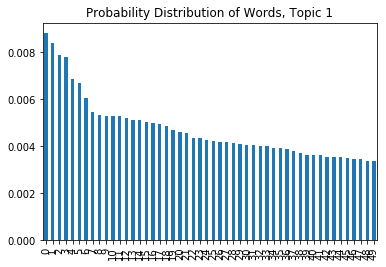

In [73]:
# visualize of the distribution of words over any single topic
topic1_df = pandas.DataFrame(medlda.show_topic(1, topn=50))
plt.figure()
topic1_df.plot.bar(legend = False)
plt.title('Probability Distribution of Words, Topic 1')
plt.show()

In [76]:
# see how different eta change the shape of distribution
medlda1 = gensim.models.ldamodel.LdaModel(corpus=medmm, id2word=dictionary, num_topics=10, eta = 0.00001)
medlda2 = gensim.models.ldamodel.LdaModel(corpus=medmm, id2word=dictionary, num_topics=10, eta = 0.9)

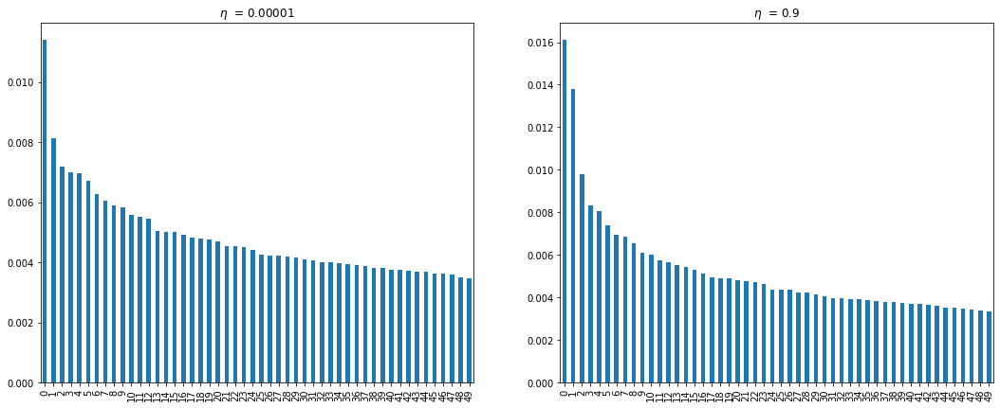

In [77]:
topic11_df = pandas.DataFrame(medlda1.show_topic(1, topn=50))
topic21_df = pandas.DataFrame(medlda2.show_topic(1, topn=50))

fig, (ax1, ax2) = plt.subplots(1, 2)
fig.set_size_inches(18, 7)
topic11_df.plot.bar(legend = False, ax = ax1, title = '$\eta$  = 0.00001')
topic21_df.plot.bar(legend = False, ax = ax2, title = '$\eta$  = 0.9')
plt.show()

In [78]:
# cluster docuements using topic loadings
t0 = np.array(med_ldaDF['topic_0']).reshape(337,1)
t1 = np.array(med_ldaDF['topic_1']).reshape(337,1)
t2 = np.array(med_ldaDF['topic_2']).reshape(337,1)
t3 = np.array(med_ldaDF['topic_3']).reshape(337,1)
t4 = np.array(med_ldaDF['topic_4']).reshape(337,1)

In [79]:
add_topic = np.hstack((mediumTFVects.toarray(), t0))
add_topic = np.hstack((add_topic, t1))
add_topic = np.hstack((add_topic, t2))
add_topic = np.hstack((add_topic, t3))
add_topic = np.hstack((add_topic, t4))

In [80]:
numClusters = 5
km5 = sklearn.cluster.KMeans(n_clusters=numClusters, init='k-means++')
km5.fit(add_topic)
medium_df['kmeans_predictions'] = km5.labels_
for i in range(0, numClusters):
    print('Cluster: {}'.format(i))
    print(medium_df[medium_df.kmeans_predictions == i].head()['title'])

Cluster: 0
7     The Big List of DS/ML Interview Resources – To...
9     What I learned from interviewing at multiple A...
19    Every single Machine Learning course on the in...
28         Emotional Computing – Robbie Tilton – Medium
63    Yes you should understand backprop – Andrej Ka...
Name: title, dtype: object
Cluster: 1
0    Chatbots were the next big thing: what happene...
1    Python for Data Science: 8 Concepts You May Ha...
5    Intuitively Understanding Convolutions for Dee...
6    An intro to Machine Learning for designers – U...
8    Must know Information Theory concepts in Deep ...
Name: title, dtype: object
Cluster: 2
3     Machine Learning: how to go from Zero to Hero ...
4     Reinforcement Learning from scratch – Insight ...
14    Machine Learning is Fun! Part 3: Deep Learning...
15    Machine Learning is Fun! Part 4: Modern Face R...
35    Traveling santa Problem — An incompetent algor...
Name: title, dtype: object
Cluster: 3
12    Deep Learning Is Going to Teach Us

In [81]:
terms = mediumTFVectorizer.get_feature_names()
print("Top terms per cluster:")
order_centroids = km5.cluster_centers_.argsort()[:, ::-1]
for i in range(numClusters):
    print("Cluster %d:" % i)
    for ind in order_centroids[i, :10]:
        if ind < 1000:
            print(' %s' % terms[ind])
        elif ind == 1000:
            print('topic 0')
        elif ind == 1001:
            print('topic 1')
        elif ind == 1002:
            print('topic 2')
        elif ind == 1003:
            print('topic 3')
        else:
            print('topic 4')
    print('\n')

Top terms per cluster:
Cluster 0:
topic 1
 interview
 reviews
 science
 rating
 backpropagation
 turing
 pass
 zero
 udacity


Cluster 1:
topic 2
topic 4
 intelligence
 google
topic 0
 companies
 technology
 input
topic 3
 information


Cluster 2:
topic 3
 image
 images
 policy
 action
 tensorflow
 table
 pi
 algorithm
 ll


Cluster 3:
topic 4
 neuron
 neurons
 brain
 layer
 function
 intelligence
 output
 sound
 weights


Cluster 4:
topic 0
 cnn
 image
 features
 feature
 region
 mask
 generated
 objects
 word




## 7. Word Embeddings

### 7.1 Word2Vec

In [82]:
#All these packages need to be installed from pip
import gensim#For word2vec, etc
import requests #For downloading our datasets
import lucem_illud_2020

import numpy as np #For arrays
import pandas as pd #Gives us DataFrames
import matplotlib.pyplot as plt #For graphics
import seaborn #Makes the graphics look nicer
import sklearn.metrics.pairwise #For cosine similarity
import sklearn.manifold #For T-SNE
import sklearn.decomposition #For PCA

#This 'magic' command makes the plots work better
#in the notebook, don't use it outside of a notebook.
#Also you can ignore the warning
%matplotlib inline

import os #For looking through files
import os.path #For managing file paths

In [83]:
# reload data
medium_df = pd.read_csv("medium.csv")
medium_df.head()

,author,claps,reading_time,link,title,text
0,Justin Lee,8.3K,11,https://medium.com/swlh/chatbots-were-the-next...,Chatbots were the next big thing: what happene...,"Oh, how the headlines blared:\nChatbots were T..."
1,Conor Dewey,1.4K,7,https://towardsdatascience.com/python-for-data...,Python for Data Science: 8 Concepts You May Ha...,If you’ve ever found yourself looking up the s...
2,William Koehrsen,2.8K,11,https://towardsdatascience.com/automated-featu...,Automated Feature Engineering in Python – Towa...,Machine learning is increasingly moving from h...
3,Gant Laborde,1.3K,7,https://medium.freecodecamp.org/machine-learni...,Machine Learning: how to go from Zero to Hero ...,If your understanding of A.I. and Machine Lear...
4,Emmanuel Ameisen,935,11,https://blog.insightdatascience.com/reinforcem...,Reinforcement Learning from scratch – Insight ...,Want to learn about applied Artificial Intelli...


In [84]:
medium_df['tokenized_sents'] = medium_df['text'].apply(lambda x: [lucem_illud_2020.word_tokenize(s) for s in lucem_illud_2020.sent_tokenize(x)])
medium_df['normalized_sents'] = medium_df['tokenized_sents'].apply(lambda x: [lucem_illud_2020.normalizeTokens(s) for s in x])

In [85]:
# load all the sentences to the trainer
medW2V = gensim.models.word2vec.Word2Vec(medium_df['normalized_sents'].sum())

In [86]:
medW2V.wv.syn0

array([[-5.35645366e-01,  6.23890497e-02,  5.79393983e-01, ...,
        -1.10415089e+00, -9.28332627e-01, -5.54986715e-01],
       [ 2.58934021e-01,  1.18473852e+00, -4.62622792e-01, ...,
        -9.21820045e-01,  4.32067841e-01, -1.00966126e-01],
       [ 9.82260883e-01,  5.41315675e-01, -5.51106036e-01, ...,
        -1.57726812e+00,  4.32360083e-01, -1.57665819e-01],
       ...,
       [ 1.20100174e-02, -2.31860746e-02, -6.24098890e-02, ...,
        -6.67734221e-02,  1.75634995e-02, -1.42784668e-02],
       [ 3.24260048e-03,  4.54417989e-03, -5.93515784e-02, ...,
        -5.91555387e-02,  3.19839828e-03, -2.58656591e-02],
       [-2.05081888e-02,  5.83669078e-03, -5.27298227e-02, ...,
        -3.19912247e-02, -1.20416749e-03, -3.74445841e-02]], dtype=float32)

In [87]:
# translate from matrix to words
medW2V.wv.index2word[10]

'image'

In [88]:
# select the top 50 words from the set
numWords = 50
targetWords = medW2V.wv.index2word[:numWords]

# extract their vectors and create a smaller matrix that preserved
# the distances from the original
wordsSubMatrix = []
for word in targetWords:
    wordsSubMatrix.append(medW2V[word])
wordsSubMatrix = np.array(wordsSubMatrix)
wordsSubMatrix

array([[-0.53564537,  0.06238905,  0.579394  , ..., -1.1041509 ,
        -0.9283326 , -0.5549867 ],
       [ 0.25893402,  1.1847385 , -0.4626228 , ..., -0.92182004,
         0.43206784, -0.10096613],
       [ 0.9822609 ,  0.5413157 , -0.55110604, ..., -1.5772681 ,
         0.43236008, -0.15766582],
       ...,
       [ 0.05584424, -0.02283707, -0.68268186, ..., -0.5949273 ,
        -0.04940881, -0.03432493],
       [-0.93589807,  1.0378822 ,  0.22778387, ..., -0.23273662,
        -1.3754388 , -1.3330176 ],
       [ 0.03604995,  0.6331166 , -0.59201187, ..., -0.03159832,
         0.08719804, -0.30984232]], dtype=float32)

In [89]:
# T-SNE
pcaWords = sklearn.decomposition.PCA(n_components = 50).fit(wordsSubMatrix)
reducedPCA_data = pcaWords.transform(wordsSubMatrix)
#T-SNE is theoretically better, but you should experiment
tsneWords = sklearn.manifold.TSNE(n_components = 2).fit_transform(reducedPCA_data)

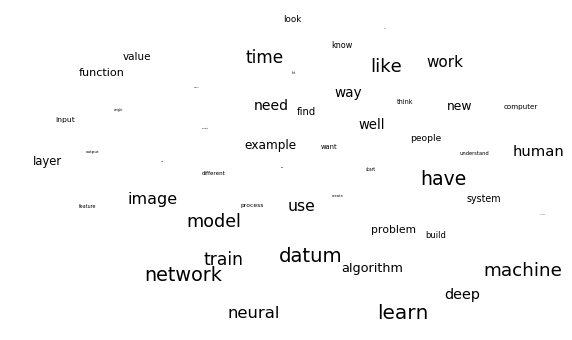

In [90]:
# plot the points
fig = plt.figure(figsize = (10,6))
ax = fig.add_subplot(111)
ax.set_frame_on(False)
plt.scatter(tsneWords[:, 0], tsneWords[:, 1], alpha = 0)#Making the points invisible 
for i, word in enumerate(targetWords):
    ax.annotate(word, (tsneWords[:, 0][i],tsneWords[:, 1][i]), size =  20 * (numWords - i) / numWords)
plt.xticks(())
plt.yticks(())
plt.show()

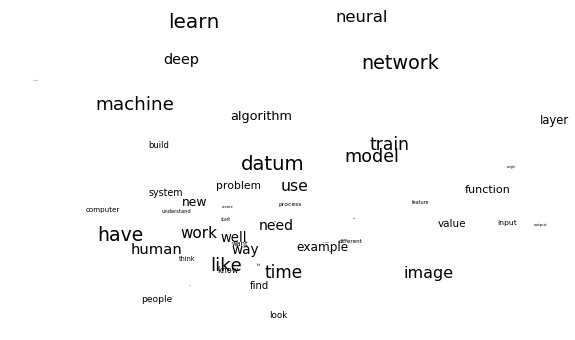

In [91]:
# PCA
pcaWords = sklearn.decomposition.PCA(n_components = 2).fit(wordsSubMatrix)
reducedPCA_data = pcaWords.transform(wordsSubMatrix)

fig = plt.figure(figsize = (10,6))
ax = fig.add_subplot(111)
ax.set_frame_on(False)
plt.scatter(reducedPCA_data[:, 0], reducedPCA_data[:, 1], alpha = 0)#Making the points invisible 
for i, word in enumerate(targetWords):
    ax.annotate(word, (reducedPCA_data[:, 0][i],reducedPCA_data[:, 1][i]),
                size =  20 * (numWords - i) / numWords)
plt.xticks(())
plt.yticks(())
plt.show()

From the visualization, we can find that "train" is next to "network" and "model". And "neural" is the closest neighbor of "network", which are in line with our expectation.

#### 7.1.1 Analogy

In [92]:
medW2V.most_similar(positive=['model', 'human'], negative = ['train'])

[('computer', 0.887676477432251),
 ('think', 0.8662474155426025),
 ('world', 0.8642351627349854),
 ('brain', 0.8610236048698425),
 ('system', 0.8555387258529663),
 ('understand', 0.8392294645309448),
 ('vision', 0.8325233459472656),
 ('play', 0.8153014183044434),
 ('pervasive', 0.8123849034309387),
 ('game', 0.8088520169258118)]

From above results, we can see model -> train, human -> think.

In [94]:
medW2V.most_similar(positive=['computer', 'human'], negative = ['system'])

[('think', 0.8345515727996826),
 ('world', 0.8156683444976807),
 ('people', 0.8090630173683167),
 ('thing', 0.7934153079986572),
 ('brain', 0.790664553642273),
 ('understand', 0.787600040435791),
 ('vision', 0.7767495512962341),
 ('talk', 0.7660056948661804),
 ('play', 0.747071385383606),
 ('game', 0.7367460131645203)]

We can also see that computer -> system,  human->brain.

#### 7.1.2 Similar words

In [95]:
# see the similar word vectors
medW2V.most_similar('network')

[('net', 0.9563912749290466),
 ('backbone', 0.9034745693206787),
 ('unwieldy', 0.9032334089279175),
 ('recurrent', 0.9009155631065369),
 ('compact', 0.8855459690093994),
 ('2-layer', 0.8835064172744751),
 ('convolutional', 0.878315806388855),
 ('networks(cnns', 0.8773396015167236),
 ('architecture', 0.8717015385627747),
 ('interpretable', 0.8669705390930176)]

In [96]:
medW2V.most_similar('model')

[('train', 0.9722087383270264),
 ('interpretable', 0.960597038269043),
 ('dataset', 0.9397112131118774),
 ('net', 0.9390138387680054),
 ('fee', 0.9357372522354126),
 ('set', 0.9328910708427429),
 ('backbone', 0.9319818615913391),
 ('test', 0.9297308325767517),
 ('large', 0.9293938875198364),
 ('svms', 0.926795482635498)]

#### 7.1.3 Least Match

In [97]:
medW2V.doesnt_match(['network', 'networks', 'architecture', 'image', 'machine'])

'machine'

### 7.2 Doc2Vec

We can also take a look at how the different articles in these fields relate to each other within the space.

In [110]:
# reload the data
medium_df = pd.read_csv('medium.csv')

In [111]:
medium_df['tokenized_words'] = medium_df['text'].apply(lambda x: lucem_illud_2020.word_tokenize(x))
medium_df['normalized_words'] = medium_df['tokenized_words'].apply(lambda x: lucem_illud_2020.normalizeTokens(x))

In [112]:
keywords = ['machine', 'network', 'model', 'algorithm', 'learn', 'train']

In [113]:
# insert a id column since it is unique to every article
medium_df['id'] = range(len(medium_df))

In [114]:
medium_df.head()

,author,claps,reading_time,link,title,text,tokenized_words,normalized_words,id
0,Justin Lee,8.3K,11,https://medium.com/swlh/chatbots-were-the-next...,Chatbots were the next big thing: what happene...,"Oh, how the headlines blared:\nChatbots were T...","[Oh, how, the, headlines, blared, Chatbots, we...","[oh, headline, blare, chatbots, big, thing, ho...",0
1,Conor Dewey,1.4K,7,https://towardsdatascience.com/python-for-data...,Python for Data Science: 8 Concepts You May Ha...,If you’ve ever found yourself looking up the s...,"[If, you, ’ve, ever, found, yourself, looking,...","[have, find, look, question, concept, syntax, ...",1
2,William Koehrsen,2.8K,11,https://towardsdatascience.com/automated-featu...,Automated Feature Engineering in Python – Towa...,Machine learning is increasingly moving from h...,"[Machine, learning, is, increasingly, moving, ...","[machine, learn, increasingly, move, hand, des...",2
3,Gant Laborde,1.3K,7,https://medium.freecodecamp.org/machine-learni...,Machine Learning: how to go from Zero to Hero ...,If your understanding of A.I. and Machine Lear...,"[If, your, understanding, of, A.I., and, Machi...","[understand, a.i, machine, learn, big, questio...",3
4,Emmanuel Ameisen,935,11,https://blog.insightdatascience.com/reinforcem...,Reinforcement Learning from scratch – Insight ...,Want to learn about applied Artificial Intelli...,"[Want, to, learn, about, applied, Artificial, ...","[want, learn, apply, artificial, intelligence,...",4


In [115]:
taggedDocs = []

for index, row in medium_df.iterrows():
    #Just doing a simple keyword assignment
    docKeywords = [s for s in keywords if s in row['normalized_words']]
    docKeywords.append(row['id'])
    docKeywords.append(row['title'])
    taggedDocs.append(gensim.models.doc2vec.LabeledSentence(words = row['normalized_words'], tags = docKeywords))
medium_df['TaggedAbstracts'] = taggedDocs

In [116]:
# train a Doc2Vec model
medD2V = gensim.models.doc2vec.Doc2Vec(medium_df['TaggedAbstracts'], size = 100) #Limiting to 100 dimensions

In [117]:
# get vectors for the tags/documents
medD2V.docvecs[5]

array([ 1.0850139 ,  1.3039982 , -1.3296086 ,  0.72673684,  0.7691646 ,
        0.32019615,  0.20824727, -0.42300856, -0.43353918, -0.20182058,
       -0.23448157, -0.09398967, -0.24107838,  0.18723975,  0.1613264 ,
       -0.29625013, -0.06934121,  0.17856845,  0.0508622 , -0.04448857,
        0.16885255,  0.05239254,  0.09038069,  0.24194607,  0.276322  ,
        0.1824157 , -0.3801735 , -0.20296821, -0.46787155,  0.11630133,
       -0.07767649,  0.12337233,  0.35436282,  0.29330248,  0.38504624,
        0.03691033, -0.19382842, -0.07253753, -0.40296155, -0.14490591,
        0.44152105,  0.1374611 , -0.11073028,  0.41550064, -0.28258556,
        0.372113  ,  0.41708565,  0.42012963,  0.02411472, -0.6474981 ,
        0.15149519, -0.50182515, -0.16718596,  0.14997882, -0.11482775,
       -0.22137338, -0.31253648, -0.10255808, -0.22248091, -0.3961506 ,
       -0.01791369, -0.58606815,  0.02399653,  0.3864809 ,  0.12540588,
        0.13159044, -0.17463338, -0.41321287,  0.2037618 , -0.21

In [118]:
medD2V['model']

array([ 0.9301473 ,  1.5395505 , -1.0336999 ,  0.5900509 ,  0.20273691,
       -0.11511385,  0.6101661 ,  0.2204794 ,  0.59615666,  0.68823797,
        0.419992  , -0.51792467, -1.3313798 ,  0.65264195,  0.8537252 ,
       -0.8471345 , -0.12689939, -0.06282125,  1.1724093 ,  0.20890842,
        0.6267005 , -1.1137352 ,  0.6528235 , -0.06390131,  1.4813277 ,
        0.15369658, -1.3381727 , -0.63339055, -1.3130542 ,  0.3161936 ,
        0.2667319 ,  0.22459745,  0.86926115,  0.5886787 ,  0.48006263,
       -0.24142306, -0.69671744, -0.10923588, -0.7823953 ,  0.05923878,
        0.51928747,  0.12346112, -0.40916958,  1.0573152 ,  0.2022165 ,
        0.85834825,  0.51469445,  0.8336975 ,  0.27948043, -1.9815806 ,
        0.21859795, -1.1895682 ,  0.2981554 ,  0.7134969 ,  0.16998594,
        0.13635257, -1.1696854 , -0.10405299, -0.16362818, -0.04856937,
       -0.32187915, -1.3419179 ,  0.4774741 ,  1.2341717 ,  0.98452896,
        1.2333306 , -0.5892321 , -0.70577276,  0.42362556, -0.47

In [120]:
medD2V.docvecs.most_similar([ medD2V['model'] ], topn=5)

[(14, 0.9419366121292114),
 (136, 0.9095247983932495),
 (194, 0.8750388026237488),
 ('Neural networks for algorithmic trading. Simple time series forecasting',
  0.8715778589248657),
 (321, 0.8652015328407288)]

In [121]:
# find words most simialr to this document
medD2V.most_similar( [medD2V.docvecs[14] ], topn=5) 

[('docker', 0.975631594657898),
 ('annotation', 0.9751972556114197),
 ('normalization', 0.973885178565979),
 ('8”s', 0.9703413248062134),
 ('separately', 0.9684128761291504)]

In [122]:
# a "query" like composed of multiple words
medD2V.docvecs.most_similar([ medD2V['model']+medD2V['train']+medD2V['test']], topn=5 )

[(14, 0.9464890956878662),
 (136, 0.9009611010551453),
 (15, 0.8902562260627747),
 (250, 0.8671823740005493),
 ('Continuous online video classification with TensorFlow, Inception and a Raspberry Pi',
  0.8651625514030457)]

Then we can plot some words and documents against one another with a heatmap:

In [123]:
heatmapMatrix = []
for tagOuter in keywords:
    column = []
    tagVec = medD2V.docvecs[tagOuter].reshape(1, -1)
    for tagInner in keywords:
        column.append(sklearn.metrics.pairwise.cosine_similarity(tagVec, medD2V.docvecs[tagInner].reshape(1, -1))[0][0])
    heatmapMatrix.append(column)
heatmapMatrix = np.array(heatmapMatrix)

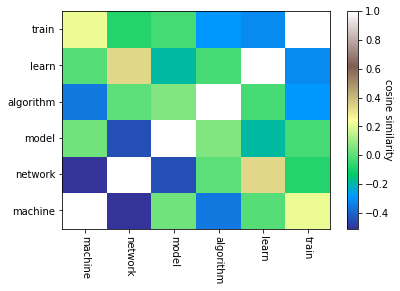

In [124]:
fig, ax = plt.subplots()
hmap = ax.pcolor(heatmapMatrix, cmap='terrain')
cbar = plt.colorbar(hmap)

cbar.set_label('cosine similarity', rotation=270)
a = ax.set_xticks(np.arange(heatmapMatrix.shape[1]) + 0.5, minor=False)
a = ax.set_yticks(np.arange(heatmapMatrix.shape[0]) + 0.5, minor=False)

a = ax.set_xticklabels(keywords, minor=False, rotation=270)
a = ax.set_yticklabels(keywords, minor=False)

In [125]:
# a heatmap of similarities between the first ten documents in the corpus
targetDocs = medium_df['id'][:10]

heatmapMatrixD = []

for tagOuter in targetDocs:
    column = []
    tagVec = medD2V.docvecs[tagOuter].reshape(1, -1)
    for tagInner in targetDocs:
        column.append(sklearn.metrics.pairwise.cosine_similarity(tagVec, medD2V.docvecs[tagInner].reshape(1, -1))[0][0])
    heatmapMatrixD.append(column)
heatmapMatrixD = np.array(heatmapMatrixD)

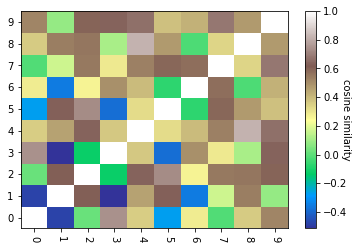

In [126]:
fig, ax = plt.subplots()
hmap = ax.pcolor(heatmapMatrixD, cmap='terrain')
cbar = plt.colorbar(hmap)

cbar.set_label('cosine similarity', rotation=270)
a = ax.set_xticks(np.arange(heatmapMatrixD.shape[1]) + 0.5, minor=False)
a = ax.set_yticks(np.arange(heatmapMatrixD.shape[0]) + 0.5, minor=False)

a = ax.set_xticklabels(targetDocs, minor=False, rotation=270)
a = ax.set_yticklabels(targetDocs, minor=False)

From the heatmap above, we can find that the 6th article is very similar to the 3th article and the 9th article is very similar to the 5th article.

In [127]:
# heatmap of similarities between the first ten documents and keywords
heatmapMatrixC = []

for tagOuter in targetDocs:
    column = []
    tagVec = medD2V.docvecs[tagOuter].reshape(1, -1)
    for tagInner in keywords:
        column.append(sklearn.metrics.pairwise.cosine_similarity(tagVec, medD2V.docvecs[tagInner].reshape(1, -1))[0][0])
    heatmapMatrixC.append(column)
heatmapMatrixC = np.array(heatmapMatrixC)

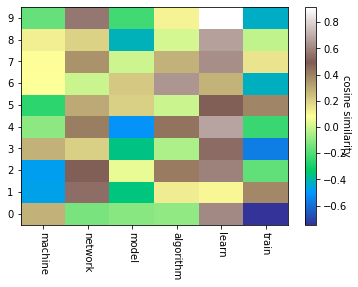

In [128]:
fig, ax = plt.subplots()
hmap = ax.pcolor(heatmapMatrixC, cmap='terrain')
cbar = plt.colorbar(hmap)

cbar.set_label('cosine similarity', rotation=270)
a = ax.set_xticks(np.arange(heatmapMatrixC.shape[1]) + 0.5, minor=False)
a = ax.set_yticks(np.arange(heatmapMatrixC.shape[0]) + 0.5, minor=False)

a = ax.set_xticklabels(keywords, minor=False, rotation=270)
a = ax.set_yticklabels(targetDocs, minor=False)

From the result above, we can find that the 10th article in our corpus has the highest similarity with keyword "learn".

In [129]:
# save the model
medD2V.save('medD2V')

### 7.3 Projection

In [130]:
med_model = medW2V

In [131]:
# words to create dimensions
medTargetWords = ['model', 'machine', 'computer', 'evaluation', 'train', 'test', 'algorithm', 'learn', 'human']
#words we will be mapping
medTargetWords += ["regression","network","tree", "accurate", "intelligence", "brain", "net", "layer", "deep", "neural"]

wordsSubMatrix = []
for word in medTargetWords:
    wordsSubMatrix.append(med_model[word])
wordsSubMatrix = np.array(wordsSubMatrix)
wordsSubMatrix

array([[ 0.64090896,  0.6639892 , -0.7726721 , ..., -1.3095685 ,
         0.18398437,  0.12532975],
       [-0.5125037 ,  0.6897915 , -0.78443205, ..., -0.67488986,
         0.23131816, -0.36589935],
       [-0.24219376,  1.0560231 , -0.3933965 , ..., -0.02393778,
        -0.13060115, -0.46739113],
       ...,
       [ 0.58417886, -0.70441794, -1.418424  , ..., -2.2785673 ,
         0.15080935,  0.07434544],
       [-0.37863994,  0.43268657, -0.8513518 , ..., -0.8408517 ,
         0.11275897,  0.03331139],
       [-0.35626352,  0.3306704 , -1.4050136 , ..., -1.0154276 ,
        -1.1690247 ,  0.4014742 ]], dtype=float32)

In [132]:
pcaWordsMed = sklearn.decomposition.PCA(n_components = 15).fit(wordsSubMatrix)
reducedPCA_dataMed = pcaWordsMed.transform(wordsSubMatrix)
#T-SNE is theoretically better, but you should experiment
tsneWordsMed = sklearn.manifold.TSNE(n_components = 2).fit_transform(reducedPCA_dataMed)

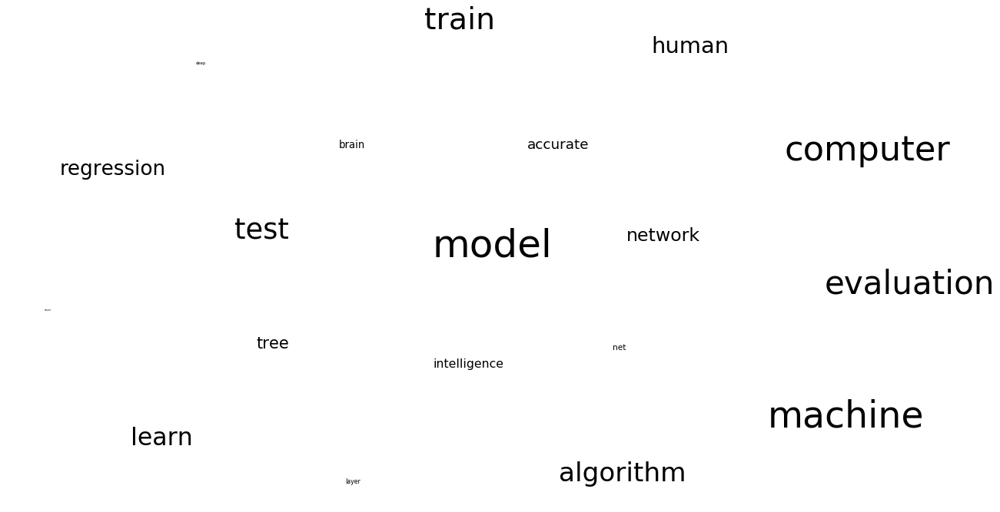

In [133]:
fig = plt.figure(figsize = (20,12))
ax = fig.add_subplot(111)
ax.set_frame_on(False)
plt.scatter(tsneWordsMed[:, 0], tsneWordsMed[:, 1], alpha = 0) #Making the points invisible
for i, word in enumerate(medTargetWords):
    ax.annotate(word, (tsneWordsMed[:, 0][i],tsneWordsMed[:, 1][i]), size =  50 * (len(medTargetWords) - i) / len(medTargetWords))
plt.xticks(())
plt.yticks(())
plt.show()

In [134]:
# define some convenient functions for getting dimensions
def normalize(vector):
    normalized_vector = vector / np.linalg.norm(vector)
    return normalized_vector

def dimension(model, positives, negatives):
    diff = sum([normalize(model[x]) for x in positives]) - sum([normalize(model[y]) for y in negatives])
    return diff

In [135]:
# calculate three dimensions
Models = dimension(med_model,['regression', 'linear', 'nonlinear'], ['network', 'layer','neural'])
Evaluations = dimension(med_model,['right','well','accurate','high'],['wrong','bad','mistake','low'])
Sentiments = dimension(med_model,['fun','simple','great'],['naive','hate','bad'])

In [136]:
# set three categories of words
methods = ["regression", "network", "tree", "bayes", "logistic"]

algorithms = ["recursive", "random", "loop"]

criteria  = ["recall", "precision", "accurate"]

In [137]:
# define a function to project words in a word list to each of the three dimensions
def makeDF(model, word_list):
    m = []
    e = []
    s = []
    for word in word_list:
        m.append(sklearn.metrics.pairwise.cosine_similarity(med_model[word].reshape(1,-1), Models.reshape(1,-1))[0][0])
        e.append(sklearn.metrics.pairwise.cosine_similarity(med_model[word].reshape(1,-1), Evaluations.reshape(1,-1))[0][0])
        s.append(sklearn.metrics.pairwise.cosine_similarity(med_model[word].reshape(1,-1), Sentiments.reshape(1,-1))[0][0])
    df = pandas.DataFrame({'model': m, 'evaluations': e, 'sentiments': s}, index = word_list)
    return df

In [139]:
# get projections
mdf = makeDF(med_model, methods) 
adf = makeDF(med_model, algorithms)
cdf = makeDF(med_model, criteria)

In [138]:
# define some useful functions for plaoting
def Coloring(Series):
    x = Series.values
    y = x-x.min()
    z = y/y.max()
    c = list(plt.cm.rainbow(z))
    return c

def PlotDimension(ax,df, dim):
    ax.set_frame_on(False)
    ax.set_title(dim, fontsize = 20)
    colors = Coloring(df[dim])
    for i, word in enumerate(df.index):
        ax.annotate(word, (0, df[dim][i]), color = colors[i], alpha = 0.6, fontsize = 12)
    MaxY = df[dim].max()
    MinY = df[dim].min()
    plt.ylim(MinY,MaxY)
    plt.yticks(())
    plt.xticks(())

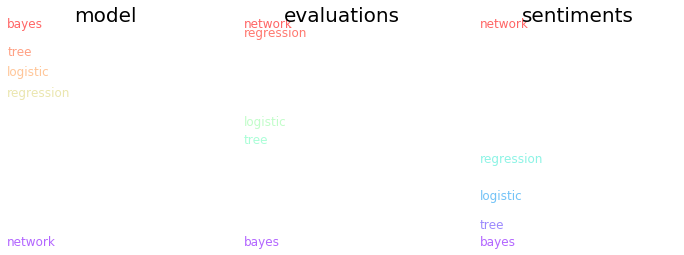

In [140]:
# plot methods words in each of the three dimensions
fig = plt.figure(figsize = (12,4))
ax1 = fig.add_subplot(131)
PlotDimension(ax1, mdf, 'model')
ax2 = fig.add_subplot(132)
PlotDimension(ax2, mdf, 'evaluations')
ax3 = fig.add_subplot(133)
PlotDimension(ax3, mdf, 'sentiments')
plt.show()

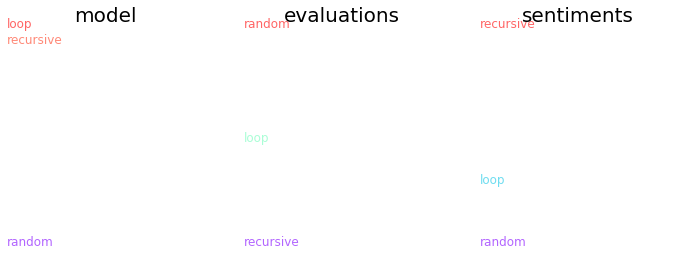

In [141]:
# plot algorithm words in each of the three dimensions
fig = plt.figure(figsize = (12,4))
ax1 = fig.add_subplot(131)
PlotDimension(ax1, adf, 'model')
ax2 = fig.add_subplot(132)
PlotDimension(ax2, adf, 'evaluations')
ax3 = fig.add_subplot(133)
PlotDimension(ax3, adf, 'sentiments')
plt.show()

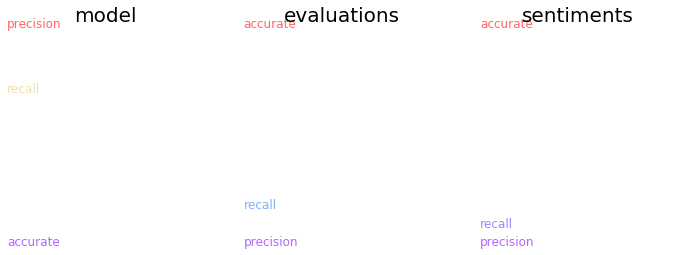

In [142]:
# plot criteria words in each of the three dimensions
fig = plt.figure(figsize = (12,4))
ax1 = fig.add_subplot(131)
PlotDimension(ax1, cdf, 'model')
ax2 = fig.add_subplot(132)
PlotDimension(ax2, cdf, 'evaluations')
ax3 = fig.add_subplot(133)
PlotDimension(ax3, cdf, 'sentiments')
plt.show()

From the results above, we can find that the dimension of evaluation and model explains the most variation in the projection of my words. Since in the medium articles of machine learning or data science, there are huge amount of them discussing the model evaluation and the comparision of performance of different models.